# <font color=orange>Taylor Swift Through Stats</font>

Hi all. While we are waiting for her version of the Fearless album, let us walk you through how her lyrics, production, and music has changed through out the albums. Although she is known for writing hits like `Love Story`, `22`,`Blank Space`, and `cardigan`, she is known for writing relatable heartbreak songs such as `All Too Well` and `You're Not Sorry`.

In this <font color=orange> notebook </font>, we will show how the music of Taylor Swift has changed through albums and genres.

The `lyrics` dataset is scraped from `genius` website using the `genius` package in `R` while the `sound` dataset is created by scraping the `spotify` audio features via `spotipy` package. Finally, the `credits` dataset is scarped from ikipedia. Since the credits are already in table form and there are only nine albums, a little formatting from `Excel` does the trick.

## <font color=orange>Installing the packages and descriptive statistics</font>

In [1]:
import pandas as pd
import numpy as np
import plotly

In [2]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [3]:
ts_credits = pd.read_csv('taylor_swift_credits_df.csv')
ts_lyrics = pd.read_csv('taylor_swift_lyrics_df.csv')
ts_sound = pd.read_csv('taylor_swift_sound_df.csv')
ts_credits_fearless = pd.read_csv('ts_fearless_credits_df.csv')
ts_lyrics_fearless = pd.read_csv('ts_fearless_lyrics_df.csv')
ts_sound_fearless = pd.read_csv('ts_fearless_sound_df.csv')

In [4]:
ts_credits.describe()

,track_number
count,146.000000
mean,8.712329
std,4.857925
min,1.000000
25%,5.000000
50%,9.000000
75%,13.000000
max,19.000000


In [5]:
ts_sound.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,0.590387,0.586563,-7.105261,0.057794,0.310260,0.002972,0.140476,0.423147,124.890479
std,0.114931,0.179556,2.601228,0.059085,0.324039,0.020605,0.076308,0.193926,31.282284
min,0.292000,0.152000,-15.065000,0.023900,0.000176,0.000000,0.031500,0.059600,68.534000
25%,0.528250,0.464000,-8.760750,0.029850,0.037550,0.000000,0.097625,0.270500,96.319500
50%,0.594000,0.608500,-6.694500,0.036100,0.146000,0.000003,0.114000,0.411500,123.211500
75%,0.662000,0.731750,-5.279750,0.056275,0.617250,0.000079,0.145750,0.540250,150.028750
max,0.897000,0.937000,-2.030000,0.519000,0.971000,0.179000,0.415000,0.943000,207.476000


In [6]:
ts_lyrics.describe()

,track_number,line
count,6907.000000,6907.000000
mean,8.139569,27.344288
std,4.559632,17.115412
min,1.000000,1.000000
25%,4.000000,13.000000
50%,8.000000,26.000000
75%,12.000000,39.500000
max,19.000000,80.000000


In [7]:
ts_lyrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6907 entries, 0 to 6906
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   track_number  6907 non-null   int64 
 1   line          6907 non-null   int64 
 2   lyric         6907 non-null   object
 3   track_name    6907 non-null   object
 4   album_name    6907 non-null   object
 5   chorus        6907 non-null   object
dtypes: int64(2), object(4)
memory usage: 323.9+ KB


In [8]:
ts_sound.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_name        142 non-null    object 
 1   album_name        142 non-null    object 
 2   danceability      142 non-null    float64
 3   energy            142 non-null    float64
 4   loudness          142 non-null    float64
 5   speechiness       142 non-null    float64
 6   acousticness      142 non-null    float64
 7   instrumentalness  142 non-null    float64
 8   liveness          142 non-null    float64
 9   valence           142 non-null    float64
 10  tempo             142 non-null    float64
 11  key               142 non-null    object 
 12  mode              142 non-null    object 
dtypes: float64(9), object(4)
memory usage: 14.5+ KB


In [9]:
ts_credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   track_number    146 non-null    int64 
 1   album_name      146 non-null    object
 2   track_name      146 non-null    object
 3   solely_written  146 non-null    object
 4   producers       146 non-null    object
 5   co_writer       103 non-null    object
 6   featuring       10 non-null     object
dtypes: int64(1), object(6)
memory usage: 8.1+ KB


In [10]:
ts_credits.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring
0,1,Taylor Swift,Tim McGraw,No,Nathan Chapman,Liz Rose,NaN
1,2,Taylor Swift,Picture to Burn,No,Nathan Chapman,Liz Rose,NaN
2,3,Taylor Swift,Teardrops on My Guitar,No,Nathan Chapman,Liz Rose,NaN
3,4,Taylor Swift,A Place in This World,No,Nathan Chapman,"Robert Orrall,Aneglo Petraglia",NaN
4,5,Taylor Swift,Cold as You,No,Nathan Chapman,Liz Rose,NaN


The `credits` dataset have the following columns.

1. `track_number` - The track number of the song in the album.
2. `album_name` - The name of the album.
3. `solely_written` - A binary indicator when if Taylor has solely written the album.
4. `producers` - The name of the producers for a track.
5. `co_writer` - The name of the co-writers for a particular song.
6. `featuring` - The featured artist in a track.

In [11]:
ts_sound.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
0,A Perfectly Good Heart,Taylor Swift,0.477,0.735,-5.686,0.0346,0.00502,0.000000,0.1280,0.326,156.035,E,major
1,A Place In This World,Taylor Swift,0.580,0.781,-2.788,0.0305,0.06250,0.000000,0.3170,0.386,115.012,A,major
2,Cold As You,Taylor Swift,0.414,0.489,-5.651,0.0251,0.27200,0.000000,0.1120,0.350,175.662,F,major
3,I'm Only Me When I'm With You,Taylor Swift,0.544,0.912,-3.612,0.0738,0.00543,0.000715,0.0976,0.629,143.983,G#,major
4,Invisible,Taylor Swift,0.618,0.400,-5.485,0.0253,0.62700,0.000000,0.0943,0.189,96.052,G,major


For our next dataset, we have the following definitions. All numeric columns except `loudness` and `Tempo` have range of scores from **0** to **1**. The former typically ranged from **-60** to **0** while the latter is always non-negative. The non-mentioned columns have the same definition as above.

1. `Danceability` - how danceable or suitable for dancing a track is. The higher, the more danceable. `The Archer` and `I Think He Knows`, both from album `Lover`, have the lowest and highest score respectively in this metric.
2. `Valence` - how positive a track musically conveys. The higher, the more positive. `Delicate` from `reputation` and `Shake It Off` from `1989` have the extreme values.
3. `Energy` - how loud, fast, and noisy a track feels. The higher, the more intense it channels. `new year's day` exudes the lowest energy while `Haunted` from `Speak Now` exhibits the opposite.
4. `Tempo` - as measured in beats per minute, how fast a track is. The higher, the faster. `Soon You'll Get Better` and `Lover`, both from album `Lover`, have the highest and lowest score respectively in this metric.
5. `Loudness` - often correlated with `Energy`, it measures how loud a track is. The higher, the louder. `hoax` from `folklore` and `Picture To Burn` from the debut album occupy both extremes.
6. `Speechiness` - it measures the presence of spoken words in a track. The higher, the more significant a spoken word's presence is. While `Teardrops On My Guitar` garnered the lowest score, both `Stay Stay Stay` from `Red` and `I Forgot That You Existed` from `Lover` have the highest score.
7. `Instrumentalness` - it represents the amount of vocals in a track. The ooh's and aah's are counted as vocals. The closer to **1**, the greater likelihood that it has no vocal presence. **Fifty-seven** tracks have a score of zero while `long story short` from `evermore` has the highest score of **0.179**.
8. `Liveness` - it is a likelihood that a track is recorded with a live audience. The higher, the closer it is to a live track. `The Story Of Us` and `Back to December`, both from `Speak Now`, have the lowest and highest likelihoods, accordingly.
9. `Acousticness` - how acoustic a track is. The higher, the more acoustic it is. `State Of Grace` from `Red` has the lowest score while `It's Nice To Have a Friend` from `Lover` has the highest score.
10. `key` - The key of the track.
11. `mode` - A binary when the song is done in `major` or `minor`.

In [12]:
ts_lyrics.head()

,track_number,line,lyric,track_name,album_name,chorus
0,1,1,He said the way my blue eyes shined,Tim McGraw,Taylor Swift,No
1,1,2,Put those Georgia stars to shame that night,Tim McGraw,Taylor Swift,No
2,1,3,"I said, ""That's a lie"" Just a boy in a Chevy t...",Tim McGraw,Taylor Swift,No
3,1,4,That had a tendency of getting stuck,Tim McGraw,Taylor Swift,No
4,1,5,On backroads at night,Tim McGraw,Taylor Swift,No


For our last dataset, we defined the following.

1. `line` - The line number of the track. Since the API of `genius` package is not well-done, there are instances where two lines are labelled as one. Luckily, it does not affect any distinction between a chorus and a non-chorus. 
2. `lyric` - The lyric itself.
3. `chorus` - A binary when a line is a part of a chorus or not.

To check if there is an empty line within the `lyrics` dataset, we checked the `isna()` parameter for the `pandas`.

In [13]:
ts_lyrics[ts_lyrics['lyric'].isna()]

,track_number,line,lyric,track_name,album_name,chorus


There is none hence, we should not worry about applying functions to `NaN`.

In [14]:
ts_lyrics.tail()

,track_number,line,lyric,track_name,album_name,chorus
6902,15,56,Evermore,evermore,evermore,Yes
6903,15,57,Evermore,evermore,evermore,Yes
6904,15,58,Evermore,evermore,evermore,Yes
6905,15,59,This pain wouldn't be for evermore,evermore,evermore,Yes
6906,15,60,Evermore,evermore,evermore,Yes


Before we proceed with joining dataset and knowing that the parameters of those functions are case-sensitive, we convert the strings to `lowercase`.

In [15]:
ts_credits_fearless.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring
0,1,Fearless (Taylor's Version),Fearless,No,"Taylor Swift,Christopher Rowe","Liz Rose,Hillary Lindsey",NaN
1,2,Fearless (Taylor's Version),Fifteen,Yes,"Taylor Swift,Christopher Rowe",NaN,NaN
2,3,Fearless (Taylor's Version),Love Story,Yes,"Taylor Swift,Christopher Rowe",NaN,NaN
3,4,Fearless (Taylor's Version),Hey Stephen,Yes,"Taylor Swift,Christopher Rowe",NaN,NaN
4,5,Fearless (Taylor's Version),White Horse,No,"Taylor Swift,Christopher Rowe",Liz Rose,NaN


In [16]:
ts_lyrics_fearless.head()

,track_number,line,lyric,track_name,album_name,chorus
0,1,1,There's something 'bout the way,Fearless,Fearless (Taylor's Version),No
1,1,2,The street looks when it's just rained,Fearless,Fearless (Taylor's Version),No
2,1,3,"There's a glow off the pavement, you walk me t...",Fearless,Fearless (Taylor's Version),No
3,1,4,And you know I wanna ask you to dance right there,Fearless,Fearless (Taylor's Version),No
4,1,5,"In the middle of the parking lot, yeah",Fearless,Fearless (Taylor's Version),No


In [17]:
ts_sound_fearless.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,Fearless,Fearless (Taylor's Version),0.569,0.741,-4.963,0.0282,0.0122,0.000000,0.3330,0.430,100.118
1,Fifteen,Fearless (Taylor's Version),0.559,0.646,-4.610,0.0272,0.1160,0.000000,0.3200,0.289,95.466
2,Love Story,Fearless (Taylor's Version),0.627,0.792,-4.311,0.0310,0.1300,0.000004,0.0845,0.415,119.054
3,Hey Stephen,Fearless (Taylor's Version),0.788,0.571,-6.135,0.0296,0.1060,0.000000,0.0934,0.797,115.990
4,White Horse,Fearless (Taylor's Version),0.423,0.517,-7.377,0.0486,0.3690,0.000000,0.1770,0.366,185.262


In [18]:
def string_lower(name):
    if isinstance(name,str):
        return name.lower()
    else:
        return str(name).lower()

Using the `apply` function, we formatted the lyrics, track names, album names, and keys.

In [19]:
ts_lyrics["track_name"] = ts_lyrics["track_name"].apply(string_lower)
ts_lyrics["album_name"] = ts_lyrics["album_name"].apply(string_lower)
ts_lyrics["lyric"] = ts_lyrics["lyric"].apply(string_lower)
ts_sound["track_name"] = ts_sound["track_name"].apply(string_lower)
ts_sound["album_name"] = ts_sound["album_name"].apply(string_lower)
ts_sound["key"] = ts_sound["key"].apply(string_lower)
ts_credits["track_name"] = ts_credits["track_name"].apply(string_lower)
ts_credits["album_name"] = ts_credits["album_name"].apply(string_lower)

In [20]:
ts_lyrics_fearless["track_name"] = ts_lyrics_fearless["track_name"].apply(string_lower)
ts_lyrics_fearless["album_name"] = ts_lyrics_fearless["album_name"].apply(string_lower)
ts_lyrics_fearless["lyric"] = ts_lyrics_fearless["lyric"].apply(string_lower)
ts_sound_fearless["track_name"] = ts_sound_fearless["track_name"].apply(string_lower)
ts_sound_fearless["album_name"] = ts_sound_fearless["album_name"].apply(string_lower)
ts_credits_fearless["track_name"] = ts_credits_fearless["track_name"].apply(string_lower)
ts_credits_fearless["album_name"] = ts_credits_fearless["album_name"].apply(string_lower)

Since the function worked for all the columns, we don't see any problem so far. However, we want to check if there is no change in the status of the column across three datasets. Hence, we used the `info` function.

In [21]:
ts_lyrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6907 entries, 0 to 6906
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   track_number  6907 non-null   int64 
 1   line          6907 non-null   int64 
 2   lyric         6907 non-null   object
 3   track_name    6907 non-null   object
 4   album_name    6907 non-null   object
 5   chorus        6907 non-null   object
dtypes: int64(2), object(4)
memory usage: 323.9+ KB


In [22]:
ts_sound.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_name        142 non-null    object 
 1   album_name        142 non-null    object 
 2   danceability      142 non-null    float64
 3   energy            142 non-null    float64
 4   loudness          142 non-null    float64
 5   speechiness       142 non-null    float64
 6   acousticness      142 non-null    float64
 7   instrumentalness  142 non-null    float64
 8   liveness          142 non-null    float64
 9   valence           142 non-null    float64
 10  tempo             142 non-null    float64
 11  key               142 non-null    object 
 12  mode              142 non-null    object 
dtypes: float64(9), object(4)
memory usage: 14.5+ KB


In [23]:
ts_credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   track_number    146 non-null    int64 
 1   album_name      146 non-null    object
 2   track_name      146 non-null    object
 3   solely_written  146 non-null    object
 4   producers       146 non-null    object
 5   co_writer       103 non-null    object
 6   featuring       10 non-null     object
dtypes: int64(1), object(6)
memory usage: 8.1+ KB


To check on the unique tracks from the datasets, we imported the `venn` package and apply it to the `track_name` column.

In [24]:
import venn
ts_lyrics_track = ts_lyrics['track_name'].unique().tolist()
ts_sound_track = ts_sound['track_name'].unique().tolist()
ts_credits_track = ts_credits['track_name'].unique().tolist()

/opt/conda/lib/python3.8/site-packages/venn/_backwards_compatibility.py:15: UserWarning: `get_labels()` is retained for backwards compatibility; use `generate_petal_labels()` or the higher level `venn()` instead
  warn((
/opt/conda/lib/python3.8/site-packages/venn/_backwards_compatibility.py:30: UserWarning: `venn3()` is retained for backwards compatibility; use `venn()` instead
  warn((


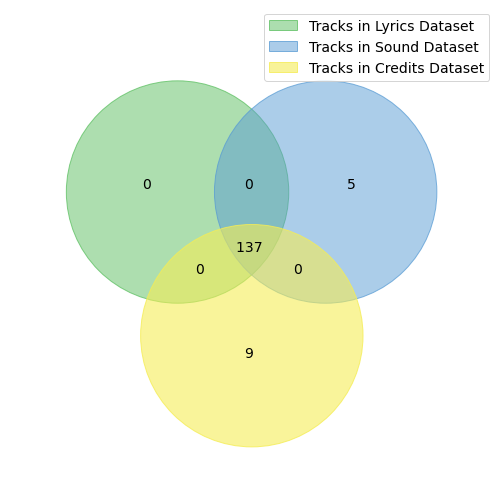

In [25]:
labels = venn.get_labels([set(ts_lyrics_track), set(ts_sound_track),set(ts_credits_track)])
fig, ax = venn.venn3(labels, names=['Tracks in Lyrics Dataset', 'Tracks in Sound Dataset','Tracks in Credits Dataset'])
fig.show()

It is shown that there is **137** common tracks among the datasets. To see the tracks that are removed from the intersection, we used the set difference function.

In [26]:
set(ts_credits_track) - set(ts_lyrics_track)

{'if this was a movie',
 "it's time to go",
 'new romantics',
 'ours',
 'right where you left me',
 'superman',
 'the lakes',
 'wonderland',
 'you are in love'}

In [27]:
set(ts_sound_track) - set(ts_lyrics_track)

{'come in with the rain',
 'jump then fall',
 'superstar',
 'the other side of the door',
 'untouchable'}

The tracks from the deluxe version of  `Fearless`, `Speak Now`, `1989`, `folklore` and `evermore` are not in the lyrics.

## <font color=orange>Exploring the `credits` dataset</font>

We added these dictionaries for our graphs. The `album_color_dictionary` will be used for our visual plots while `album_color_scale` will be used for our heatmaps.

In [28]:
album_color_dictionary = {'taylor swift':'#00a3ad','fearless':'#ddc477','speak now':'#462245','red':'#a02b48','1989':'#cdc6ac','reputation':'#000000','lover':'#dec0fc','folklore':'#bababa','evermore':'#7e5c43'}
album_names_list = list(album_color_dictionary.keys())
album_color_scale = {'taylor swift':'delta','fearless':'solar','speak now':'Agsunset','red':'Reds','1989':'Brwnyl','reputation':'gray','lover':'Picnic','folklore':'oxy','evermore':'balance'}

In [29]:
album_color_dictionary_all = {'taylor swift':'#00a3ad','fearless':'#ddc477','speak now':'#462245','red':'#a02b48','1989':'#cdc6ac','reputation':'#000000','lover':'#dec0fc','folklore':'#bababa','evermore':'#7e5c43',"fearless (taylor's version)":"#c77054"}
album_names_list_all = list(album_color_dictionary_all.keys())
album_color_scale_all = {'taylor swift':'delta','fearless':'solar','speak now':'Agsunset','red':'Reds','1989':'Brwnyl','reputation':'gray','lover':'Picnic','folklore':'oxy','evermore':'balance',"fearless (taylor's version)":'Cividis'}

In [30]:
album_color_dictionary_fear = {'fearless':'#ddc477',"fearless (taylor's version)":"#c77054"}
album_names_list_fear = list(album_color_dictionary_fear.keys())
album_color_scale_fear = {'fearless':'solar',"fearless (taylor's version)":'Cividis'}

In [31]:
ts_credits_all = pd.concat([ts_credits,ts_credits_fearless])
ts_credits_all.reset_index(inplace=True,drop=True)
ts_credits_all.shape

(171, 7)

In [32]:
ts_credits_all['album_name'] = pd.Categorical(ts_credits_all.album_name, categories=album_names_list_all[0:], ordered=True)
ts_credits_all = ts_credits_all.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_credits_all.reset_index(inplace=True,drop=True)

Since our album names are not arranged according to order of release, the `Categorical` function is used for that column.

In [33]:
ts_credits['album_name'] = pd.Categorical(ts_credits.album_name, categories=album_names_list[0:], ordered=True)
ts_credits = ts_credits.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_credits.reset_index(inplace=True,drop=True)

In [34]:
ts_credits['solely_written'].value_counts()

No     103
Yes     43
Name: solely_written, dtype: int64

In [35]:
ts_credits_fearless['solely_written'].value_counts()

No     14
Yes    11
Name: solely_written, dtype: int64

She has solely written **43** out of **146** tracks.

In [36]:
ts_credits_all['producers'].value_counts()

Taylor Swift,Nathan Chapman                           38
Taylor Swift,Jack Antonoff                            27
Aaron Dessner                                         21
Taylor Swift,Christopher Rowe                         19
Max Martin,Shellback                                  16
Nathan Chapman                                        10
Taylor Swift,Aaron Dessner                             5
Taylor Swift,Joel Little                               4
Taylor Swift,Nathan Chapman,Dann Huff                  3
Taylor Swift,Louis Bell,Frank Dukes                    3
Taylor Swift,Ryan Tedder,Noel Zancanella               2
Taylor Swift,Jack Antonoff,Max Martin                  2
Jeff Bhasker                                           2
Dan Wilson                                             2
Max Martin,Shellback,Ali Payami                        2
Max Martin,Shellback,Oscar Holter                      1
Jacknife Lee                                           1
Butch Walker                   

In terms of production credits, she has worked with `Nathan Chapman` the most, followed by `Jack Antonoff`.

In [37]:
ts_credits['co_writer'].value_counts()

Jack Antonoff                                                 20
Aaron Dessner                                                 20
Max Martin,Shellback                                          15
Liz Rose                                                      10
Joel Little                                                    3
Louis Bell,Adam King Feeney                                    3
Ryan Tedder                                                    2
Dan Wilson                                                     2
William Bowery                                                 2
Max Martin,Shellback,Ali Payami                                2
William Bowery,Justin Vernon                                   2
Robert Orrall,Aneglo Petraglia                                 2
Jack Antonoff,Richard Fairbrass,Fred Fairbrass,Rob Manzoli     1
Gary Lightbody,Jacknife Lee                                    1
Jack Antonoff,Annie Clark                                      1
Liz Rose,Brian Maher     

In terms of her co-writers, `Jack Antonoff` has tied with `Aaron Dessner`, the third most in-demand producer of Taylor's.

In [39]:
pd.crosstab(ts_credits_all['album_name'],ts_credits_all['solely_written'])

solely_written,No,Yes
album_name,,
taylor swift,11,3
fearless,6,7
speak now,1,16
red,8,11
1989,15,1
reputation,15,0
lover,15,3
folklore,16,1
evermore,16,1


By using cross-tabulations on her works, she has solely written everything except `If This Was A Movie` from `Speak Now`. Furthermore, she did not solely write any song from `reputation`.

In [40]:
ts_credits[ts_credits['album_name']=='reputation']

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring
79,1,reputation,...ready for it?,No,"Max Martin,Shellback,Ali Payami","Max Martin,Shellback,Ali Payami",NaN
80,2,reputation,end game,No,"Max Martin,Shellback","Max Martin,Shellback,Ed Sheeran,Nayvadius Wilburn","Ed Sheeran,Future"
81,3,reputation,i did something bad,No,"Max Martin,Shellback","Max Martin,Shellback",NaN
82,4,reputation,don't blame me,No,"Max Martin,Shellback","Max Martin,Shellback",NaN
83,5,reputation,delicate,No,"Max Martin,Shellback","Max Martin,Shellback",NaN
84,6,reputation,look what you made me do,No,"Taylor Swift,Jack Antonoff","Jack Antonoff,Richard Fairbrass,Fred Fairbrass...",NaN
85,7,reputation,so it goes…,No,"Max Martin,Shellback,Oscar Gorres","Max Martin,Shellback,Oscar Gorres",NaN
86,8,reputation,gorgeous,No,"Max Martin,Shellback","Max Martin,Shellback",NaN
87,9,reputation,getaway car,No,"Taylor Swift,Jack Antonoff",Jack Antonoff,NaN
88,10,reputation,king of my heart,No,"Max Martin,Shellback","Max Martin,Shellback",NaN


After all, they are either written with `Max Martin` or `Jack Antonoff`.

In [41]:
ts_write_cred = pd.crosstab(ts_credits['co_writer'],ts_credits['album_name'])
ts_write_cred.sort_values(by=album_names_list,ascending = [False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
co_writer,,,,,,,,,
Liz Rose,6,3,0,1,0,0,0,0,0
"Robert Orrall,Aneglo Petraglia",2,0,0,0,0,0,0,0,0
"Brett James,Troy Verges",1,0,0,0,0,0,0,0,0
"Liz Rose,Brian Maher",1,0,0,0,0,0,0,0,0
Robert Orrall,1,0,0,0,0,0,0,0,0
Colbie Caillat,0,1,0,0,0,0,0,0,0
John Rich,0,1,0,0,0,0,0,0,0
"Liz Rose,Hillary Lindsey",0,1,0,0,0,0,0,0,0
Martin Johnson,0,0,1,0,0,0,0,0,0


While `Liz Rose` alone has helped taylor in **9** tracks from `Taylor Swift` and `Fearless`, the tandem `Max Martin` and `Shellback` alone have written songs from `1989` and `reputation`. `Jack Antonoff` is the main co-writer in `Lover` while `Aaron Dessner` has written most tracks from `folklore` and `evermore`.

In [42]:
ts_prod_cred = pd.crosstab(ts_credits['producers'],ts_credits['album_name'])
ts_prod_cred.sort_values(by=album_names_list,ascending = [False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
producers,,,,,,,,,
Nathan Chapman,10,0,0,0,0,0,0,0,0
"Brett James,Troy Verges",1,0,0,0,0,0,0,0,0
Robert Orrall,1,0,0,0,0,0,0,0,0
"Robert Orrall,Aneglo Petraglia",1,0,0,0,0,0,0,0,0
"Robert Orrall,Nathan Chapman",1,0,0,0,0,0,0,0,0
"Taylor Swift,Nathan Chapman",0,13,17,7,1,0,0,0,0
"Max Martin,Shellback",0,0,0,3,7,6,0,0,0
"Taylor Swift,Nathan Chapman,Dann Huff",0,0,0,3,0,0,0,0,0
Dan Wilson,0,0,0,2,0,0,0,0,0


`Nathan Chapman` is the main producer from `Taylor Swift` to `Red` while `Max Martin` has worked with her on the production side for `1989` and `reputation`. `Jack Antonoff`appeared from `post-Red` onwards while `Aaron Dessner` have produced for `folklore` and `evermore` only.

To check how many songs a particular co-writer or producer have worked on, we used the function to explore the list into rows of data.

In [43]:
def convert_to_list(string):
    if isinstance(string,str):
        return string.split(',')
    else:
        return []

In [44]:
ts_credits['producers'] = ts_credits['producers'].apply(convert_to_list)
ts_credits['co_writer'] = ts_credits['co_writer'].apply(convert_to_list)

In [45]:
ts_credits_all['producers'] = ts_credits_all['producers'].apply(convert_to_list)
ts_credits_all['co_writer'] = ts_credits_all['co_writer'].apply(convert_to_list)

In [46]:
ts_producers_list = ts_credits['producers'].tolist()
ts_writers_list = ts_credits['co_writer'].tolist()

In [47]:
ts_producers_list_all = ts_credits_all['producers'].tolist()
ts_writers_list_all = ts_credits_all['co_writer'].tolist()

In [48]:
ts_producers_list[0:10]

[['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Robert Orrall', 'Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman'],
 ['Nathan Chapman']]

In [49]:
ts_writers_list[0:10]

[['Liz Rose'],
 ['Liz Rose'],
 ['Liz Rose'],
 ['Robert Orrall', 'Aneglo Petraglia'],
 ['Liz Rose'],
 [],
 ['Liz Rose'],
 ['Liz Rose'],
 [],
 ['Liz Rose', 'Brian Maher']]

In [50]:
ts_producers_list = [item for sublist in ts_producers_list for item in sublist]
ts_writers_list = [item for sublist in ts_writers_list for item in sublist]

In [51]:
ts_producers_list_all = [item for sublist in ts_producers_list_all for item in sublist]
ts_writers_list_all = [item for sublist in ts_writers_list_all for item in sublist]

To get the count of each writer in descending order, we used the `Counter` package

In [52]:
from collections import Counter
Counter(ts_producers_list).most_common(10)

[('Taylor Swift', 82),
 ('Nathan Chapman', 52),
 ('Jack Antonoff', 28),
 ('Aaron Dessner', 27),
 ('Max Martin', 24),
 ('Shellback', 21),
 ('Joel Little', 4),
 ('Robert Orrall', 3),
 ('Dann Huff', 3),
 ('Louis Bell', 3)]

`Taylor Swift` has produced **82** of her works, which is followed by `Nathan Chapman's` **52**, `Jack Antonoff's` **28**, and `Aaron Dessner's` **27**.

In [53]:
Counter(ts_writers_list).most_common(10)

[('Jack Antonoff', 24),
 ('Aaron Dessner', 22),
 ('Max Martin', 21),
 ('Shellback', 20),
 ('Liz Rose', 12),
 ('William Bowery', 5),
 ('Joel Little', 4),
 ('Robert Orrall', 3),
 ('Louis Bell', 3),
 ('Adam King Feeney', 3)]

Across all albums, `Jack Antonoff` and `Aaron Dessner` are her main co-writers. These two writers/producers together have written for two song, `ivy` from `evermore` and `betty` from `folklore`.

In [54]:
Counter(ts_producers_list_all).most_common(10)

[('Taylor Swift', 107),
 ('Nathan Chapman', 52),
 ('Jack Antonoff', 32),
 ('Aaron Dessner', 29),
 ('Max Martin', 24),
 ('Shellback', 21),
 ('Christopher Rowe', 19),
 ('Joel Little', 4),
 ('Robert Orrall', 3),
 ('Dann Huff', 3)]

In [55]:
Counter(ts_writers_list_all).most_common(10)

[('Jack Antonoff', 24),
 ('Aaron Dessner', 22),
 ('Max Martin', 21),
 ('Liz Rose', 20),
 ('Shellback', 20),
 ('William Bowery', 5),
 ('Joel Little', 4),
 ('Robert Orrall', 3),
 ('Louis Bell', 3),
 ('Adam King Feeney', 3)]

To check what albums did each writer and producer have worked on, we exploded both `co_writer` and `producers` columns to create a proper cross tabulation.

In [56]:
ts_credits_all.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring
0,1,taylor swift,tim mcgraw,No,[Nathan Chapman],[Liz Rose],NaN
1,2,taylor swift,picture to burn,No,[Nathan Chapman],[Liz Rose],NaN
2,3,taylor swift,teardrops on my guitar,No,[Nathan Chapman],[Liz Rose],NaN
3,4,taylor swift,a place in this world,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]",NaN
4,5,taylor swift,cold as you,No,[Nathan Chapman],[Liz Rose],NaN


In [57]:
ts_credits_simple = ts_credits[['album_name','track_name','producers','co_writer']]
ts_credits_simple.head()

,album_name,track_name,producers,co_writer
0,taylor swift,tim mcgraw,[Nathan Chapman],[Liz Rose]
1,taylor swift,picture to burn,[Nathan Chapman],[Liz Rose]
2,taylor swift,teardrops on my guitar,[Nathan Chapman],[Liz Rose]
3,taylor swift,a place in this world,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]"
4,taylor swift,cold as you,[Nathan Chapman],[Liz Rose]


In [58]:
ts_credits_simple_all = ts_credits_all[['album_name','track_name','producers','co_writer']]
ts_credits_simple_all.head()

,album_name,track_name,producers,co_writer
0,taylor swift,tim mcgraw,[Nathan Chapman],[Liz Rose]
1,taylor swift,picture to burn,[Nathan Chapman],[Liz Rose]
2,taylor swift,teardrops on my guitar,[Nathan Chapman],[Liz Rose]
3,taylor swift,a place in this world,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]"
4,taylor swift,cold as you,[Nathan Chapman],[Liz Rose]


In [59]:
ts_crosstab_prod = pd.crosstab(ts_credits_simple.explode('producers')['producers'].reset_index()['producers'],ts_credits_simple.explode('producers')['album_name'].reset_index()['album_name'])
ts_crosstab_prod.sort_values(by=album_names_list,ascending = [False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
producers,,,,,,,,,
Nathan Chapman,11,13,17,10,1,0,0,0,0
Robert Orrall,3,0,0,0,0,0,0,0,0
Aneglo Petraglia,1,0,0,0,0,0,0,0,0
Brett James,1,0,0,0,0,0,0,0,0
Troy Verges,1,0,0,0,0,0,0,0,0
Taylor Swift,0,13,17,10,7,6,18,7,4
Max Martin,0,0,0,3,12,9,0,0,0
Shellback,0,0,0,3,9,9,0,0,0
Dann Huff,0,0,0,3,0,0,0,0,0


In [60]:
ts_crosstab_prod_all = pd.crosstab(ts_credits_simple_all.explode('producers')['producers'].reset_index()['producers'],ts_credits_simple_all.explode('producers')['album_name'].reset_index()['album_name'])
ts_crosstab_prod_all.sort_values(by=album_names_list_all,ascending = [False,False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore,fearless (taylor's version)
producers,,,,,,,,,,
Nathan Chapman,11,13,17,10,1,0,0,0,0,0
Robert Orrall,3,0,0,0,0,0,0,0,0,0
Aneglo Petraglia,1,0,0,0,0,0,0,0,0,0
Brett James,1,0,0,0,0,0,0,0,0,0
Troy Verges,1,0,0,0,0,0,0,0,0,0
Taylor Swift,0,13,17,10,7,6,18,7,4,25
Max Martin,0,0,0,3,12,9,0,0,0,0
Shellback,0,0,0,3,9,9,0,0,0,0
Dann Huff,0,0,0,3,0,0,0,0,0,0


Taylor has started producing her songs from `Fearless` onwards. In particular, she has become more hands-on in producing songs from `Speak Now` and `Lover`

In [61]:
ts_crosstab_write = pd.crosstab(ts_credits_simple.explode('co_writer')['co_writer'].reset_index()['co_writer'],ts_credits_simple.explode('co_writer')['album_name'].reset_index()['album_name'])
ts_crosstab_write.sort_values(by=album_names_list,ascending = [False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
co_writer,,,,,,,,,
Liz Rose,7,4,0,1,0,0,0,0,0
Robert Orrall,3,0,0,0,0,0,0,0,0
Aneglo Petraglia,2,0,0,0,0,0,0,0,0
Brett James,1,0,0,0,0,0,0,0,0
Brian Maher,1,0,0,0,0,0,0,0,0
Troy Verges,1,0,0,0,0,0,0,0,0
Colbie Caillat,0,1,0,0,0,0,0,0,0
Hillary Lindsey,0,1,0,0,0,0,0,0,0
John Rich,0,1,0,0,0,0,0,0,0


In [62]:
ts_crosstab_write_all = pd.crosstab(ts_credits_simple_all.explode('co_writer')['co_writer'].reset_index()['co_writer'],ts_credits_simple_all.explode('co_writer')['album_name'].reset_index()['album_name'])
ts_crosstab_write_all.sort_values(by=album_names_list_all,ascending = [False,False,False,False,False,False,False,False,False,False])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore,fearless (taylor's version)
co_writer,,,,,,,,,,
Liz Rose,7,4,0,1,0,0,0,0,0,8
Robert Orrall,3,0,0,0,0,0,0,0,0,0
Aneglo Petraglia,2,0,0,0,0,0,0,0,0,0
Brett James,1,0,0,0,0,0,0,0,0,0
Brian Maher,1,0,0,0,0,0,0,0,0,0
Troy Verges,1,0,0,0,0,0,0,0,0,0
Colbie Caillat,0,1,0,0,0,0,0,0,0,1
Hillary Lindsey,0,1,0,0,0,0,0,0,0,1
John Rich,0,1,0,0,0,0,0,0,0,1


From different eras, she has **five** main co-writers, namely `Liz Rose`, `Max Martin`, `Shellback`, `Jack Antonoff`, and `Aaron Dessner`. `Liz Rose` has never worked with any of the other writers while `Max Martin` and `Jack Antonoff` work for **two songs** from `1989`, `Out Of The Woods` and `You Are In Love`.  Furthermore, the tandem `Max Martin` and `Shellback` together has co-written **20** out **21** songs, in which only `Max Martin` has co-written `All You Had To Do Was Stay` from 1989.

In [63]:
ts_credits_all.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring
0,1,taylor swift,tim mcgraw,No,[Nathan Chapman],[Liz Rose],NaN
1,2,taylor swift,picture to burn,No,[Nathan Chapman],[Liz Rose],NaN
2,3,taylor swift,teardrops on my guitar,No,[Nathan Chapman],[Liz Rose],NaN
3,4,taylor swift,a place in this world,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]",NaN
4,5,taylor swift,cold as you,No,[Nathan Chapman],[Liz Rose],NaN


To check who liked to work with whom the most, the following block of codes will help create a network of co-writers and producers. The`combinations` package from  `itertools` wil create pairs of who worked with each other while `networkx` will graph the network required.

In [64]:
def length_of_list(row):
    if len(row) > 1:
        return 'Yes'
    else:
        return 'No'

In [65]:
ts_credits['more_prod'] = ts_credits['producers'].apply(length_of_list)
ts_credits['more_write'] = ts_credits['co_writer'].apply(length_of_list)

In [66]:
ts_credits_all['more_prod'] = ts_credits_all['producers'].apply(length_of_list)
ts_credits_all['more_write'] = ts_credits_all['co_writer'].apply(length_of_list)

In [67]:
ts_credits['more_prod'].value_counts()

Yes    108
No      38
Name: more_prod, dtype: int64

In [68]:
ts_credits_all['more_prod'].value_counts()

Yes    133
No      38
Name: more_prod, dtype: int64

In [69]:
ts_credits['more_write'].value_counts()

No     109
Yes     37
Name: more_write, dtype: int64

In this case more than two have written **37** songs while at least two have produced **38** songs.

In [70]:
pd.crosstab(ts_credits['more_prod'],ts_credits['more_write'])

more_write,No,Yes
more_prod,,
No,33,5
Yes,76,32


In [71]:
pd.crosstab(ts_credits_all['more_prod'],ts_credits_all['more_write'])

more_write,No,Yes
more_prod,,
No,33,5
Yes,98,35


In [72]:
ts_cred_net_prod = ts_credits[ts_credits['more_prod'] == 'Yes']
ts_cred_net_write = ts_credits[ts_credits['more_write'] == 'Yes']
ts_cred_net_prod.reset_index(inplace=True,drop=True)
ts_cred_net_write.reset_index(inplace=True,drop=True)

In [73]:
ts_cred_net_prod_all = ts_credits_all[ts_credits_all['more_prod'] == 'Yes']
ts_cred_net_write_all = ts_credits_all[ts_credits_all['more_write'] == 'Yes']
ts_cred_net_prod_all.reset_index(inplace=True,drop=True)
ts_cred_net_write_all.reset_index(inplace=True,drop=True)

In [74]:
ts_cred_net_prod.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring,more_prod,more_write
0,6,taylor swift,the outside,Yes,"[Robert Orrall, Nathan Chapman]",[],NaN,Yes,No
1,12,taylor swift,i'm only me when i'm with you,No,"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia]",NaN,Yes,Yes
2,14,taylor swift,a perfectly good heart,No,"[Brett James, Troy Verges]","[Brett James, Troy Verges]",NaN,Yes,Yes
3,1,fearless,fearless,No,"[Taylor Swift, Nathan Chapman]","[Liz Rose, Hillary Lindsey]",NaN,Yes,Yes
4,2,fearless,fifteen,Yes,"[Taylor Swift, Nathan Chapman]",[],NaN,Yes,No


In [75]:
ts_cred_net_write.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring,more_prod,more_write
0,4,taylor swift,a place in this world,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]",NaN,No,Yes
1,10,taylor swift,mary's song (oh my my my),No,[Nathan Chapman],"[Liz Rose, Brian Maher]",NaN,No,Yes
2,12,taylor swift,i'm only me when i'm with you,No,"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia]",NaN,Yes,Yes
3,14,taylor swift,a perfectly good heart,No,"[Brett James, Troy Verges]","[Brett James, Troy Verges]",NaN,Yes,Yes
4,1,fearless,fearless,No,"[Taylor Swift, Nathan Chapman]","[Liz Rose, Hillary Lindsey]",NaN,Yes,Yes


In [76]:
ts_credits_all[ts_credits_all['more_prod'] == 'No']['producers'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas/_libs/hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[Aaron Dessner]     21
[Nathan Chapman]    10
[Dan Wilson]         2
[Jeff Bhasker]       2
[Robert Orrall]      1
[Jacknife Lee]       1
[Butch Walker]       1
Name: producers, dtype: int64

In [77]:
ts_credits_all[ts_credits_all['more_write'] == 'No']['co_writer'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas/_libs/hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[]                   54
[Aaron Dessner]      20
[Jack Antonoff]      20
[Liz Rose]           17
[Joel Little]         3
[Colbie Caillat]      2
[Dan Wilson]          2
[Ryan Tedder]         2
[John Rich]           2
[William Bowery]      2
[Max Martin]          1
[Imogen Heap]         1
[Scooter Caruson]     1
[Tommy Lee James]     1
[Robert Orrall]       1
[Ed Sheeran]          1
[Martin Johnson]      1
Name: co_writer, dtype: int64

In [78]:
ts_prod_pair_list = ts_cred_net_prod['producers'].tolist()
ts_write_pair_list = ts_cred_net_write['co_writer'].tolist()

In [79]:
ts_prod_pair_list_all = ts_cred_net_prod_all['producers'].tolist()
ts_write_pair_list_all = ts_cred_net_write_all['co_writer'].tolist()

In [80]:
from itertools import combinations
ts_write_edge = []
for write in ts_write_pair_list:
    res = list(combinations(write, 2))
    ts_write_edge.extend(res)
ts_write_edge_count = dict(Counter(tuple(sorted(t)) for t in ts_write_edge))

In [81]:
ts_write_edge = []
for write in ts_write_pair_list_all:
    res = list(combinations(write, 2))
    ts_write_edge.extend(res)
ts_write_edge_count_all = dict(Counter(tuple(sorted(t)) for t in ts_write_edge))

In [82]:
ts_prod_edge = []
for prod in ts_prod_pair_list:
    res = list(combinations(prod, 2))
    ts_prod_edge.extend(res)
ts_prod_edge_count = dict(Counter(tuple(sorted(t)) for t in ts_prod_edge))

In [83]:
ts_prod_edge = []
for prod in ts_prod_pair_list_all:
    res = list(combinations(prod, 2))
    ts_prod_edge.extend(res)
ts_prod_edge_count_all = dict(Counter(tuple(sorted(t)) for t in ts_prod_edge))

After getting tht combinations of pairs, we have created an `edgelist` dataframe featuring the number of counts a pair has worked on.

In [84]:
ts_fir_tuple_prod = [name[0] for name in list(ts_prod_edge_count.keys())]
ts_sec_tuple_prod = [name[1] for name in list(ts_prod_edge_count.keys())]
ts_val_tuple_prod = list(ts_prod_edge_count.values())

In [85]:
ts_prod_edge_list = pd.DataFrame(list(zip(ts_fir_tuple_prod,ts_sec_tuple_prod,ts_val_tuple_prod)),columns=['name_a','name_b','value'])

In [86]:
ts_fir_tuple_prod_all = [name[0] for name in list(ts_prod_edge_count_all.keys())]
ts_sec_tuple_prod_all = [name[1] for name in list(ts_prod_edge_count_all.keys())]
ts_val_tuple_prod_all = list(ts_prod_edge_count_all.values())

In [87]:
ts_prod_edge_list_all = pd.DataFrame(list(zip(ts_fir_tuple_prod_all,ts_sec_tuple_prod_all,ts_val_tuple_prod_all)),columns=['name_a','name_b','value'])

In [88]:
ts_fir_tuple_write = [name[0] for name in list(ts_write_edge_count.keys())]
ts_sec_tuple_write = [name[1] for name in list(ts_write_edge_count.keys())]
ts_val_tuple_write = list(ts_write_edge_count.values())

In [89]:
ts_write_edge_list = pd.DataFrame(list(zip(ts_fir_tuple_write,ts_sec_tuple_write,ts_val_tuple_write)),columns=['name_a','name_b','value'])

In [90]:
ts_fir_tuple_write_all = [name[0] for name in list(ts_write_edge_count_all.keys())]
ts_sec_tuple_write_all = [name[1] for name in list(ts_write_edge_count_all.keys())]
ts_val_tuple_write_all = list(ts_write_edge_count_all.values())

In [91]:
ts_write_edge_list_all = pd.DataFrame(list(zip(ts_fir_tuple_write_all,ts_sec_tuple_write_all,ts_val_tuple_write_all)),columns=['name_a','name_b','value'])

In [92]:
ts_prod_edge_list = ts_prod_edge_list.sort_values(by=['value'],ascending=False)
ts_prod_edge_list.reset_index(drop=True,inplace=True)
ts_prod_edge_list.head(10)

,name_a,name_b,value
0,Nathan Chapman,Taylor Swift,41
1,Jack Antonoff,Taylor Swift,28
2,Max Martin,Shellback,21
3,Joel Little,Taylor Swift,4
4,Aaron Dessner,Taylor Swift,4
5,Louis Bell,Taylor Swift,3
6,Frank Dukes,Louis Bell,3
7,Jack Antonoff,Max Martin,3
8,Max Martin,Taylor Swift,3
9,Frank Dukes,Taylor Swift,3


In [93]:
ts_prod_edge_list_all = ts_prod_edge_list_all.sort_values(by=['value'],ascending=False)
ts_prod_edge_list_all.reset_index(drop=True,inplace=True)
ts_prod_edge_list_all.head(10)

,name_a,name_b,value
0,Nathan Chapman,Taylor Swift,41
1,Jack Antonoff,Taylor Swift,32
2,Max Martin,Shellback,21
3,Christopher Rowe,Taylor Swift,19
4,Aaron Dessner,Taylor Swift,6
5,Joel Little,Taylor Swift,4
6,Dann Huff,Taylor Swift,3
7,Louis Bell,Taylor Swift,3
8,Frank Dukes,Louis Bell,3
9,Dann Huff,Nathan Chapman,3


Excluding the top pair, the rest of the top 10 are the pairs that worked on songs `post-Red`.As shown by the cross-tabulations above, she started having more producers from `Red` onwards.

In [94]:
ts_write_edge_list = ts_write_edge_list.sort_values(by=['value'],ascending=False)
ts_write_edge_list.reset_index(drop=True,inplace=True)
ts_write_edge_list.head(10)

,name_a,name_b,value
0,Max Martin,Shellback,20
1,Adam King Feeney,Louis Bell,3
2,Aneglo Petraglia,Robert Orrall,2
3,Ali Payami,Max Martin,2
4,Ali Payami,Shellback,2
5,Justin Vernon,William Bowery,2
6,Jack Antonoff,Mark Anthony Spears,1
7,Max Martin,Oscar Holter,1
8,Oscar Holter,Shellback,1
9,Annie Clark,Jack Antonoff,1


In [95]:
ts_write_edge_list_all = ts_write_edge_list_all.sort_values(by=['value'],ascending=False)
ts_write_edge_list_all.reset_index(drop=True,inplace=True)
ts_write_edge_list_all.head(10)

,name_a,name_b,value
0,Max Martin,Shellback,20
1,Adam King Feeney,Louis Bell,3
2,Aneglo Petraglia,Robert Orrall,2
3,Justin Vernon,William Bowery,2
4,Hillary Lindsey,Liz Rose,2
5,Ali Payami,Max Martin,2
6,Ali Payami,Shellback,2
7,Annie Clark,Jack Antonoff,1
8,Cautious Clay,Jack Antonoff,1
9,Jack Antonoff,Mark Anthony Spears,1


In [96]:
ts_prod_edge_list.to_csv('ts_network_prod.csv',index=False)
ts_write_edge_list.to_csv('ts_network_write.csv',index=False)
ts_prod_edge_list_all.to_csv('ts_network_prod_all.csv',index=False)
ts_write_edge_list_all.to_csv('ts_network_write_all.csv',index=False)

The top 1 pair has written more songs than the rest of the top 10 combined. Excluding the top 3, the pairs have worked on songs from `Red` onwards.

In [97]:
import networkx as nx

In [98]:
G_prod = nx.from_pandas_edgelist(ts_prod_edge_list_all,'name_a','name_b', edge_attr='value')

In the next function, we used the depth first tsrategy to find cycles for our created netwwork.

In [99]:
def dfs(graph, start, end):
    fringe = [(start, [])]
    while fringe:
        state, path = fringe.pop()
        if path and state == end:
            yield path
            continue
        for next_state in graph[state]:
            if next_state in path:
                continue
            fringe.append((next_state, path+[next_state]))

In [100]:
cycles = [[node]+path  for node in G_prod for path in dfs(G_prod, node, node)]
cycles = [cycle for cycle in cycles if len(cycle)==4]
cycles = [set(cycle) for cycle in cycles]
from collections import OrderedDict
cycles = [set(i) for i in OrderedDict.fromkeys(frozenset(item) for item in cycles)]
cycles

[{'Dann Huff', 'Nathan Chapman', 'Taylor Swift'},
 {'Greg Kurstin', 'Max Martin', 'Taylor Swift'},
 {'Greg Kurstin', 'Jack Antonoff', 'Taylor Swift'},
 {'Jack Antonoff', 'Sounwave', 'Taylor Swift'},
 {'Noel Zancanella', 'Ryan Tedder', 'Taylor Swift'},
 {'Frank Dukes', 'Louis Bell', 'Taylor Swift'},
 {'Jack Antonoff', 'Max Martin', 'Taylor Swift'},
 {'Aaron Dessner', 'Jack Antonoff', 'Taylor Swift'},
 {'Greg Kurstin', 'Jack Antonoff', 'Max Martin'},
 {'Mattman & Robin', 'Max Martin', 'Shellback'},
 {'Max Martin', 'Oscar Gorres', 'Shellback'},
 {'Max Martin', 'Oscar Holter', 'Shellback'},
 {'Ali Payami', 'Max Martin', 'Shellback'},
 {'Aaron Dessner', 'BJ Burton', 'James Mcalister'}]

In [101]:
G_write = nx.from_pandas_edgelist(ts_write_edge_list_all,'name_a','name_b', edge_attr='value')

In [102]:
cycles = [[node]+path  for node in G_write for path in dfs(G_write, node, node)]
cycles = [cycle for cycle in cycles if len(cycle)==4]
cycles = [set(cycle) for cycle in cycles]
from collections import OrderedDict
cycles = [set(i) for i in OrderedDict.fromkeys(frozenset(item) for item in cycles)]
cycles

[{'Ed Sheeran', 'Max Martin', 'Shellback'},
 {'Ed Sheeran', 'Max Martin', 'Nayvadius Wilburn'},
 {'Max Martin', 'Nayvadius Wilburn', 'Shellback'},
 {'Max Martin', 'Oscar Gorres', 'Shellback'},
 {'Max Martin', 'Oscar Holter', 'Shellback'},
 {'Ali Payami', 'Max Martin', 'Shellback'},
 {'Ed Sheeran', 'Nayvadius Wilburn', 'Shellback'},
 {'Aaron Dessner', 'Bryce Dessner', 'William Bowery'},
 {'Fred Fairbrass', 'Jack Antonoff', 'Richard Fairbrass'},
 {'Jack Antonoff', 'Richard Fairbrass', 'Rob Manzoli'},
 {'Fred Fairbrass', 'Jack Antonoff', 'Rob Manzoli'},
 {'Cautious Clay', 'Jack Antonoff', 'Mark Anthony Spears'},
 {'Cary Barlowe', 'Nathan Barlowe', 'Tommy Lee James'},
 {'Fred Fairbrass', 'Richard Fairbrass', 'Rob Manzoli'}]

In [103]:
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

In [104]:
G_prod.nodes()

NodeView(('Nathan Chapman', 'Taylor Swift', 'Jack Antonoff', 'Max Martin', 'Shellback', 'Christopher Rowe', 'Aaron Dessner', 'Joel Little', 'Dann Huff', 'Louis Bell', 'Frank Dukes', 'Ali Payami', 'Noel Zancanella', 'Ryan Tedder', 'James Mcalister', 'BJ Burton', 'Bryce Dessner', 'Sounwave', 'Robert Orrall', 'Oscar Holter', 'Oscar Gorres', 'Imogen Heap', 'Aneglo Petraglia', 'Greg Kurstin', 'Mattman & Robin', 'Brett James', 'Troy Verges'))

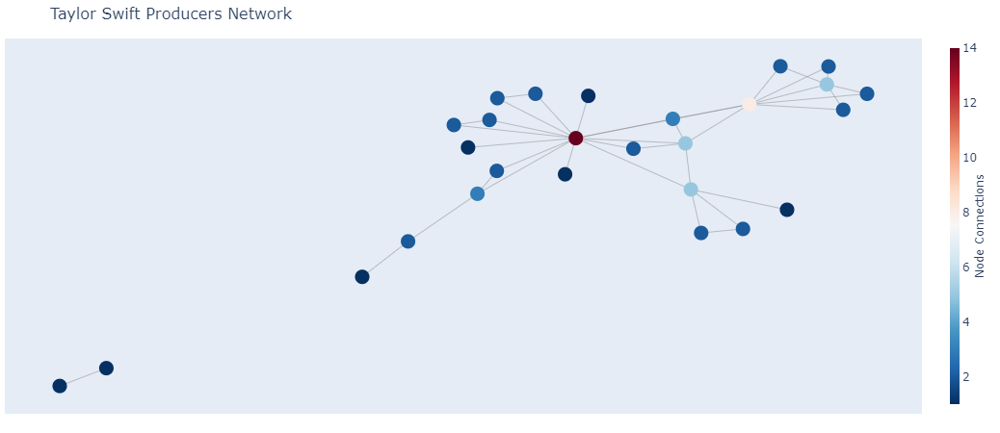

In [105]:
pos = nx.spring_layout(G_prod)
for n, p in pos.items():
    G_prod.nodes[n]['pos'] = p
    
edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')

for edge in G_prod.edges():
    x0, y0 = G_prod.nodes[edge[0]]['pos']
    x1, y1 = G_prod.nodes[edge[1]]['pos']
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])
    
node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='RdBu',
        reversescale=True,
        color=[],
        size=15,
        colorbar=dict(
            thickness=10,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0)))

for node in G_prod.nodes():
    x, y = G_prod.nodes[node]['pos']
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

for node, adjacencies in enumerate(G_prod.adjacency()):
    node_trace['marker']['color']+=tuple([len(adjacencies[1])])
    node_info = adjacencies[0] +' # of connections: '+str(len(adjacencies[1]))
    node_trace['text']+=tuple([node_info])
    
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Taylor Swift Producers Network',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.show()

All pairs are connected except the one who produced `A Perfectly Good Heart` from the first album. For the albums from `Red` onwards, there are three main producers. In fact `Jack Antonoff` has worked with `Max Martin` in `1989` and `reputation` while the former worked with `Aaron Dessner` in `folklore` and `evermore`. 

In [106]:
fig.write_html("taylor_network_prod.html",include_plotlyjs="cdn")

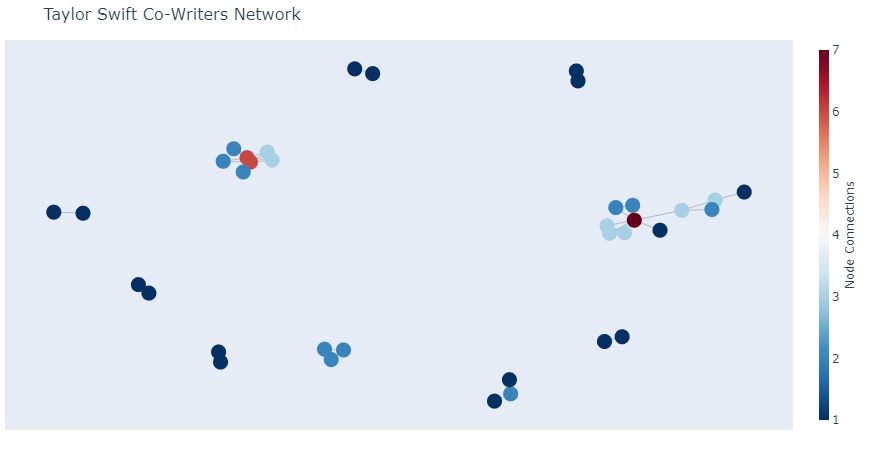

In [107]:
pos = nx.spring_layout(G_write)
for n, p in pos.items():
    G_write.nodes[n]['pos'] = p
    
edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5,color='#888'),
    hoverinfo='none',
    mode='lines')

for edge in G_write.edges():
    x0, y0 = G_write.nodes[edge[0]]['pos']
    x1, y1 = G_write.nodes[edge[1]]['pos']
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])
    
node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='RdBu',
        reversescale=True,
        color=[],
        size=15,
        colorbar=dict(
            thickness=10,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0)))

for node in G_write.nodes():
    x, y = G_write.nodes[node]['pos']
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])

for node, adjacencies in enumerate(G_write.adjacency()):
    node_trace['marker']['color']+=tuple([len(adjacencies[1])])
    node_info = adjacencies[0] +' # of connections: '+str(len(adjacencies[1]))
    node_trace['text']+=tuple([node_info])
    
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='Taylor Swift Co-Writers Network',
                titlefont=dict(size=16),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.show()

There are **two** main sub-graphs in the network, namely with `Jack Antonoff` as the center and the pair `Max Martin` and `Shellback` as another center. Since Jack has worked with other people from albums `post-Red`,it is expected to have such connections.The isolated pairs are the ones who worked on albums that are not `1989` nor `reputation`.

In [108]:
fig.write_html("taylor_network_write.html",include_plotlyjs="cdn")

## Exploring the `sound` dataset

To investigate the sonical shifts in her music through the years, we look into the audio features and the respective changes.

In [109]:
numeric_features = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']
numeric_features_ex = ['danceability','energy','loudness','speechiness','acousticness','liveness','valence','tempo']

Once again, we ensure that the `album names` are in release order.

In [110]:
ts_sound['album_name'] = pd.Categorical(ts_sound.album_name, categories=album_names_list[0:], ordered=True)
ts_sound = ts_sound.sort_values(by='album_name',ascending = True)
ts_sound.reset_index(inplace=True,drop=True)

In [111]:
pd.crosstab(ts_sound['key'],ts_sound['album_name'])

album_name,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
key,,,,,,,,,
a,1,0,0,2,0,4,3,1,3
a#,1,1,1,0,0,0,1,1,0
b,0,0,1,0,0,0,2,0,1
c,1,1,0,2,2,4,7,4,3
c#,0,2,1,1,0,0,1,1,1
d,3,3,2,2,1,4,1,1,1
d#,0,0,0,0,0,0,0,1,0
e,2,1,3,4,2,0,1,2,1
f,2,4,2,1,3,1,1,2,2


The keys in her discography are diverse yet she has used the `G` the most in `Red`, which is common among religious tracks. Apparenly, `State of Grace` is in `E` while `Begin Again` is in `G`. After-all, redemption and healing can be a religious experience. `C major`  is her most frequent key among her songs, and specifically in `Lover`. 

In [112]:
pd.crosstab(ts_sound['key'],ts_sound['mode'])

mode,major,minor
key,,
a,11,3
a#,5,0
b,1,3
c,22,2
c#,5,2
d,18,0
d#,1,0
e,14,2
f,18,0


In [113]:
ts_sound_all = pd.concat([ts_sound,ts_sound_fearless])
ts_sound_all.reset_index(inplace=True,drop=True)

In [114]:
ts_sound_all['album_name'] = pd.Categorical(ts_sound_all.album_name, categories=album_names_list_all[0:], ordered=True)
ts_sound_all = ts_sound_all.sort_values(by='album_name',ascending = True)
ts_sound_all.reset_index(inplace=True,drop=True)

In [115]:
ts_sound_all[ts_sound_all['album_name'] == "fearless (taylor's version)"]

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
142,jump then fall,fearless (taylor's version),0.572,0.690,-6.201,0.0358,0.047400,0.000000,0.0897,0.624,160.111,NaN,NaN
143,untouchable,fearless (taylor's version),0.393,0.531,-6.112,0.0329,0.018100,0.000000,0.1690,0.224,200.391,NaN,NaN
144,come in with the rain,fearless (taylor's version),0.476,0.564,-5.677,0.0269,0.040600,0.000000,0.1020,0.167,143.929,NaN,NaN
145,superstar,fearless (taylor's version),0.454,0.555,-6.690,0.0283,0.157000,0.000000,0.3430,0.171,171.862,NaN,NaN
146,the other side of the door,fearless (taylor's version),0.432,0.873,-4.367,0.0577,0.027900,0.000000,0.1670,0.629,163.936,NaN,NaN
147,we were happy (from the vault),fearless (taylor's version),0.609,0.373,-8.819,0.0263,0.849000,0.000000,0.0779,0.130,106.007,NaN,NaN
148,you all over me (from the vault),fearless (taylor's version),0.599,0.494,-7.610,0.0372,0.816000,0.000000,0.1010,0.440,142.893,NaN,NaN
149,mr. perfectly fine (from the vault),fearless (taylor's version),0.660,0.817,-6.269,0.0521,0.162000,0.000000,0.0667,0.714,135.942,NaN,NaN
150,that's when (from the vault),fearless (taylor's version),0.588,0.608,-7.062,0.0365,0.225000,0.000000,0.0920,0.508,90.201,NaN,NaN
151,today was a fairytale,fearless (taylor's version),0.482,0.779,-5.025,0.0409,0.013500,0.000000,0.2960,0.328,158.162,NaN,NaN


To create a scatter plot for the dataset, we used `Danceability`, `Valence`, and `Energy` as the main values and we grouped them by `album_name`. To animate it, we added the `animation_group` and `animation_frame` parameters. To add the customized colors, we put the `album_color_dictionary` as the value in our `color_discrete_map` parameter.

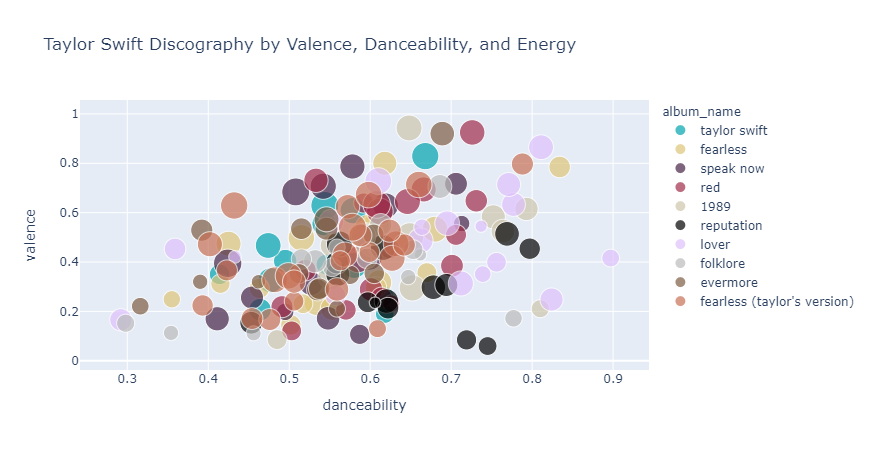

In [116]:
import plotly.express as px
fig = px.scatter(ts_sound_all, x="danceability", y="valence", color="album_name", size="energy",hover_data=['track_name'],color_discrete_map=album_color_dictionary_all,
             title="Taylor Swift Discography by Valence, Danceability, and Energy")
fig.show()

Once quick observation is that `Lover` has the most sonically diverse values among the albums while `reputation` tracks are clustered around **0.2** to **0.4** range.

In [117]:
fig.write_html("taylor_sound_scatterplot.html",include_plotlyjs="cdn")

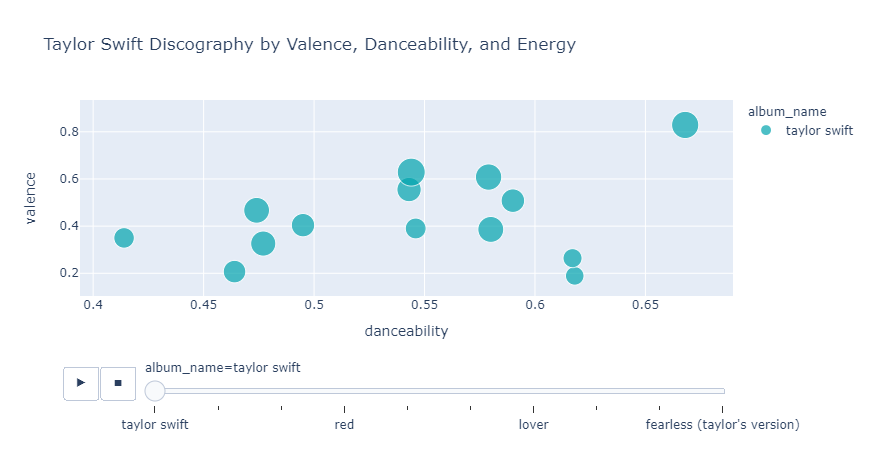

In [118]:
import plotly.express as px
fig = px.scatter(ts_sound_all, x="danceability", y="valence", color="album_name", size="energy",hover_data=['track_name'],color_discrete_map=album_color_dictionary_all,
             animation_group="track_name",animation_frame="album_name",title="Taylor Swift Discography by Valence, Danceability, and Energy")
fig.show()

From `Taylor Swift` to `1989`, the `valence` and `danceability` values have shifted to the right, which can be attributed to `Max Martin's` expertise in making a pop song.

In [119]:
fig.write_html("taylor_sound_scattermove.html",include_plotlyjs="cdn")

To get the tracks with the highest and lowest values for each numeric feature, functions with `groupby`are created.

In [120]:
def create_low_score(feature):
    ts_sound_lowest = ts_sound_all[['album_name','track_name',feature]].loc[ts_sound_all[['album_name','track_name',feature]].groupby('album_name')[feature].idxmin()].sort_index()
    ts_sound_lowest = ts_sound_lowest.rename(columns={"track_name": "track_name"+ "_"+feature, feature: "lowest_"+feature})
    ts_sound_lowest.reset_index(inplace=True,drop=True)
    return ts_sound_lowest[['album_name',"track_name"+"_"+feature]]

In [121]:
ts_discography_low = pd.DataFrame(columns=['album_name'])
for feature in numeric_features_ex:
    ts_discography_low = pd.merge(ts_discography_low,create_low_score(feature),on='album_name',how='outer')

In [122]:
ts_discography_low

,album_name,track_name_danceability,track_name_energy,track_name_loudness,track_name_speechiness,track_name_acousticness,track_name_liveness,track_name_valence,track_name_tempo
0,taylor swift,cold as you,invisible,teardrops on my guitar,teardrops on my guitar,the outside,invisible,invisible,invisible
1,fearless,white horse,white horse,the best day,superstar,change,jump then fall,breathe,jump then fall
2,speak now,long live,never grow up,last kiss,dear john,mine,the story of us,dear john,sparks fly
3,red,come back... be here,sad beautiful tragic,sad beautiful tragic,stay stay stay,state of grace,i knew you were trouble,the last time,begin again
4,1989,this love,clean,this love,welcome to new york,out of the woods,how you get the girl,this love,this love
5,reputation,end game,new year's day,new year's day,don't blame me,getaway car,king of my heart,delicate,i did something bad
6,lover,the archer,it's nice to have a friend,soon you'll get better,afterglow,i think he knows,you need to calm down,the archer,lover
7,folklore,exile,hoax,hoax,betty,this is me trying,mirrorball,my tears ricochet,exile
8,evermore,tolerate it,champagne problems,champagne problems,"no body, no crime","no body, no crime",tolerate it,happiness,tolerate it
9,fearless (taylor's version),untouchable,we were happy (from the vault),don't you (from the vault),we were happy (from the vault),change,mr. perfectly fine (from the vault),we were happy (from the vault),bye bye baby (from the vault)


In [123]:
ts_discography_low.columns = ['Album'] + numeric_features_ex

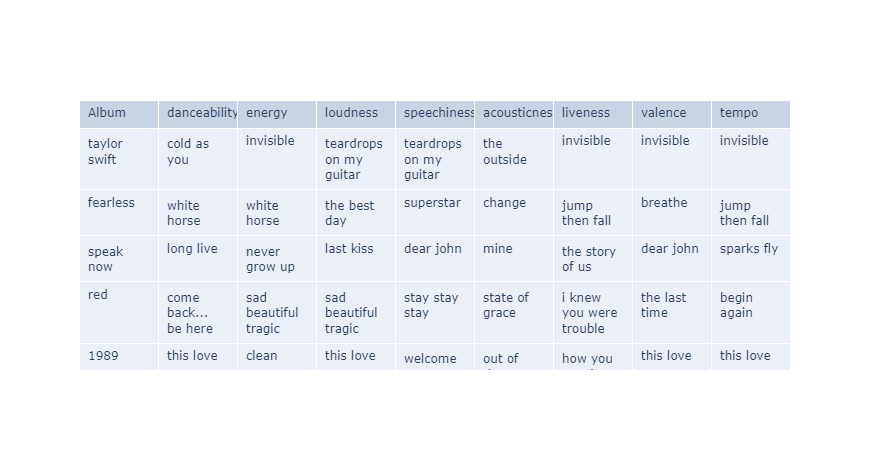

In [124]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(ts_discography_low.columns),
                align='left'),
    cells=dict(values=ts_discography_low.transpose().values.tolist(),
               align='left'))
])

fig.show()

In [125]:
fig.write_html("taylor_table_low_sound.html",include_plotlyjs="cdn")

For the tracks with lowest `valence` and `danceability`, **4** of them are their respective track fives. Furthermore, the producers for the first and ninth album have spread their softest, most unenergetic, and most negative-sounding sound among four tracks.

In [126]:
ts_discography_low.to_csv('ts_sound_lowest_features.csv',index=False)

In [127]:
def create_high_score(feature):
    ts_sound_highest = ts_sound_all[['album_name','track_name',feature]].loc[ts_sound_all[['album_name','track_name',feature]].groupby('album_name')[feature].idxmax()].sort_index()
    ts_sound_highest = ts_sound_highest.rename(columns={"track_name": "track_name"+ "_"+feature, feature: "highest_"+feature})
    ts_sound_highest.reset_index(inplace=True,drop=True)
    return ts_sound_highest[['album_name',"track_name"+"_"+feature]]

In [128]:
ts_discography_high = pd.DataFrame(columns=['album_name'])
for feature in numeric_features:
    ts_discography_high = pd.merge(ts_discography_high,create_high_score(feature),on='album_name',how='outer')

In [129]:
ts_discography_high

,album_name,track_name_danceability,track_name_energy,track_name_loudness,track_name_speechiness,track_name_acousticness,track_name_instrumentalness,track_name_liveness,track_name_valence,track_name_tempo
0,taylor swift,picture to burn,i'm only me when i'm with you,picture to burn,i'm only me when i'm with you,invisible,i'm only me when i'm with you,our song,picture to burn,our song
1,fearless,hey stephen,tell me why,tell me why,forever & always,the best day,you belong with me,tell me why,jump then fall,untouchable
2,speak now,never grow up,haunted,haunted,better than revenge,never grow up,the story of us,back to december,mean,long live
3,red,girl at home,red,red,we are never ever getting back together,sad beautiful tragic,sad beautiful tragic,everything has changed,stay stay stay,we are never ever getting back together
4,1989,clean,i wish you would,welcome to new york,bad blood,this love,wildest dreams,out of the woods,shake it off,bad blood
5,reputation,gorgeous,this is why we can't have nice things,this is why we can't have nice things,dancing with our hands tied,new year's day,delicate,this is why we can't have nice things,look what you made me do,getaway car
6,lover,i think he knows,me!,me!,i forgot that you existed,it's nice to have a friend,miss americana & the heartbreak prince,death by a thousand cuts,paper rings,soon you'll get better
7,folklore,the 1,mad woman,the 1,peace,hoax,the last great american dynasty,cardigan,the last great american dynasty,peace
8,evermore,closure,long story short,"no body, no crime",closure,evermore,long story short,willow,closure,champagne problems
9,fearless (taylor's version),hey stephen,tell me why,tell me why,tell me why,we were happy (from the vault),don't you (from the vault),superstar,hey stephen,untouchable


Most of the tracks until `Lover` are filled with singles. Furthermore, the highest respective values in `1989`, her most pop-sounding album and `Lover`, her post-catharsis album, are spread across **eight** tracks.

In [130]:
ts_discography_high.to_csv('ts_sound_highest_features.csv',index=False)

To get the respective means for each album, `groupby` is used again.

In [131]:
ts_sound_eda = ts_sound_all.groupby('album_name')[numeric_features].mean()
ts_sound_eda.reset_index(inplace=True)
ts_sound_eda['album_name'] = pd.Categorical(ts_sound_eda.album_name, categories=album_names_list_all[0:], ordered=True)
ts_sound_eda = ts_sound_eda.sort_values(by='album_name',ascending = True)
ts_sound_eda.reset_index(inplace=True,drop=True)
ts_sound_eda

,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,taylor swift,0.543500,0.660143,-4.673857,0.031857,0.197766,5.107143e-05,0.166879,0.436571,137.994214
1,fearless,0.560722,0.622000,-5.328278,0.031961,0.180001,2.292222e-06,0.160556,0.407611,123.938611
2,speak now,0.550786,0.663786,-4.524429,0.037907,0.200902,5.153929e-05,0.176157,0.436357,143.827571
3,red,0.613421,0.615579,-6.991000,0.042337,0.123847,2.168383e-03,0.123311,0.472158,118.363895
4,1989,0.650231,0.698769,-6.236462,0.066254,0.113175,9.060654e-04,0.154577,0.461908,118.552462
5,reputation,0.639800,0.586400,-7.655333,0.109440,0.140051,3.789333e-05,0.153500,0.298540,132.525733
6,lover,0.658222,0.545222,-8.013278,0.099117,0.333743,7.330572e-04,0.115233,0.481444,119.972722
7,folklore,0.567875,0.425063,-10.247063,0.040431,0.710812,2.109544e-04,0.112625,0.381250,116.148187
8,evermore,0.518867,0.491333,-9.822467,0.061100,0.795333,2.335814e-02,0.114933,0.420600,117.479067
9,fearless (taylor's version),0.551240,0.653760,-6.076080,0.038136,0.189864,6.388000e-07,0.163368,0.427960,131.736600


In [132]:
ts_sound_eda.to_csv('ts_mean_sound.csv',index=False)

In [133]:
ts_sound_eda = ts_sound_all.groupby('album_name')[numeric_features].var()
ts_sound_eda.reset_index(inplace=True)
ts_sound_eda['album_name'] = pd.Categorical(ts_sound_eda.album_name, categories=album_names_list_all[0:], ordered=True)
ts_sound_eda = ts_sound_eda.sort_values(by='album_name',ascending = True)
ts_sound_eda.reset_index(inplace=True,drop=True)
ts_sound_eda

,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,taylor swift,0.005070,0.026338,1.798486,0.000159,0.049850,3.651607e-08,0.007136,0.031519,780.858276
1,fearless,0.012525,0.024704,2.621585,0.000047,0.028186,4.557054e-11,0.008184,0.036002,1180.681172
2,speak now,0.008462,0.034437,4.212589,0.000265,0.062230,1.137874e-08,0.011699,0.057170,617.999466
3,red,0.005142,0.023374,2.600348,0.001276,0.028144,7.169779e-05,0.003957,0.048541,734.901076
4,1989,0.010311,0.021465,1.357333,0.002448,0.031113,3.643431e-06,0.006270,0.043672,931.561366
5,reputation,0.008660,0.026476,3.742740,0.002850,0.052945,9.726624e-09,0.008544,0.020109,977.501671
6,lover,0.027028,0.040604,5.118603,0.013416,0.126809,3.580177e-06,0.003399,0.033346,1636.386467
7,folklore,0.014638,0.023904,4.565820,0.000264,0.033202,3.251110e-07,0.001954,0.028221,596.965757
8,evermore,0.009113,0.020883,2.098475,0.003819,0.016985,3.673013e-03,0.000331,0.033671,909.234892
9,fearless (taylor's version),0.008717,0.021133,3.332771,0.000121,0.059004,6.231636e-12,0.008349,0.030982,1006.473992


To measure the cohesiveness of an album, we use [variance](https://mathworld.wolfram.com/Variance.html) as a metric for each audio feature and rank each album according to the value. The idea is that an album has cohesion if the spread of audio features from each track are close to each other. Finally, we rank each album according to each feature and calculate its variance among all audio features. The album should be coherent in terms on how close the spread of the tracks for each audio feature and how close the spread the rank of these audio features. The closer to zero, the better.


In [134]:
ts_sound_eda.to_csv('ts_var_sound.csv',index=False)

In [135]:
ts_sound_eda_album = ts_sound_eda.set_index('album_name')
ts_sound_eda_album[numeric_features].idxmin()

danceability                       taylor swift
energy                                 evermore
loudness                                   1989
speechiness                            fearless
acousticness                           evermore
instrumentalness    fearless (taylor's version)
liveness                               evermore
valence                              reputation
tempo                                  folklore
dtype: object

In [136]:
ts_sound_eda[numeric_features] = ts_sound_eda[numeric_features].rank()
ts_sound_eda.reset_index(inplace=True,drop=True)
ts_sound_eda

,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,taylor swift,1.0,7.0,2.0,3.0,6.0,5.0,6.0,4.0,4.0
1,fearless,8.0,6.0,5.0,1.0,3.0,2.0,7.0,7.0,9.0
2,speak now,3.0,9.0,8.0,5.0,9.0,4.0,10.0,10.0,2.0
3,red,2.0,4.0,4.0,6.0,2.0,9.0,4.0,9.0,3.0
4,1989,7.0,3.0,1.0,7.0,4.0,8.0,5.0,8.0,6.0
5,reputation,4.0,8.0,7.0,8.0,7.0,3.0,9.0,1.0,7.0
6,lover,10.0,10.0,10.0,10.0,10.0,7.0,3.0,5.0,10.0
7,folklore,9.0,5.0,9.0,4.0,5.0,6.0,2.0,2.0,1.0
8,evermore,6.0,1.0,3.0,9.0,1.0,10.0,1.0,6.0,5.0
9,fearless (taylor's version),5.0,2.0,6.0,2.0,8.0,1.0,8.0,3.0,8.0


In [137]:
ts_sound_eda['rank_var'] = ts_sound_eda.iloc[:,1:].var(axis=1)
ts_sound_eda.reset_index(inplace=True,drop=True)
ts_sound_eda['final_rank'] = ts_sound_eda['rank_var'].rank()
ts_sound_eda

,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,rank_var,final_rank
0,taylor swift,1.0,7.0,2.0,3.0,6.0,5.0,6.0,4.0,4.0,3.944444,1.0
1,fearless,8.0,6.0,5.0,1.0,3.0,2.0,7.0,7.0,9.0,7.750000,6.0
2,speak now,3.0,9.0,8.0,5.0,9.0,4.0,10.0,10.0,2.0,10.000000,9.0
3,red,2.0,4.0,4.0,6.0,2.0,9.0,4.0,9.0,3.0,7.194444,3.0
4,1989,7.0,3.0,1.0,7.0,4.0,8.0,5.0,8.0,6.0,5.777778,2.0
5,reputation,4.0,8.0,7.0,8.0,7.0,3.0,9.0,1.0,7.0,7.250000,4.0
6,lover,10.0,10.0,10.0,10.0,10.0,7.0,3.0,5.0,10.0,7.250000,5.0
7,folklore,9.0,5.0,9.0,4.0,5.0,6.0,2.0,2.0,1.0,8.444444,8.0
8,evermore,6.0,1.0,3.0,9.0,1.0,10.0,1.0,6.0,5.0,11.750000,10.0
9,fearless (taylor's version),5.0,2.0,6.0,2.0,8.0,1.0,8.0,3.0,8.0,8.194444,7.0


From the table above, `Lover` has six features ranked as the least cohesive. For the other three features, their respective "chaos" have mixed well with others, hence, the album ranked fourth, just behind `1989` and `Red`. The biggest surprise is that even `evermore` has three features ranked as most cohesive and with Aaron Dessner producing all but one track, which is `gold rush` by Jack Antonoff. With that track, the other features, particularly `Speechiness` and `Instrumentalness` widen the spread among them. Thus, the aforementioned album ranked last in terms of cohesiveness.

In [138]:
ts_sound_eda.to_csv('ts_cohesion_rank.csv',index=False)

For the next set of figures, we looked how her features have interacted across album. With that, we used [correlation](https://mathworld.wolfram.com/Correlation.html) matrix to describe how features are associated. The closer the absolute value to 1, the better association. For example, a score of **0.77** between `Valence` and `Energy` signify a track that sounds more positive is most likely an energetic one. One observation from the description of features is that while `Energy` and `Loudness` are positively associated with each other, both are negatively associated with `Acousticness`.

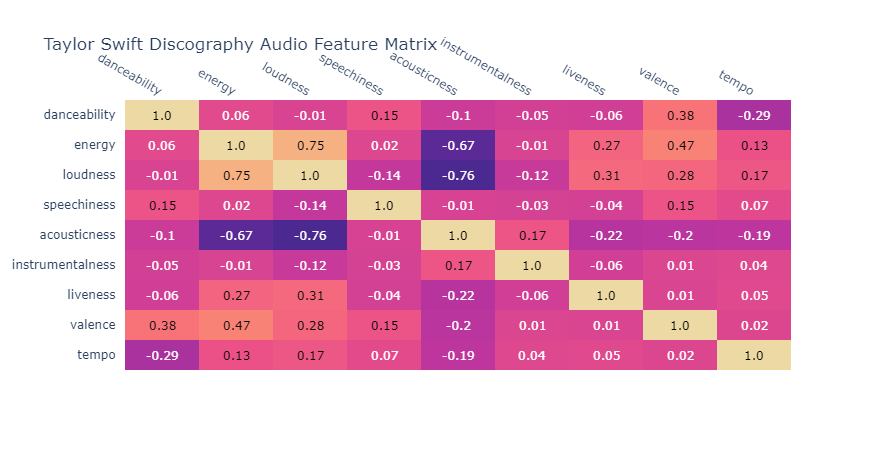

In [139]:
import plotly.figure_factory as ff
corr = ts_sound_all[numeric_features].corr()
corr_values = np.flipud(corr.to_numpy())
corr_values_text = np.around(corr_values, decimals=2)
x = numeric_features
y = numeric_features[::-1]
fig = ff.create_annotated_heatmap(corr_values, x=x, y=y, annotation_text=corr_values_text,colorscale='Agsunset')
fig.update_layout(title_text='Taylor Swift Discography Audio Feature Matrix')
fig.show()

In [140]:
fig.write_html("taylor_sound_heatmap.html",include_plotlyjs="cdn")

The function below graphed the matrices with their respective albums.

In [141]:
def graph_heatmap_album(album_name):
    corr = ts_sound_all[ts_sound_all['album_name']==album_name][numeric_features].corr()
    corr_values = np.flipud(corr.to_numpy())
    corr_values_text = np.around(corr_values, decimals=2)
    x = numeric_features
    y = numeric_features[::-1]
    fig = ff.create_annotated_heatmap(corr_values, x=x, y=y, annotation_text=corr_values_text,colorscale=album_color_scale_all[album_name])
    fig.update_layout(title_text=album_name.title() + ' Audio Feature Matrix')
    return fig

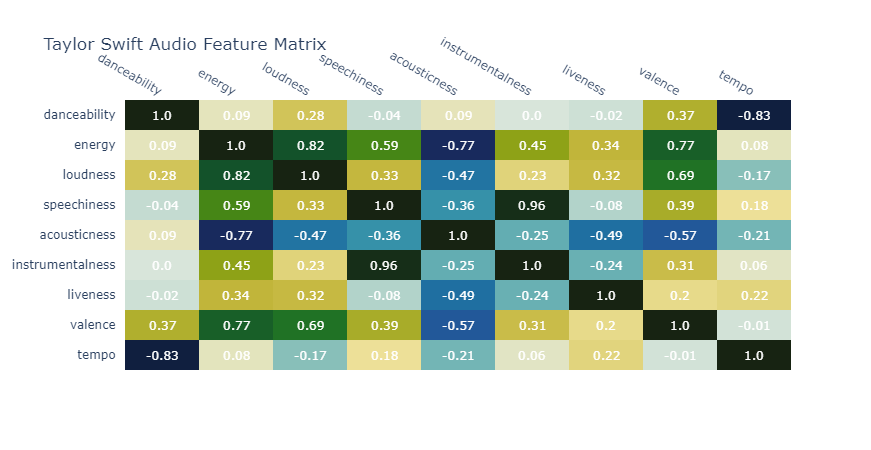

In [142]:
fig = graph_heatmap_album('taylor swift')
fig

In [143]:
fig.write_html("ts_sound_heatmap_taylorswift.html",include_plotlyjs="cdn")

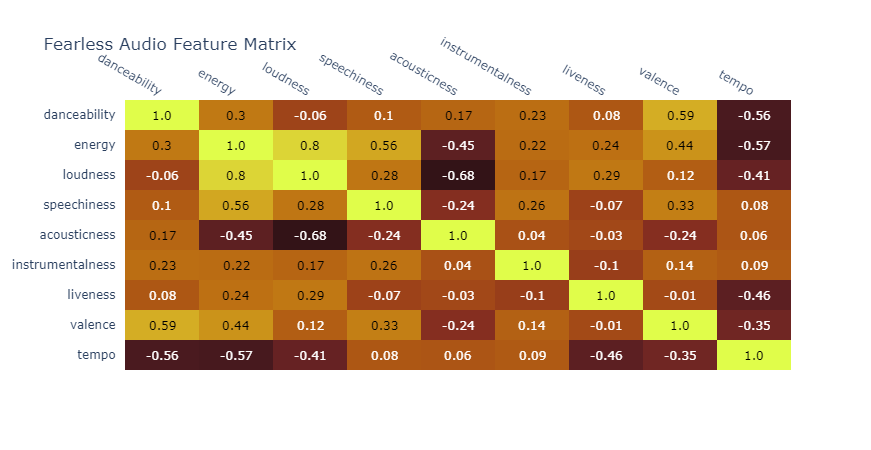

In [144]:
fig = graph_heatmap_album('fearless')
fig

In [145]:
fig.write_html("ts_sound_heatmap_fearless.html",include_plotlyjs="cdn")

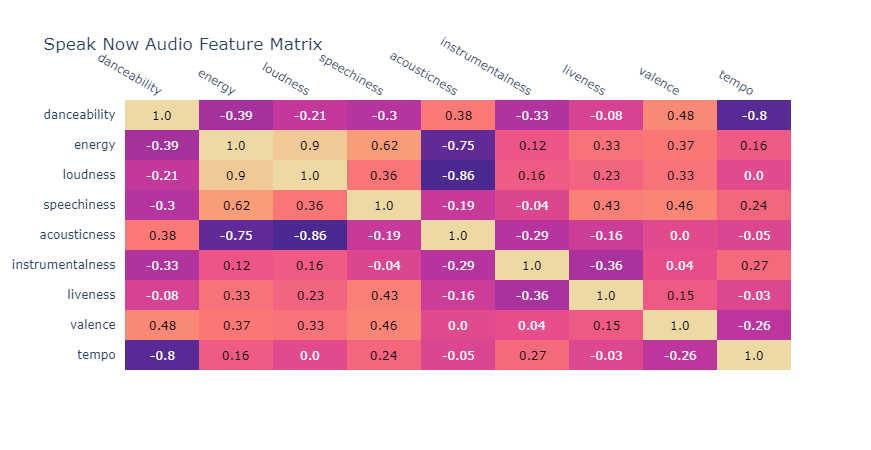

In [146]:
fig = graph_heatmap_album('speak now')
fig

In [147]:
fig.write_html("ts_sound_heatmap_speaknow.html",include_plotlyjs="cdn")

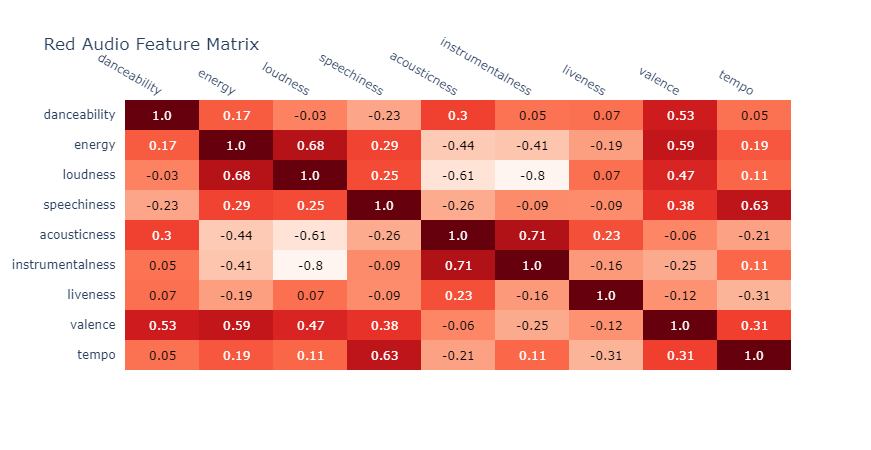

In [148]:
fig = graph_heatmap_album('red')
fig

In [149]:
fig.write_html("ts_sound_heatmap_red.html",include_plotlyjs="cdn")

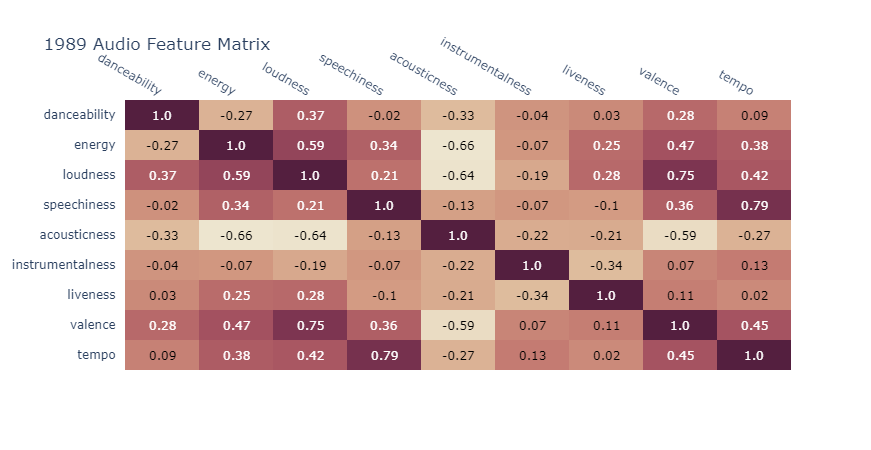

In [150]:
fig = graph_heatmap_album('1989')
fig

In [151]:
fig.write_html("ts_sound_heatmap_1989.html",include_plotlyjs="cdn")

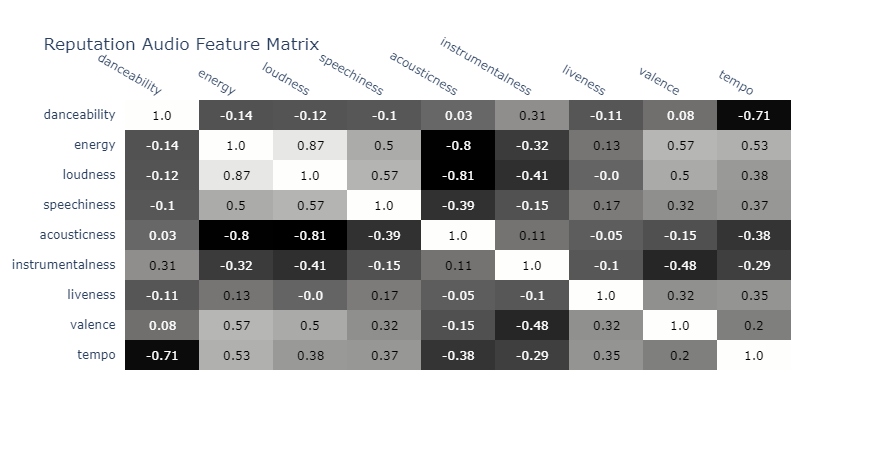

In [152]:
fig = graph_heatmap_album('reputation')
fig

In [153]:
fig.write_html("ts_sound_heatmap_reputation.html",include_plotlyjs="cdn")

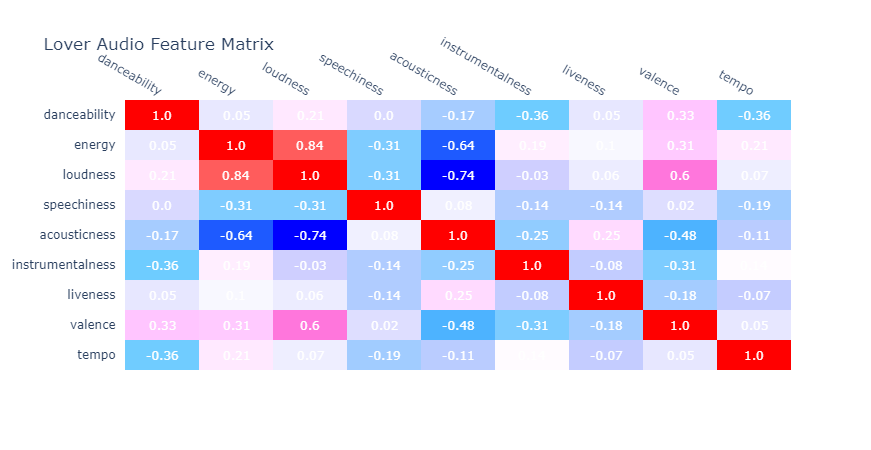

In [154]:
fig = graph_heatmap_album('lover')
fig

In [155]:
fig.write_html("ts_sound_heatmap_lover.html",include_plotlyjs="cdn")

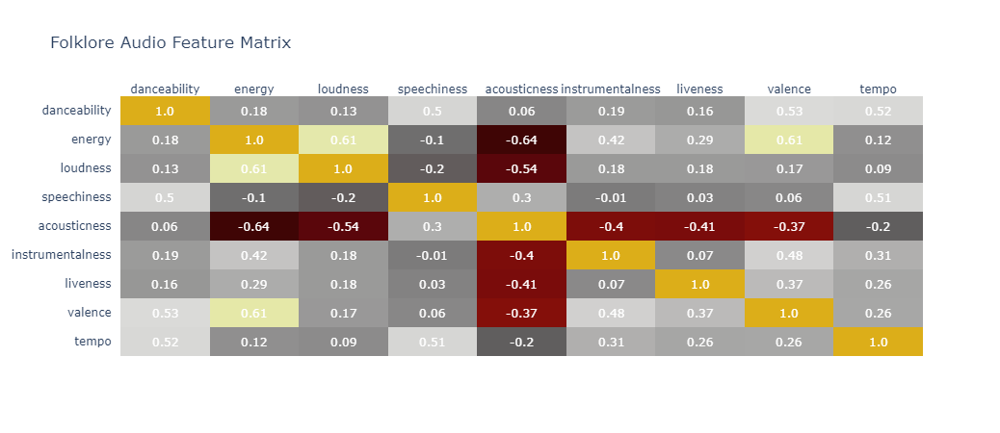

In [156]:
fig = graph_heatmap_album('folklore')
fig

In [157]:
fig.write_html("ts_sound_heatmap_folklore.html",include_plotlyjs="cdn")

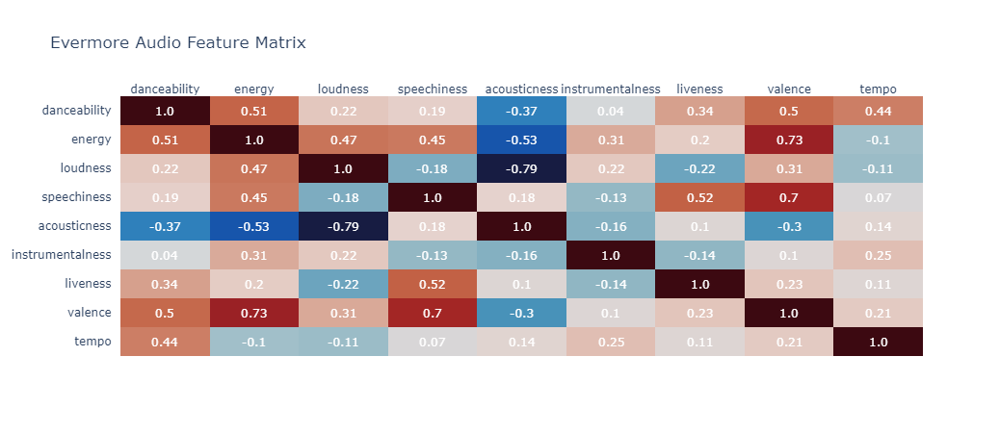

In [158]:
fig = graph_heatmap_album('evermore')
fig

In [159]:
fig.write_html("ts_sound_heatmap_evermore.html",include_plotlyjs="cdn")

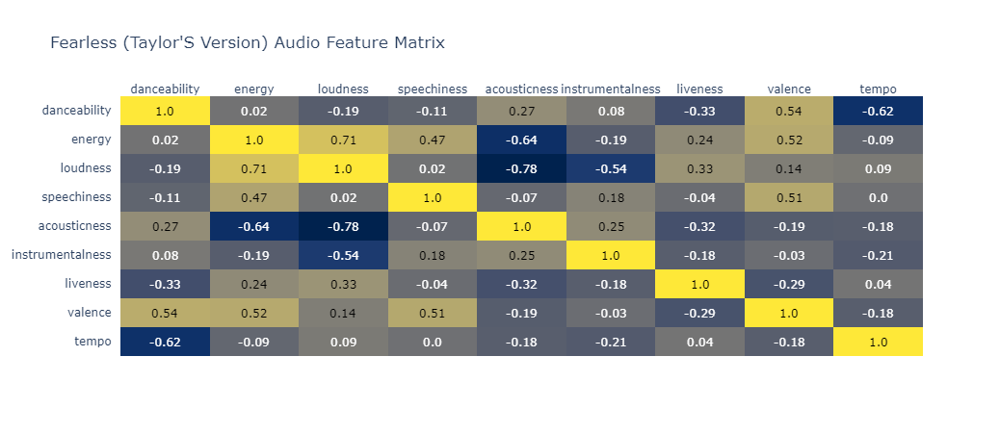

In [465]:
fig = graph_heatmap_album("fearless (taylor's version)")
fig

In [161]:
fig.write_html("ts_sound_heatmap_fearlessts.html",include_plotlyjs="cdn")

To graph the violin plot for each numeric feature, we used the `violin` plot.

In [162]:
def violin_graph_sound(feature):
    fig = px.violin(ts_sound_all, y=feature, color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=ts_sound_all.columns
                ,title="Taylor Swift Discography by " + feature.title())
    fig.write_html("ts_sound_violin_" + feature + ".html",include_plotlyjs="cdn")
    return fig

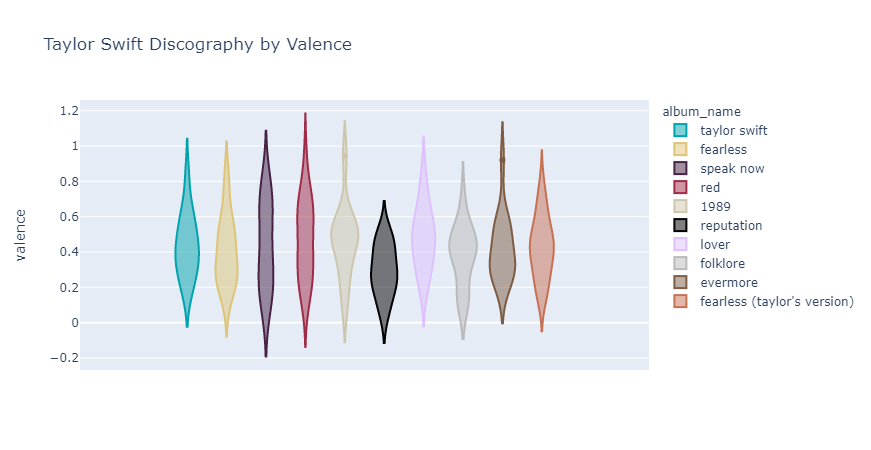

In [163]:
fig = violin_graph_sound('valence')
fig

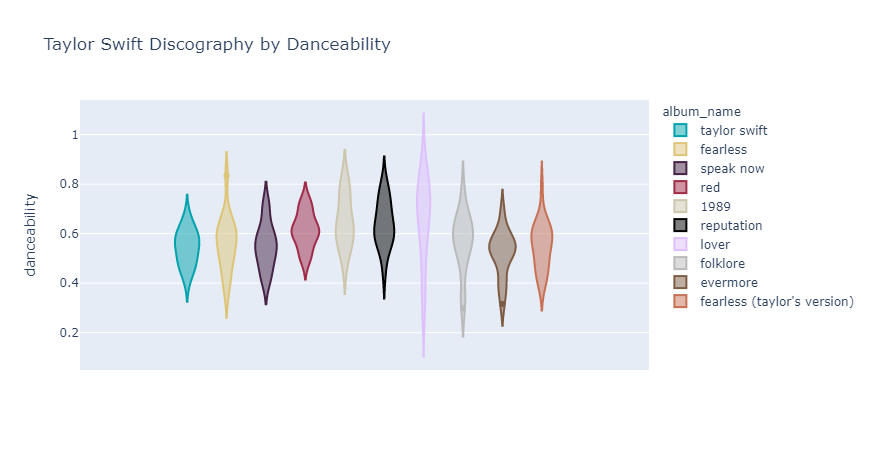

In [164]:
fig = violin_graph_sound('danceability')
fig

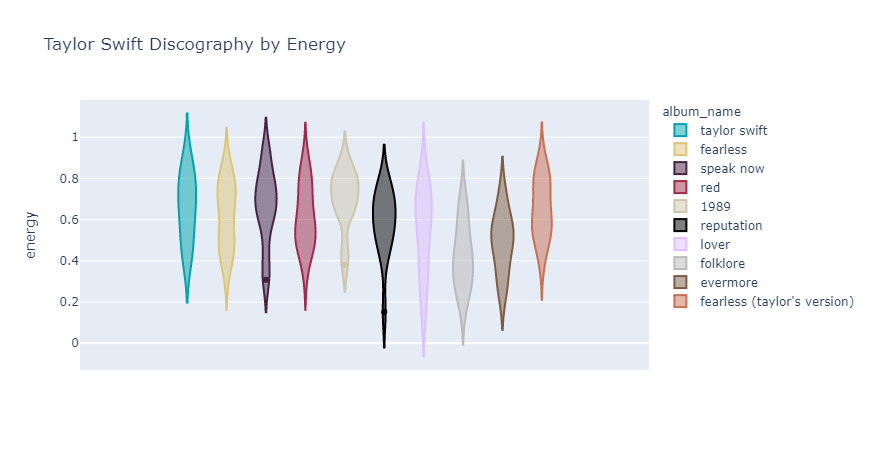

In [165]:
fig = violin_graph_sound('energy')
fig

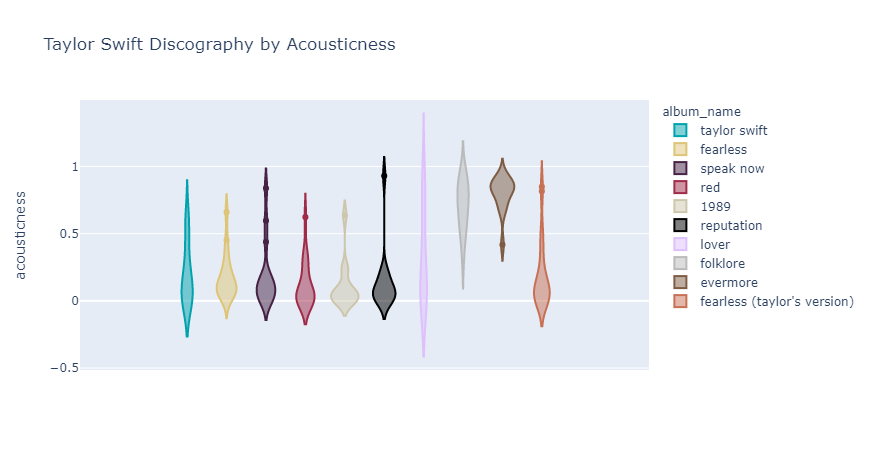

In [166]:
fig = violin_graph_sound('acousticness')
fig

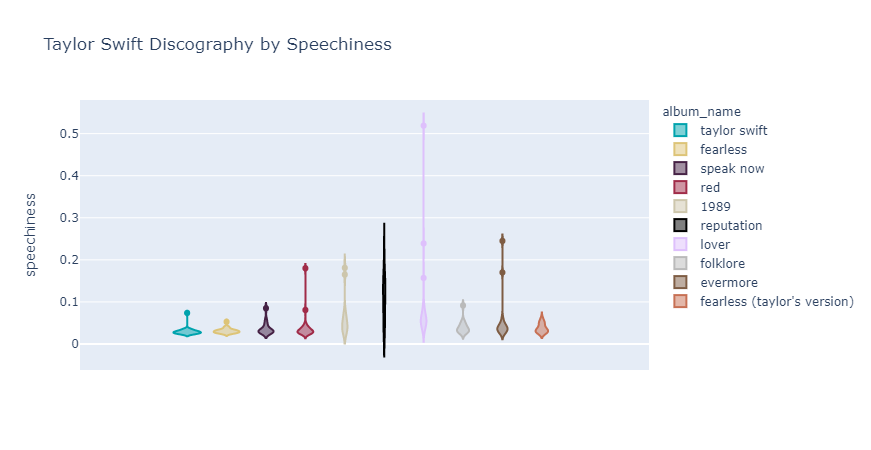

In [167]:
fig = violin_graph_sound('speechiness')
fig

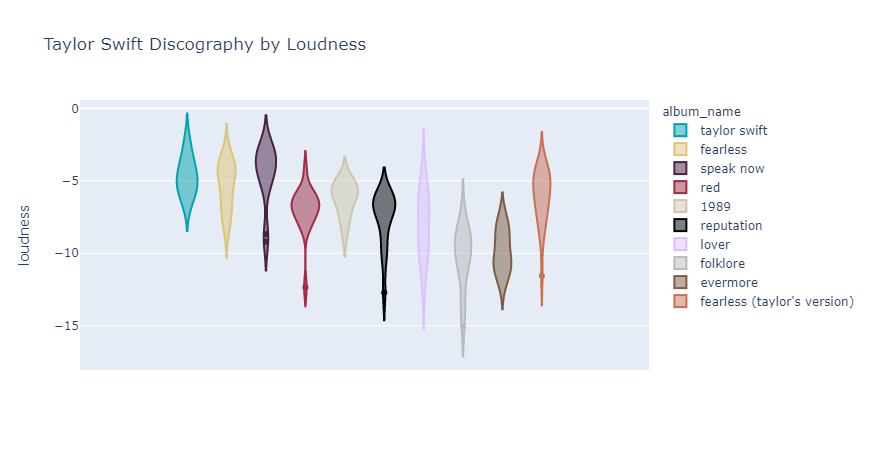

In [168]:
fig = violin_graph_sound('loudness')
fig

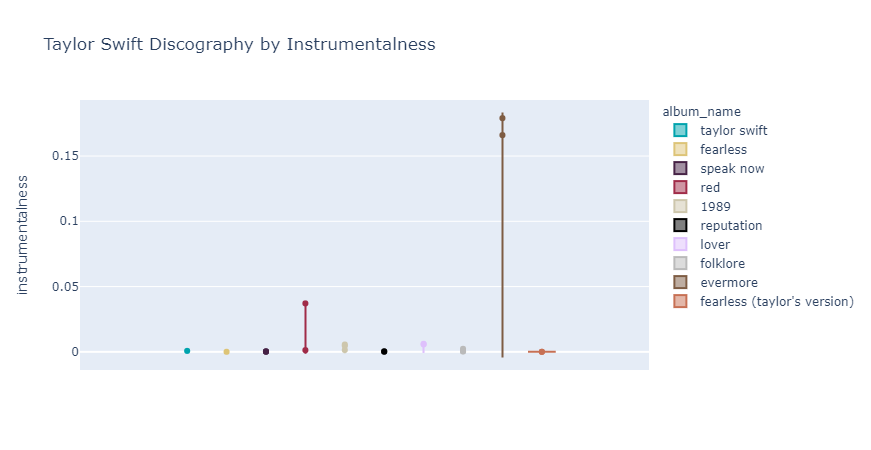

In [169]:
fig = violin_graph_sound('instrumentalness')
fig

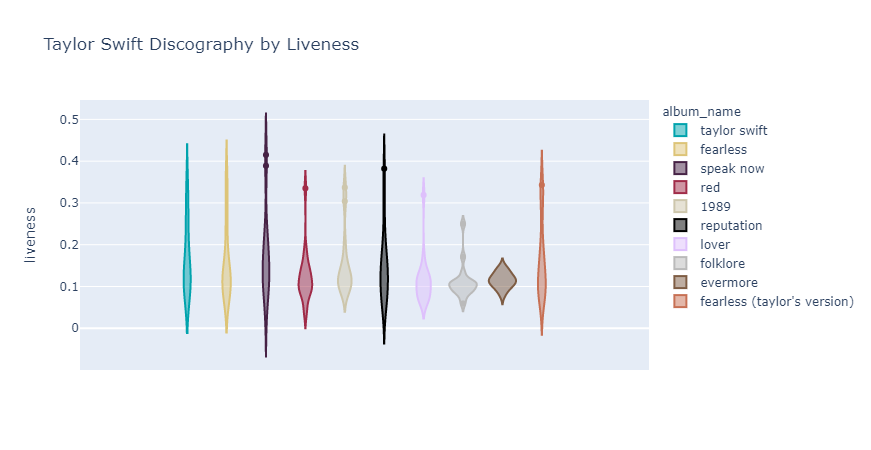

In [170]:
fig = violin_graph_sound('liveness')
fig

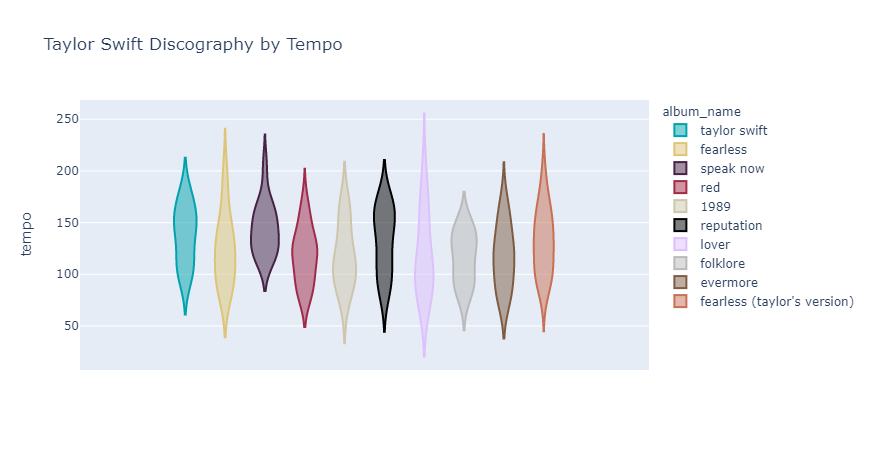

In [171]:
fig = violin_graph_sound('tempo')
fig

In [172]:
ts_sound_all.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
0,a perfectly good heart,taylor swift,0.477,0.735,-5.686,0.0346,0.00502,0.000000,0.1280,0.326,156.035,e,major
1,our song,taylor swift,0.543,0.686,-4.751,0.0357,0.11400,0.000000,0.3350,0.555,177.874,d,major
2,a place in this world,taylor swift,0.580,0.781,-2.788,0.0305,0.06250,0.000000,0.3170,0.386,115.012,a,major
3,i'm only me when i'm with you,taylor swift,0.544,0.912,-3.612,0.0738,0.00543,0.000715,0.0976,0.629,143.983,g#,major
4,invisible,taylor swift,0.618,0.400,-5.485,0.0253,0.62700,0.000000,0.0943,0.189,96.052,g,major


To check how sonically close are her sound, we will [standardize](https://reference.wolfram.com/language/ref/Standardize.html) the numeric features first.

In [173]:
def create_song_track(song,album):
    return str(song) + " - " + str(album)

In [174]:
from sklearn.preprocessing import StandardScaler
ts_sound_standard = ts_sound_all.copy()
ts_sound_standard.reset_index(inplace=True,drop=True)
ts_sound_standard[numeric_features] = StandardScaler().fit_transform(ts_sound_standard[numeric_features])
ts_sound_standard.reset_index(inplace=True,drop=True)
ts_sound_standard['song_album'] = ts_sound_standard.apply(lambda x: create_song_track(x['track_name'], x['album_name']), axis=1)
ts_sound_standard['features_list'] = ts_sound_standard[numeric_features].values.tolist()
ts_sound_standard.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode,song_album,features_list
0,a perfectly good heart,taylor swift,-0.957911,0.788059,0.502999,-0.368878,-0.912933,-0.133253,-0.202247,-0.514325,0.963694,e,major,a perfectly good heart - taylor swift,"[-0.9579107784139138, 0.788059129081446, 0.502..."
1,our song,taylor swift,-0.369945,0.509004,0.874724,-0.348842,-0.566534,-0.133253,2.430287,0.689142,1.662444,d,major,our song - taylor swift,"[-0.36994549469847393, 0.5090038755753027, 0.8..."
2,a place in this world,taylor swift,-0.040329,1.050029,1.655148,-0.443559,-0.730230,-0.133253,2.201371,-0.199007,-0.348858,a,major,a place in this world - taylor swift,"[-0.040328593221637433, 1.0500293670668057, 1...."
3,i'm only me when i'm with you,taylor swift,-0.361037,1.796075,1.327553,0.345144,-0.911630,-0.095547,-0.588861,1.078035,0.578084,g#,major,i'm only me when i'm with you - taylor swift,"[-0.36103692979369456, 1.7960750448077203, 1.3..."
4,invisible,taylor swift,0.298197,-1.119768,0.582910,-0.538276,1.064064,-0.133253,-0.630829,-1.234304,-0.955493,g,major,invisible - taylor swift,"[0.29819687315997945, -1.1197676040728013, 0.5..."


In [175]:
ts_sound_all.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
0,a perfectly good heart,taylor swift,0.477,0.735,-5.686,0.0346,0.00502,0.000000,0.1280,0.326,156.035,e,major
1,our song,taylor swift,0.543,0.686,-4.751,0.0357,0.11400,0.000000,0.3350,0.555,177.874,d,major
2,a place in this world,taylor swift,0.580,0.781,-2.788,0.0305,0.06250,0.000000,0.3170,0.386,115.012,a,major
3,i'm only me when i'm with you,taylor swift,0.544,0.912,-3.612,0.0738,0.00543,0.000715,0.0976,0.629,143.983,g#,major
4,invisible,taylor swift,0.618,0.400,-5.485,0.0253,0.62700,0.000000,0.0943,0.189,96.052,g,major


%%latex
Since we want to measure how close or far two lists are, we used the cosine similarity where the scores ranged from **-1** to **1**, $\overrightarrow{A}, \overrightarrow{B}$ are vectors.

$$\cos(\theta) = \frac{\overrightarrow{A} \cdot \overrightarrow{B}}{\lVert \overrightarrow{A} \rVert \lVert \overrightarrow{B} \rVert}$$

In [176]:
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial.distance import cosine
sound_feature_array = ts_sound_standard['features_list'].values.tolist()
ts_songs_all = ts_sound_standard['song_album'].values.tolist()
cos_sim = 1 - pairwise_distances(sound_feature_array, metric = "cosine")
cos_sim = pd.DataFrame(cos_sim, index=ts_songs_all, columns=ts_songs_all)
cos_sim

,a perfectly good heart - taylor swift,our song - taylor swift,a place in this world - taylor swift,i'm only me when i'm with you - taylor swift,invisible - taylor swift,mary's song (oh my my my) - taylor swift,the outside - taylor swift,cold as you - taylor swift,should've said no - taylor swift,stay beautiful - taylor swift,...,tell me why - fearless (taylor's version),breathe - fearless (taylor's version),you belong with me - fearless (taylor's version),white horse - fearless (taylor's version),hey stephen - fearless (taylor's version),love story - fearless (taylor's version),fifteen - fearless (taylor's version),don't you (from the vault) - fearless (taylor's version),the best day - fearless (taylor's version),bye bye baby (from the vault) - fearless (taylor's version)
a perfectly good heart - taylor swift,1.000000,0.397869,0.300914,0.579707,-0.365778,0.856422,0.290461,0.671043,0.732794,0.506638,...,0.178023,0.665052,0.494923,0.533079,-0.370533,0.437207,0.104742,-0.544393,-0.614702,-0.589202
our song - taylor swift,0.397869,1.000000,0.709851,0.313019,-0.566895,0.721580,0.631623,0.288136,0.886729,0.412482,...,0.639170,0.787671,0.057013,0.492034,-0.072236,-0.068828,0.524946,-0.623634,-0.097877,-0.669773
a place in this world - taylor swift,0.300914,0.709851,1.000000,0.333800,-0.205412,0.568852,0.852019,-0.103482,0.739944,0.500545,...,0.919590,0.659789,0.269391,-0.062325,-0.081374,0.324317,0.899454,-0.695186,-0.276610,-0.250409
i'm only me when i'm with you - taylor swift,0.579707,0.313019,0.333800,1.000000,-0.582265,0.463753,0.628026,0.109019,0.580442,0.703035,...,0.458587,0.094179,0.817227,-0.035002,0.272528,0.724450,-0.059318,-0.712654,-0.546920,-0.075171
invisible - taylor swift,-0.365778,-0.566895,-0.205412,-0.582265,1.000000,-0.387226,-0.469813,-0.001672,-0.533497,-0.232642,...,-0.429748,-0.250569,-0.249459,-0.226753,-0.167770,-0.016148,0.035474,0.290257,0.164388,0.227878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
love story - fearless (taylor's version),0.437207,-0.068828,0.324317,0.724450,-0.016148,0.240296,0.496388,-0.096799,0.257837,0.722281,...,0.308305,-0.060742,0.952348,-0.423602,0.338606,1.000000,0.052986,-0.597868,-0.373053,0.183113
fifteen - fearless (taylor's version),0.104742,0.524946,0.899454,-0.059318,0.035474,0.406783,0.642666,-0.171496,0.498365,0.213595,...,0.788754,0.634385,-0.063216,-0.100099,-0.254805,0.052986,1.000000,-0.366256,-0.157014,-0.129087
don't you (from the vault) - fearless (taylor's version),-0.544393,-0.623634,-0.695186,-0.712654,0.290257,-0.658980,-0.669542,-0.214316,-0.776033,-0.759741,...,-0.585952,-0.465290,-0.640800,-0.089399,-0.131409,-0.597868,-0.366256,1.000000,0.570119,0.480000
the best day - fearless (taylor's version),-0.614702,-0.097877,-0.276610,-0.546920,0.164388,-0.528647,-0.244857,-0.343237,-0.428570,-0.362030,...,-0.241182,-0.273579,-0.360065,-0.134835,0.282399,-0.373053,-0.157014,0.570119,1.000000,0.269598


In [177]:
cos_sim.to_numpy().min()

-0.9459209726863036

In [178]:
def graph_cosine_connect(threshold):
    cos_sim_final = cos_sim.stack().reset_index()
    cos_sim_final.columns = ['source','sink','value']
    cos_sim_final = cos_sim_final[(cos_sim_final['value'] != 1) & (cos_sim_final['value'] <= threshold) & (cos_sim_final['value'] >= 0)]
    cos_sim_final.reset_index(inplace=True,drop=True)
    number_of_connections = cos_sim_final.shape[0]/2
    number_of_songs = len(set(cos_sim_final['source'].unique()) | set(cos_sim_final['sink'].unique()))
    print("Number of connected songs: " + str(number_of_songs))
    print("Number of connections: " + str(number_of_connections))
    G_connect = nx.from_pandas_edgelist(cos_sim_final,'source','sink', edge_attr='value')
    
    pos = nx.spring_layout(G_connect)
    for n, p in pos.items():
        G_connect.nodes[n]['pos'] = p
    
    edge_trace = go.Scatter(
        x=[],
        y=[],
        line=dict(width=0.5,color='#888'),
        hoverinfo='none',
        mode='lines')

    for edge in G_connect.edges():
        x0, y0 = G_connect.nodes[edge[0]]['pos']
        x1, y1 = G_connect.nodes[edge[1]]['pos']
        edge_trace['x'] += tuple([x0, x1, None])
        edge_trace['y'] += tuple([y0, y1, None])
        
    node_trace = go.Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='RdBu',
            reversescale=True,
            color=[],
            size=15,
            colorbar=dict(
                thickness=10,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(width=0)))

    for node in G_connect.nodes():
        x, y = G_connect.nodes[node]['pos']
        node_trace['x'] += tuple([x])
        node_trace['y'] += tuple([y])

    for node, adjacencies in enumerate(G_connect.adjacency()):
        node_trace['marker']['color']+=tuple([len(adjacencies[1])])
        node_info = adjacencies[0] +' # of connections: '+str(len(adjacencies[1]))
        node_trace['text']+=tuple([node_info])
    
    fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Taylor Swift Songs Sound Network with Threshold at ' + str(threshold),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
    
    return fig

Number of connected songs: 167
Number of connections: 1100.0


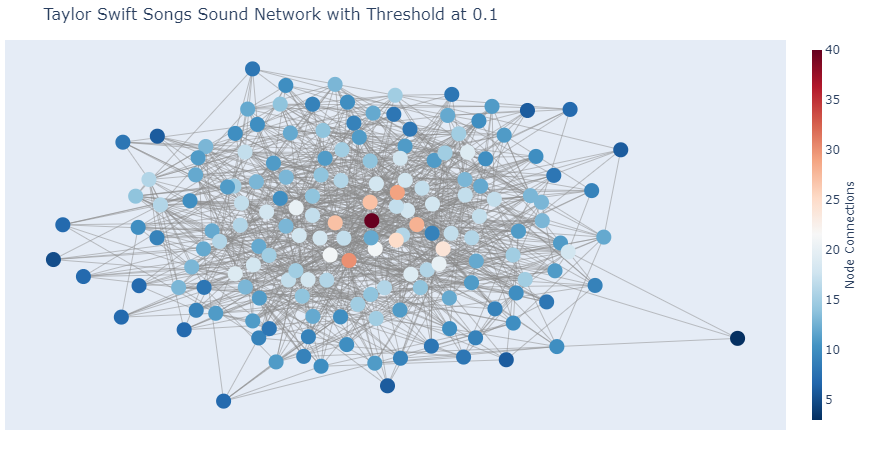

In [179]:
fig = graph_cosine_connect(0.10)
fig

In [180]:
fig.write_html("ts_sonic_network_10.html",include_plotlyjs="cdn")

Number of connected songs: 167
Number of connections: 550.0


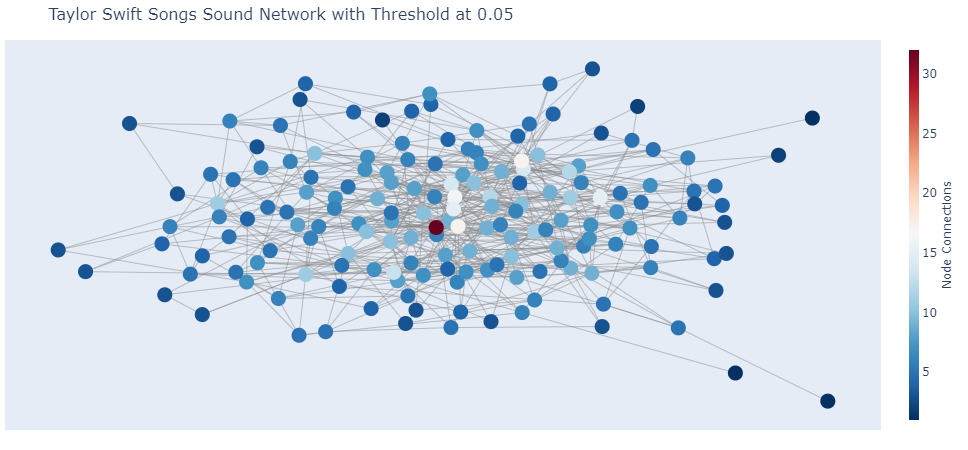

In [181]:
fig = graph_cosine_connect(0.05)
fig

In [182]:
fig.write_html("ts_sonic_network_05.html",include_plotlyjs="cdn")

Number of connected songs: 122
Number of connections: 115.0


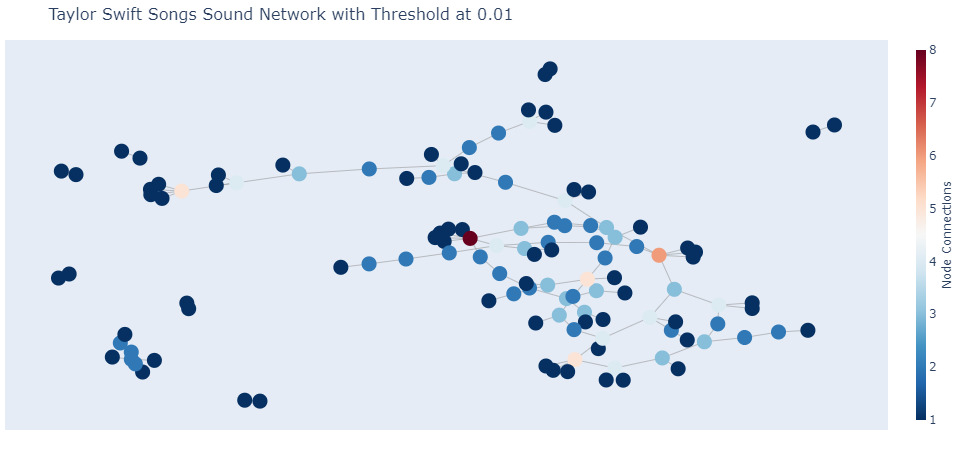

In [183]:
fig = graph_cosine_connect(0.01)
fig

In [184]:
fig.write_html("ts_sonic_network_01.html",include_plotlyjs="cdn")

In [185]:
cos_sim_final = cos_sim.stack().reset_index()
cos_sim_final.columns = ['source','sink','value']
cos_sim_final = cos_sim_final[(cos_sim_final['value'] != 1) & (cos_sim_final['value'] <= 0.01) & (cos_sim_final['value'] >= 0)]
cos_sim_final.reset_index(inplace=True,drop=True)

In [186]:
cos_sim_final.head()

,source,sink,value
0,a perfectly good heart - taylor swift,call it what you want - reputation,0.007557
1,a place in this world - taylor swift,how you get the girl - 1989,0.005707
2,i'm only me when i'm with you - taylor swift,back to december - speak now,0.008989
3,the outside - taylor swift,long live - speak now,0.005071
4,the outside - taylor swift,bad blood - 1989,0.007750


In [187]:
cos_sim_final = cos_sim_final[pd.DataFrame(np.sort(cos_sim_final[['source','sink']].values,1)).duplicated()]
cos_sim_final.reset_index(inplace=True,drop=True)
cos_sim_final.shape

(115, 3)

In [188]:
cos_sim_final.to_csv('ts_closest_sonic_link.csv',index=False)

## Exploring the `lyrics` dataset

In [189]:
ts_lyrics.head()

,track_number,line,lyric,track_name,album_name,chorus
0,1,1,he said the way my blue eyes shined,tim mcgraw,taylor swift,No
1,1,2,put those georgia stars to shame that night,tim mcgraw,taylor swift,No
2,1,3,"i said, ""that's a lie"" just a boy in a chevy t...",tim mcgraw,taylor swift,No
3,1,4,that had a tendency of getting stuck,tim mcgraw,taylor swift,No
4,1,5,on backroads at night,tim mcgraw,taylor swift,No


In [190]:
ts_lyrics_fearless.head()

,track_number,line,lyric,track_name,album_name,chorus
0,1,1,there's something 'bout the way,fearless,fearless (taylor's version),No
1,1,2,the street looks when it's just rained,fearless,fearless (taylor's version),No
2,1,3,"there's a glow off the pavement, you walk me t...",fearless,fearless (taylor's version),No
3,1,4,and you know i wanna ask you to dance right there,fearless,fearless (taylor's version),No
4,1,5,"in the middle of the parking lot, yeah",fearless,fearless (taylor's version),No


In [191]:
ts_lyrics_fearless['track_name'].unique()

array(['fearless', 'fifteen', 'love story', 'hey stephen', 'white horse',
       'you belong with me', 'breathe', 'tell me why', "you're not sorry",
       'the way i loved you', 'forever & always', 'the best day',
       'change', 'jump then fall', 'untouchable', 'come in with the rain',
       'superstar', 'the other side of the door', 'today was a fairytale',
       'you all over me (from the vault)',
       'mr. perfectly fine (from the vault)',
       'we were happy (from the vault)', "that's when (from the vault)",
       "don't you (from the vault)", 'bye bye baby (from the vault)'],
      dtype=object)

In [192]:
ts_lyrics_all = pd.concat([ts_lyrics,ts_lyrics_fearless[ts_lyrics_fearless['track_number'] > 13]])
ts_lyrics_all.reset_index(inplace=True,drop=True)

In [193]:
ts_lyrics['track_name'].nunique()

137

In [194]:
ts_lyrics_all['track_name'].nunique()

149

For the lyrics containing choruses, we filter those.

In [195]:
ts_lyrics_chorus = ts_lyrics_all[ts_lyrics_all['chorus'] == 'Yes']
ts_lyrics_chorus.reset_index(inplace=True,drop=True)
ts_lyrics_chorus.head()

,track_number,line,lyric,track_name,album_name,chorus
0,1,8,but when you think tim mcgraw,tim mcgraw,taylor swift,Yes
1,1,9,i hope you think my favorite song,tim mcgraw,taylor swift,Yes
2,1,10,the one we danced to all night long,tim mcgraw,taylor swift,Yes
3,1,11,the moon like a spotlight on the lake,tim mcgraw,taylor swift,Yes
4,1,12,when you think happiness,tim mcgraw,taylor swift,Yes


We combined the songs from each lyric and chorus by using `groupby` and `agg`.

In [196]:
ts_lyrics_song = ts_lyrics_all.groupby(['track_number','album_name','track_name'])['lyric'].agg(lambda column: " ".join(column)).to_frame()
ts_lyrics_song.reset_index(inplace=True)
ts_lyrics_song['album_name'] = pd.Categorical(ts_lyrics_song.album_name, categories=album_names_list_all[0:], ordered=True)
ts_lyrics_song = ts_lyrics_song.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_lyrics_song.reset_index(inplace=True,drop=True)
ts_lyrics_song

,track_number,album_name,track_name,lyric
0,1,taylor swift,tim mcgraw,he said the way my blue eyes shined put those ...
1,2,taylor swift,picture to burn,"state the obvious, i didn't get my perfect fan..."
2,3,taylor swift,teardrops on my guitar,drew looks at me i fake a smile so he won't se...
3,4,taylor swift,a place in this world,"i don't know what i want, so don't ask me caus..."
4,5,taylor swift,cold as you,you have a way of coming easily to me and when...
...,...,...,...,...
144,22,fearless (taylor's version),mr. perfectly fine (from the vault),"mr. ""perfect face"" mr. ""here to stay"" mr. ""loo..."
145,23,fearless (taylor's version),we were happy (from the vault),we used to walk along the streets when the por...
146,24,fearless (taylor's version),that's when (from the vault),"you said, ""i know"" when i said, ""i need some t..."
147,25,fearless (taylor's version),don't you (from the vault),"hey, i knew i'd run into you somewhere it's be..."


In [197]:
ts_lyrics_chorus_song = ts_lyrics_chorus.groupby(['track_number','album_name','track_name'])['lyric'].agg(lambda column: " ".join(column)).to_frame()
ts_lyrics_chorus_song.reset_index(inplace=True)
ts_lyrics_chorus_song['album_name'] = pd.Categorical(ts_lyrics_chorus_song.album_name, categories=album_names_list_all[0:], ordered=True)
ts_lyrics_chorus_song = ts_lyrics_chorus_song.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_lyrics_chorus_song.reset_index(inplace=True,drop=True)
ts_lyrics_chorus_song

,track_number,album_name,track_name,lyric
0,1,taylor swift,tim mcgraw,but when you think tim mcgraw i hope you think...
1,2,taylor swift,picture to burn,i hate that stupid old pickup truck you never ...
2,3,taylor swift,teardrops on my guitar,he's the reason for the teardrops on my guitar...
3,4,taylor swift,a place in this world,"i'm alone, on my own, and that's all i know i'..."
4,5,taylor swift,cold as you,"oh, what a shame, what a rainy ending given to..."
...,...,...,...,...
144,22,fearless (taylor's version),mr. perfectly fine (from the vault),"hello mr. ""perfectly fine"" how's your heart af..."
145,23,fearless (taylor's version),we were happy (from the vault),"when it was good, baby, it was good, baby we s..."
146,24,fearless (taylor's version),that's when (from the vault),and you said that's when when i wake up in the...
147,25,fearless (taylor's version),don't you (from the vault),"but don't you, don't you smile at me and ask m..."


Then, we clean the lyrics by removing the punctuations and blank spaces.

In [198]:
def clean_text(lyric_string):
    punct_list = ['?','.','!','(',')','\"',':',',',';','”']
    for punct in punct_list:
        lyric_string = lyric_string.replace(punct,' ')
    lyrics_list = lyric_string.split(" ")
    lyrics_list = list(filter(None, lyrics_list))
    return lyrics_list

In [199]:
%%time
ts_lyrics_song['lyric_list'] = ts_lyrics_song['lyric'].apply(clean_text)

CPU times: user 11.1 ms, sys: 3.9 ms, total: 15 ms
Wall time: 13.5 ms


In [200]:
ts_lyrics_song.head()

,track_number,album_name,track_name,lyric,lyric_list
0,1,taylor swift,tim mcgraw,he said the way my blue eyes shined put those ...,"[he, said, the, way, my, blue, eyes, shined, p..."
1,2,taylor swift,picture to burn,"state the obvious, i didn't get my perfect fan...","[state, the, obvious, i, didn't, get, my, perf..."
2,3,taylor swift,teardrops on my guitar,drew looks at me i fake a smile so he won't se...,"[drew, looks, at, me, i, fake, a, smile, so, h..."
3,4,taylor swift,a place in this world,"i don't know what i want, so don't ask me caus...","[i, don't, know, what, i, want, so, don't, ask..."
4,5,taylor swift,cold as you,you have a way of coming easily to me and when...,"[you, have, a, way, of, coming, easily, to, me..."


In [201]:
%%time
ts_lyrics_chorus_song['lyric_list'] = ts_lyrics_chorus_song['lyric'].apply(clean_text)

CPU times: user 5 ms, sys: 3.84 ms, total: 8.84 ms
Wall time: 7.77 ms


In [202]:
ts_lyrics_chorus_song.head()

,track_number,album_name,track_name,lyric,lyric_list
0,1,taylor swift,tim mcgraw,but when you think tim mcgraw i hope you think...,"[but, when, you, think, tim, mcgraw, i, hope, ..."
1,2,taylor swift,picture to burn,i hate that stupid old pickup truck you never ...,"[i, hate, that, stupid, old, pickup, truck, yo..."
2,3,taylor swift,teardrops on my guitar,he's the reason for the teardrops on my guitar...,"[he's, the, reason, for, the, teardrops, on, m..."
3,4,taylor swift,a place in this world,"i'm alone, on my own, and that's all i know i'...","[i'm, alone, on, my, own, and, that's, all, i,..."
4,5,taylor swift,cold as you,"oh, what a shame, what a rainy ending given to...","[oh, what, a, shame, what, a, rainy, ending, g..."


In [203]:
ts_lyrics_song['lyric_set'] = ts_lyrics_song['lyric_list'].apply(lambda x: list(set(x)))
ts_lyrics_song.head()

,track_number,album_name,track_name,lyric,lyric_list,lyric_set
0,1,taylor swift,tim mcgraw,he said the way my blue eyes shined put those ...,"[he, said, the, way, my, blue, eyes, shined, p...","[chest, the, and, those, saw, you, like, happi..."
1,2,taylor swift,picture to burn,"state the obvious, i didn't get my perfect fan...","[state, the, obvious, i, didn't, get, my, perf...","[the, really, and, come, how, you, your, i, be..."
2,3,taylor swift,teardrops on my guitar,drew looks at me i fake a smile so he won't se...,"[drew, looks, at, me, i, fake, a, smile, so, h...","[reason, the, and, those, i, bet, be, she's, n..."
3,4,taylor swift,a place in this world,"i don't know what i want, so don't ask me caus...","[i, don't, know, what, i, want, so, don't, ask...","[figure, the, and, road, you, i, be, mystery, ..."
4,5,taylor swift,cold as you,you have a way of coming easily to me and when...,"[you, have, a, way, of, coming, easily, to, me...","[adore, defending, the, and, something, use, c..."


In [204]:
ts_lyrics_chorus_song['lyric_set'] = ts_lyrics_chorus_song['lyric_list'].apply(lambda x: list(set(x)))
ts_lyrics_chorus_song.head()

,track_number,album_name,track_name,lyric,lyric_list,lyric_set
0,1,taylor swift,tim mcgraw,but when you think tim mcgraw i hope you think...,"[but, when, you, think, tim, mcgraw, i, hope, ...","[chest, tim, the, on, and, it's, but, old, whe..."
1,2,taylor swift,picture to burn,i hate that stupid old pickup truck you never ...,"[i, hate, that, stupid, old, pickup, truck, yo...","[wasted, another, really, on, just, truck, wat..."
2,3,taylor swift,teardrops on my guitar,he's the reason for the teardrops on my guitar...,"[he's, the, reason, for, the, teardrops, on, m...","[star, keep, singing, reason, break, the, on, ..."
3,4,taylor swift,a place in this world,"i'm alone, on my own, and that's all i know i'...","[i'm, alone, on, my, own, and, that's, all, i,...","[on, and, just, but, place, alone, world, i, b..."
4,5,taylor swift,cold as you,"oh, what a shame, what a rainy ending given to...","[oh, what, a, shame, what, a, rainy, ending, g...","[defending, it, the, ending, just, and, say, u..."


To avoid overcounting of terms, we get the set of those terms by using the `set` function.

In [205]:
ts_lyrics_song['song_album'] = ts_lyrics_song.apply(lambda x: create_song_track(x['track_name'], x['album_name']), axis=1)
ts_lyrics_chorus_song['song_album'] = ts_lyrics_chorus_song.apply(lambda x: create_song_track(x['track_name'], x['album_name']), axis=1)

The idea is to graph all songs by their closeness. Hence, we apply a `jaccard` distance to the `lyric_set` for each. Then, we convert them into graph based on a particular threshold. The `jaccard` distance is defined as such where $A,B$ are sets. The closer to zero, the nearer.
$$distance = 1- \frac{|A \cap B|}{|A \cup B|}$$

To convert the list into the a python data frame of binary lists, we use the `multilabelbinarizer` package.

In [206]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()

In [207]:
def create_graph_lyrics(name,threshold):
    if name == 'Songs':
        lyric_feature_array = ts_lyrics_song['lyric_set'].values.tolist()
        ts_songs_all = ts_lyrics_song['song_album'].values.tolist()
    else:
        lyric_feature_array = ts_lyrics_chorus_song['lyric_set'].values.tolist()
        ts_songs_all = ts_lyrics_chorus_song['song_album'].values.tolist()
    
    ts_songs_record = mlb.fit_transform(lyric_feature_array)
    jac_sim = pairwise_distances(ts_songs_record, metric = "jaccard")
    jac_sim = pd.DataFrame(jac_sim, index=ts_songs_all, columns=ts_songs_all)
    
    jac_sim_final = jac_sim.stack().reset_index()
    jac_sim_final.columns = ['source','sink','value']
    jac_sim_final = jac_sim_final[(jac_sim_final['value'] > 0) & (jac_sim_final['value'] <= threshold)]
    jac_sim_final.reset_index(inplace=True,drop=True)
    
    number_of_connections = jac_sim_final.shape[0]/2
    number_of_songs = len(set(jac_sim_final['source'].unique()) | set(jac_sim_final['sink'].unique()))
    print("Number of connected songs: " + str(number_of_songs))
    print("Number of connections: " + str(number_of_connections))
    G_connect = nx.from_pandas_edgelist(jac_sim_final,'source','sink', edge_attr='value')
     
    pos = nx.spring_layout(G_connect)
    for n, p in pos.items():
        G_connect.nodes[n]['pos'] = p
    
    edge_trace = go.Scatter(
        x=[],
        y=[],
        line=dict(width=0.5,color='#888'),
        hoverinfo='none',
        mode='lines')

    for edge in G_connect.edges():
        x0, y0 = G_connect.nodes[edge[0]]['pos']
        x1, y1 = G_connect.nodes[edge[1]]['pos']
        edge_trace['x'] += tuple([x0, x1, None])
        edge_trace['y'] += tuple([y0, y1, None])
        
    node_trace = go.Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='RdBu',
            reversescale=True,
            color=[],
            size=15,
            colorbar=dict(
                thickness=10,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(width=0)))

    for node in G_connect.nodes():
        x, y = G_connect.nodes[node]['pos']
        node_trace['x'] += tuple([x])
        node_trace['y'] += tuple([y])

    for node, adjacencies in enumerate(G_connect.adjacency()):
        node_trace['marker']['color']+=tuple([len(adjacencies[1])])
        node_info = adjacencies[0] +' # of connections: '+str(len(adjacencies[1]))
        node_trace['text']+=tuple([node_info])
    
    fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Taylor Swift ' + name + ' Network with Threshold at ' + str(threshold),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
    
    return fig

In [208]:
def create_graph_lyrics2(name,threshold):
    if name == 'Songs':
        lyric_feature_array = ts_lyrics_song['lyric_set'].values.tolist()
        ts_songs_all = ts_lyrics_song['song_album'].values.tolist()
    else:
        lyric_feature_array = ts_lyrics_chorus_song['lyric_set'].values.tolist()
        ts_songs_all = ts_lyrics_chorus_song['song_album'].values.tolist()
    
    ts_songs_record = mlb.fit_transform(lyric_feature_array)
    jac_sim = pairwise_distances(ts_songs_record, metric = "jaccard")
    jac_sim = pd.DataFrame(jac_sim, index=ts_songs_all, columns=ts_songs_all)
    
    jac_sim_final = jac_sim.stack().reset_index()
    jac_sim_final.columns = ['source','sink','value']
    jac_sim_final = jac_sim_final[(jac_sim_final['value'] > 0) & (jac_sim_final['value'] <= threshold)]
    jac_sim_final.reset_index(inplace=True,drop=True)
    
    number_of_connections = jac_sim_final.shape[0]/2
    number_of_songs = len(set(jac_sim_final['source'].unique()) | set(jac_sim_final['sink'].unique()))
    print("Number of connected songs: " + str(number_of_songs))
    print("Number of connections: " + str(number_of_connections))
    G_connect = nx.from_pandas_edgelist(jac_sim_final,'source','sink', edge_attr='value')
    
    cycles = [[node]+path  for node in G_connect for path in dfs(G_connect, node, node)]
    cycles = [cycle for cycle in cycles if len(cycle)==4]
    cycles = [set(cycle) for cycle in cycles]
    cycles = [set(i) for i in OrderedDict.fromkeys(frozenset(item) for item in cycles)]
    print("Number of cycles: " + str(len(cycles)))
    print(cycles)
    
    pos = nx.spring_layout(G_connect)
    for n, p in pos.items():
        G_connect.nodes[n]['pos'] = p
    
    edge_trace = go.Scatter(
        x=[],
        y=[],
        line=dict(width=0.5,color='#888'),
        hoverinfo='none',
        mode='lines')

    for edge in G_connect.edges():
        x0, y0 = G_connect.nodes[edge[0]]['pos']
        x1, y1 = G_connect.nodes[edge[1]]['pos']
        edge_trace['x'] += tuple([x0, x1, None])
        edge_trace['y'] += tuple([y0, y1, None])
        
    node_trace = go.Scatter(
        x=[],
        y=[],
        text=[],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='RdBu',
            reversescale=True,
            color=[],
            size=15,
            colorbar=dict(
                thickness=10,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line=dict(width=0)))

    for node in G_connect.nodes():
        x, y = G_connect.nodes[node]['pos']
        node_trace['x'] += tuple([x])
        node_trace['y'] += tuple([y])

    for node, adjacencies in enumerate(G_connect.adjacency()):
        node_trace['marker']['color']+=tuple([len(adjacencies[1])])
        node_info = adjacencies[0] +' # of connections: '+str(len(adjacencies[1]))
        node_trace['text']+=tuple([node_info])
    
    fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Taylor Swift ' + name + ' Network with Threshold at ' + str(threshold),
                    titlefont=dict(size=16),
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
    
    return fig

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 126
Number of connections: 955.0


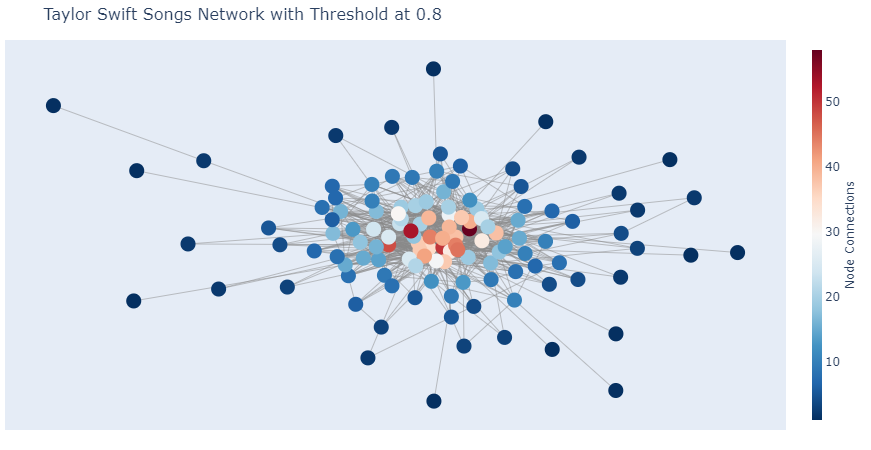

In [209]:
fig = create_graph_lyrics('Songs',0.80)
fig

In [210]:
fig.write_html("ts_lyrics_unclean_network_80.html",include_plotlyjs="cdn")

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 89
Number of connections: 234.0


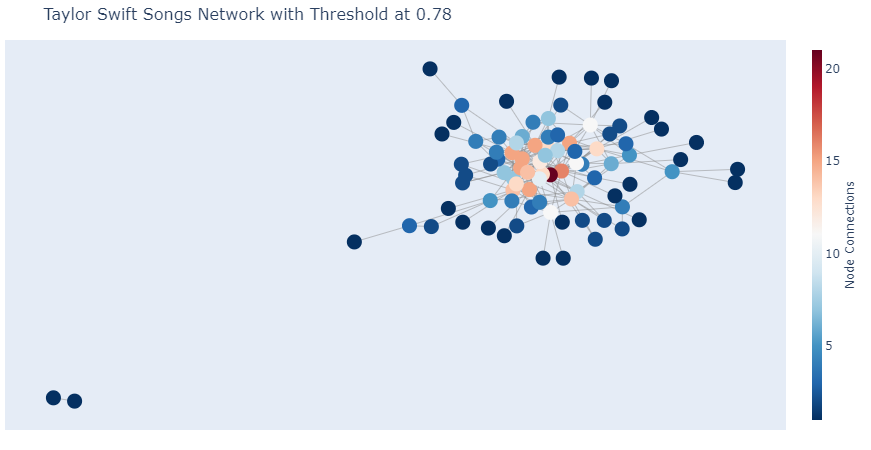

In [211]:
fig = create_graph_lyrics('Songs',0.78)
fig

In [212]:
fig.write_html("ts_lyrics_unclean_network_78.html",include_plotlyjs="cdn")

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 38
Number of connections: 48.0
Number of cycles: 5
[{'love story - fearless', "the other side of the door - fearless (taylor's version)", 'mine - speak now'}, {'girl at home - red', 'bad blood - 1989', "you're not sorry - fearless"}, {'breathe - fearless', 'afterglow - lover', 'white horse - fearless'}, {'breathe - fearless', "bye bye baby (from the vault) - fearless (taylor's version)", 'come back... be here - red'}, {'breathe - fearless', 'afterglow - lover', 'all you had to do was stay - 1989'}]


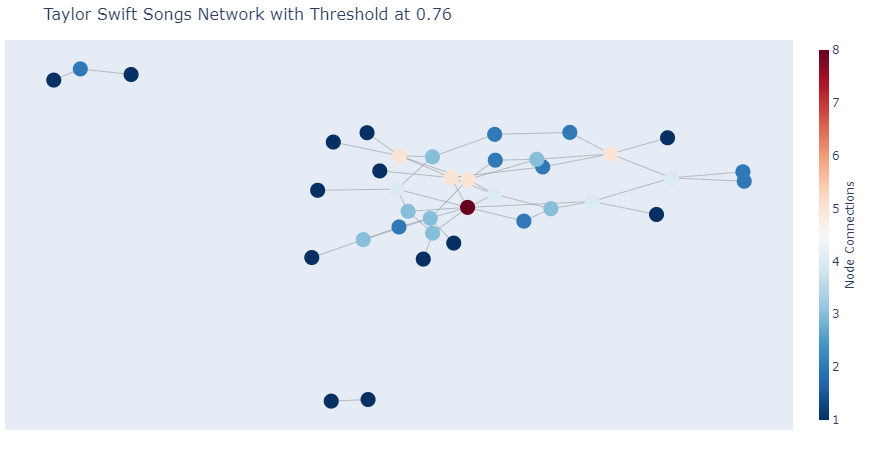

In [213]:
fig = create_graph_lyrics2('Songs',0.76)
fig

In [214]:
fig.write_html("ts_lyrics_unclean_network_76.html",include_plotlyjs="cdn")

In [215]:
lyric_feature_array = ts_lyrics_song['lyric_set'].values.tolist()
ts_songs_all = ts_lyrics_song['song_album'].values.tolist()

ts_songs_record = mlb.fit_transform(lyric_feature_array)
jac_sim = pairwise_distances(ts_songs_record, metric = "jaccard")
jac_sim = pd.DataFrame(jac_sim, index=ts_songs_all, columns=ts_songs_all)
    
jac_sim_final = jac_sim.stack().reset_index()
jac_sim_final.columns = ['source','sink','value']
jac_sim_final = jac_sim_final[(jac_sim_final['value'] > 0) & (jac_sim_final['value'] <= 0.76)]
jac_sim_final.reset_index(inplace=True,drop=True)
jac_sim_final = jac_sim_final[pd.DataFrame(np.sort(jac_sim_final[['source','sink']].values,1)).duplicated()]
jac_sim_final.reset_index(inplace=True,drop=True)
jac_sim_final.shape

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



(48, 3)

In [216]:
jac_sim_final.to_csv('ts_lyrics_close_un_link.csv',index=False)

Number of connected songs: 71
Number of connections: 98.0


/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



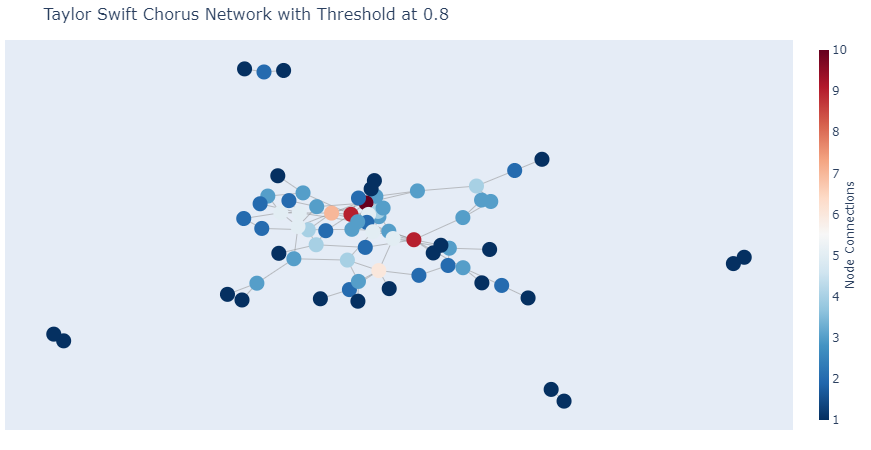

In [217]:
fig = create_graph_lyrics('Chorus',0.80)
fig

In [218]:
fig.write_html("ts_chorus_unclean_network_80.html",include_plotlyjs="cdn")

Number of connected songs: 34
Number of connections: 26.0
Number of cycles: 0
[]


/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



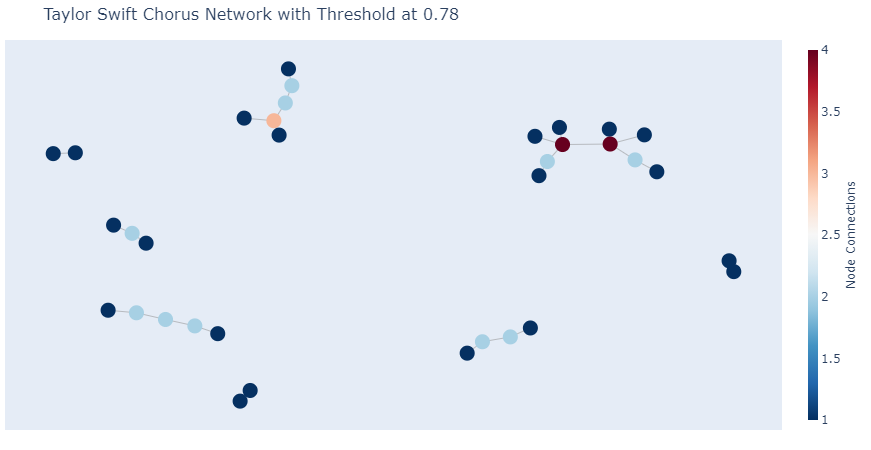

In [219]:
fig = create_graph_lyrics2('Chorus',0.78)
fig

In [220]:
fig.write_html("ts_chorus_unclean_network_78.html",include_plotlyjs="cdn")

From that, we clean the following songs by removing `stop words` and `contractions` by importing the `nltk` package.

In [221]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['la','ahh','ha','ooh','aah','ra','da','di','li','woah','whoa','yeah','oh','hee','e',"ain't","i'm","she's","he's","we'll","i'll","she'll","he'll","ah","i'd","can't","won't","would've","that's","let's","i've","should've","could've","love's","it'll","daddy's","they'll","you'll","mr","ms","mrs","mmm","uh","'til"])

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [222]:
def remove_stop_words(lyric_list):
    final_list = [x for x in lyric_list if x not in stop_words]
    return final_list

To get the top ten words and the respective counts for everything and each album, the function is used.

In [223]:
def get_top_ten_words(df,album,wordlist):
    df_album = df[df['album_name'] == album]
    df_album.reset_index(inplace=True,drop=True)
    df_album_lyrics = df_album[wordlist].values.tolist()
    df_album_lyrics_list = [item for sublist in df_album_lyrics for item in sublist]
    df_album_lyrics_list = [x for x in df_album_lyrics_list if x not in stop_words]
    most_common = Counter(df_album_lyrics_list).most_common(10)
    most_common_list = [i[0] for i in most_common]
    most_common_list_count = [i[1] for i in most_common]
    most_common_df = pd.DataFrame(most_common_list,columns=[album])
    column_name = 'count_' + album
    most_common_df[column_name] = most_common_list_count
    return most_common_df

In [224]:
ts_track_five = ts_lyrics_song[ts_lyrics_song['track_number'] == 5]
ts_track_five.reset_index(inplace=True,drop=True)
ts_nest_lyrics = ts_track_five['lyric_list'].values.tolist()
ts_unnest_lyrics = [item for sublist in ts_nest_lyrics for item in sublist]
ts_unnest_lyrics = [x for x in ts_unnest_lyrics if x not in stop_words]
most_common_lyrics = Counter(ts_unnest_lyrics).most_common(10)
most_common_lyrics_list = [i[0] for i in most_common_lyrics]
most_common_lyrics_count = [i[1] for i in most_common_lyrics]
most_common_lyrics_df = pd.DataFrame(most_common_lyrics_list,columns=['all'])
most_common_lyrics_df['count'] = most_common_lyrics_count
most_common_lyrics_df.reset_index(inplace=True,drop=True)
for album in album_names_list:
    most_common_lyrics_df = pd.concat([most_common_lyrics_df,get_top_ten_words(ts_track_five,album,'lyric_list')],axis=1)
    most_common_lyrics_df.reset_index(inplace=True,drop=True)
most_common_lyrics_df

,all,count,taylor swift,count_taylor swift,fearless,count_fearless,speak now,count_speak now,red,count_red,1989,count_1989,reputation,count_reputation,lover,count_lover,folklore,count_folklore,evermore,count_evermore
0,stay,40,never,6,late,5,think,6,remember,9,stay,31,delicate,15,right,15,go,5,watch,6
1,cause,29,away,4,white,4,young,6,cause,7,hey,8,cause,12,see,12,cursing,4,tell,6
2,like,26,shame,3,horse,4,see,5,well,7,like,7,like,8,could,11,name,4,tolerate,5
3,know,21,rainy,3,princess,3,shoulda,5,like,6,want,7,cool,8,stay,8,wishing,4,sit,4
4,see,17,ending,3,fairytale,3,known,5,'bout,3,say,7,said,8,combat,4,stayed,4,head,4
5,want,16,given,3,small,3,dear,4,lost,3,back,6,know,8,cause,3,grace,3,much,3
6,could,15,perfect,3,town,3,john,4,long,3,let,5,make,6,help,3,look,3,got,3
7,delicate,15,day,3,catch,3,gone,4,maybe,3,people,4,never,4,hold,3,tears,3,wrong,3
8,right,15,sitting,3,sorry,2,messed,4,home,2,palm,4,want,4,archer,3,ricochet,3,somehow,3
9,never,14,thinking,3,cause,2,girl,4,scarf,2,hand,4,chill,4,prey,3,want,3,know,3


Among the track fives in her discography, she used verbs the most. 

In [225]:
most_common_lyrics_df.to_csv('most_common_lyrics_five.csv',index=False)

In [226]:
ts_nest_lyrics = ts_lyrics_song['lyric_list'].values.tolist()
ts_unnest_lyrics = [item for sublist in ts_nest_lyrics for item in sublist]
ts_unnest_lyrics = [x for x in ts_unnest_lyrics if x not in stop_words]
most_common_lyrics = Counter(ts_unnest_lyrics).most_common(10)
most_common_lyrics_list = [i[0] for i in most_common_lyrics]
most_common_lyrics_count = [i[1] for i in most_common_lyrics]
most_common_lyrics_df = pd.DataFrame(most_common_lyrics_list,columns=['all'])
most_common_lyrics_df['count'] = most_common_lyrics_count
most_common_lyrics_df.reset_index(inplace=True,drop=True)
for album in album_names_list_all:
    most_common_lyrics_df = pd.concat([most_common_lyrics_df,get_top_ten_words(ts_lyrics_song,album,'lyric_list')],axis=1)
    most_common_lyrics_df.reset_index(inplace=True,drop=True)
most_common_lyrics_df

,all,count,taylor swift,count_taylor swift,fearless,count_fearless,speak now,count_speak now,red,count_red,...,reputation,count_reputation,lover,count_lover,folklore,count_folklore,evermore,count_evermore,fearless (taylor's version),count_fearless (taylor's version)
0,like,444,know,32,know,61,like,47,like,91,...,made,53,like,68,never,46,know,49,come,42
1,know,427,think,26,cause,27,know,36,know,81,...,like,52,want,51,know,42,like,48,baby,30
2,never,324,wanna,26,never,26,never,32,time,66,...,want,50,love,44,time,38,could,26,like,26
3,love,255,never,25,like,25,see,32,never,58,...,look,48,never,43,like,38,think,26,bye,26
4,time,248,back,25,feel,22,ever,32,back,43,...,call,46,see,43,would,22,never,22,time,23
5,back,223,would,22,one,21,back,31,ever,35,...,wanna,37,wanna,42,think,21,love,17,say,21
6,cause,208,said,21,see,21,go,29,one,33,...,time,34,daylight,40,one,19,man,15,'cause,21
7,one,189,see,19,way,19,time,27,stay,32,...,know,33,know,38,gave,19,right,15,way,20
8,say,188,beautiful,18,back,18,say,26,trouble,32,...,baby,33,one,36,knew,18,one,15,got,20
9,see,187,one,17,said,18,mean,22,last,32,...,first,32,cause,33,cause,18,got,14,know,20


Surprisingly, an artist known for love songs have `like` as its top one and `never` occurring more frequently than `love` itself. The terms, `like`, `love`, and `want` appear in the top three terms in `Lover` album. Maybe, this is the album whe she yearned and simped the most.

In [227]:
most_common_lyrics_df.to_csv('most_common_lyrics_all.csv',index=False)

In [228]:
ts_nest_lyrics = ts_lyrics_song['lyric_set'].values.tolist()
ts_unnest_lyrics = [item for sublist in ts_nest_lyrics for item in sublist]
ts_unnest_lyrics = [x for x in ts_unnest_lyrics if x not in stop_words]
most_common_lyrics = Counter(ts_unnest_lyrics).most_common(10)
most_common_lyrics_list = [i[0] for i in most_common_lyrics]
most_common_lyrics_count = [i[1] for i in most_common_lyrics]
most_common_lyrics_df = pd.DataFrame(most_common_lyrics_list,columns=['all'])
most_common_lyrics_df['count'] = most_common_lyrics_count
most_common_lyrics_df.reset_index(inplace=True,drop=True)
for album in album_names_list_all:
    most_common_lyrics_df = pd.concat([most_common_lyrics_df,get_top_ten_words(ts_lyrics_song,album,'lyric_set')],axis=1)
    most_common_lyrics_df.reset_index(inplace=True,drop=True)
most_common_lyrics_df

,all,count,taylor swift,count_taylor swift,fearless,count_fearless,speak now,count_speak now,red,count_red,...,reputation,count_reputation,lover,count_lover,folklore,count_folklore,evermore,count_evermore,fearless (taylor's version),count_fearless (taylor's version)
0,like,112,know,10,know,11,like,13,like,17,...,like,12,like,15,time,11,know,12,like,8
1,know,105,see,8,cause,11,see,11,know,15,...,cause,11,know,11,like,11,like,11,love,8
2,time,77,way,8,say,10,know,11,time,15,...,one,9,go,11,know,10,could,8,say,7
3,never,77,never,8,like,9,never,10,right,12,...,say,9,say,10,one,10,go,8,time,7
4,cause,76,one,8,back,9,around,9,cause,12,...,know,8,wanna,9,think,8,life,7,'cause,7
5,back,74,back,7,got,9,mind,9,back,11,...,time,8,home,9,would,8,one,7,know,7
6,say,71,say,7,never,9,back,8,never,10,...,nothing,7,cause,9,never,7,think,7,right,7
7,one,69,love,7,way,8,cause,8,alone,9,...,love,7,see,9,cause,7,eyes,7,see,7
8,see,68,like,6,one,8,time,8,got,9,...,never,7,love,8,around,7,every,6,every,6
9,love,66,right,6,time,7,nothing,7,love,8,...,got,7,night,8,heart,7,time,6,baby,6


For the most used word in a song, `like` appeared in 112 songs.

In [229]:
most_common_lyrics_df.to_csv('most_used_lyrics_all.csv',index=False)

In [230]:
ts_nest_lyrics = ts_lyrics_chorus_song['lyric_list'].values.tolist()
ts_unnest_lyrics = [item for sublist in ts_nest_lyrics for item in sublist]
ts_unnest_lyrics = [x for x in ts_unnest_lyrics if x not in stop_words]
most_common_lyrics = Counter(ts_unnest_lyrics).most_common(10)
most_common_lyrics_list = [i[0] for i in most_common_lyrics]
most_common_lyrics_count = [i[1] for i in most_common_lyrics]
most_common_lyrics_df = pd.DataFrame(most_common_lyrics_list,columns=['all'])
most_common_lyrics_df['count'] = most_common_lyrics_count
most_common_lyrics_df.reset_index(inplace=True,drop=True)
for album in album_names_list_all:
    most_common_lyrics_df = pd.concat([most_common_lyrics_df,get_top_ten_words(ts_lyrics_chorus_song,album,'lyric_list')],axis=1)
    most_common_lyrics_df.reset_index(inplace=True,drop=True)
most_common_lyrics_df    

,all,count,taylor swift,count_taylor swift,fearless,count_fearless,speak now,count_speak now,red,count_red,...,reputation,count_reputation,lover,count_lover,folklore,count_folklore,evermore,count_evermore,fearless (taylor's version),count_fearless (taylor's version)
0,know,178,wanna,24,know,32,ever,27,never,42,...,made,39,daylight,33,like,19,know,25,come,32
1,like,165,think,20,feel,17,go,22,like,34,...,look,37,get,26,know,16,like,22,baby,29
2,never,156,know,19,cause,16,grow,21,ever,27,...,want,31,man,24,would,16,could,13,bye,26
3,love,129,back,18,love,15,back,19,know,25,...,first,26,like,23,never,15,hand,12,way,14
4,baby,112,would,17,help,14,like,17,back,25,...,things,21,never,23,think,14,died,12,'cause,13
5,back,110,never,16,rains,12,never,15,trouble,24,...,wanna,21,love,22,time,14,stay,12,love,13
6,cause,106,beautiful,14,like,11,time,14,stay,20,...,dancing,21,see,22,love,10,dead,12,leave,12
7,one,96,let,12,baby,11,see,14,one,19,...,call,21,one,22,one,9,alive,12,say,12
8,think,94,hope,11,tell,11,mean,14,time,18,...,take,19,wanna,21,woman,9,yes,12,want,12
9,got,91,song,11,one,11,still,14,everybody,18,...,end,18,baby,17,seen,9,take,10,must,11


For the choruses, she has used more hooks than ever in `1989` compared to other albums.

In [231]:
most_common_lyrics_df.to_csv('most_common_chorus_all.csv',index=False)

In [232]:
ts_nest_lyrics = ts_lyrics_chorus_song['lyric_set'].values.tolist()
ts_unnest_lyrics = [item for sublist in ts_nest_lyrics for item in sublist]
ts_unnest_lyrics = [x for x in ts_unnest_lyrics if x not in stop_words]
most_common_lyrics = Counter(ts_unnest_lyrics).most_common(10)
most_common_lyrics_list = [i[0] for i in most_common_lyrics]
most_common_lyrics_count = [i[1] for i in most_common_lyrics]
most_common_lyrics_df = pd.DataFrame(most_common_lyrics_list,columns=['all'])
most_common_lyrics_df['count'] = most_common_lyrics_count
most_common_lyrics_df.reset_index(inplace=True,drop=True)
for album in album_names_list_all:
    most_common_lyrics_df = pd.concat([most_common_lyrics_df,get_top_ten_words(ts_lyrics_chorus_song,album,'lyric_set')],axis=1)
    most_common_lyrics_df.reset_index(inplace=True,drop=True)
most_common_lyrics_df

,all,count,taylor swift,count_taylor swift,fearless,count_fearless,speak now,count_speak now,red,count_red,...,reputation,count_reputation,lover,count_lover,folklore,count_folklore,evermore,count_evermore,fearless (taylor's version),count_fearless (taylor's version)
0,like,42,know,6,know,6,around,5,like,9,...,want,5,love,6,like,6,know,5,baby,6
1,know,39,never,5,cause,6,go,5,never,7,...,baby,4,like,6,time,5,hand,3,'cause,4
2,cause,33,back,4,feel,6,like,4,cause,7,...,take,3,get,5,never,4,could,3,want,4
3,never,32,one,4,love,5,back,4,we're,4,...,know,3,darling,4,think,4,love,3,love,4
4,love,32,let,4,take,4,lights,4,know,4,...,things,3,baby,4,one,4,like,3,say,3
5,baby,29,like,3,like,4,time,4,back,4,...,first,3,away,4,know,4,got,3,gonna,3
6,back,26,song,3,there's,4,ever,3,love,3,...,say,3,thought,3,leaving,3,leave,2,leave,3
7,time,26,time,3,baby,4,make,3,coming,3,...,bad,3,ever,3,cause,3,never,2,come,3
8,one,25,cause,3,one,4,turn,3,red,3,...,like,3,know,3,tell,3,hometown,2,side,3
9,want,22,still,3,nothing,3,never,3,ever,3,...,time,2,cause,3,around,3,bone,2,feel,3


In [233]:
most_common_lyrics_df.to_csv('most_used_chorus_all.csv',index=False)

Finally, we apply the removal of `stop words` and `contractions` to the `lyric_list` and `lyric_set`. Then we define the lexical uniqueness as the ratio of `lyric_set` to `lyric_list`.

In [234]:
%%time
ts_lyrics_song['lyric_list'] = ts_lyrics_song['lyric_list'].apply(remove_stop_words)
ts_lyrics_song['list_length'] = ts_lyrics_song['lyric_list'].apply(lambda x: len(x))
ts_lyrics_song['lyric_set'] = ts_lyrics_song['lyric_list'].apply(lambda x: list(set(x)))
ts_lyrics_song['set_length'] = ts_lyrics_song['lyric_set'].apply(lambda x: len(x))
ts_lyrics_song['lexical_uniqueness'] = ts_lyrics_song['set_length']/ts_lyrics_song['list_length']
ts_lyrics_song.head()

CPU times: user 104 ms, sys: 3.84 ms, total: 108 ms
Wall time: 107 ms


,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,lexical_uniqueness
0,1,taylor swift,tim mcgraw,he said the way my blue eyes shined put those ...,"[said, way, blue, eyes, shined, put, georgia, ...","[chest, saw, happiness, like, back, standing, ...",tim mcgraw - taylor swift,182,83,0.456044
1,2,taylor swift,picture to burn,"state the obvious, i didn't get my perfect fan...","[state, obvious, get, perfect, fantasy, realiz...","[wasted, keep, ever, another, really, say, gon...",picture to burn - taylor swift,155,68,0.438710
2,3,taylor swift,teardrops on my guitar,drew looks at me i fake a smile so he won't se...,"[drew, looks, fake, smile, see, want, needing,...","[reason, bet, need, see, drew, put, walks, kno...",teardrops on my guitar - taylor swift,120,80,0.666667
3,4,taylor swift,a place in this world,"i don't know what i want, so don't ask me caus...","[know, want, ask, cause, still, trying, figure...","[lucky, figure, sunshine, want, mission, place...",a place in this world - taylor swift,82,49,0.597561
4,5,taylor swift,cold as you,you have a way of coming easily to me and when...,"[way, coming, easily, take, take, best, start,...","[adore, defending, want, ending, something, sa...",cold as you - taylor swift,100,62,0.620000


In [235]:
ts_lyrics_song.to_csv('taylor_lyrics_by_song.csv',index=False)

In [236]:
%%time
ts_lyrics_chorus_song['lyric_list'] = ts_lyrics_chorus_song['lyric_list'].apply(remove_stop_words)
ts_lyrics_chorus_song['list_length'] = ts_lyrics_chorus_song['lyric_list'].apply(lambda x: len(x))
ts_lyrics_chorus_song['lyric_set'] = ts_lyrics_chorus_song['lyric_list'].apply(lambda x: list(set(x)))
ts_lyrics_chorus_song['set_length'] = ts_lyrics_chorus_song['lyric_set'].apply(lambda x: len(x))
ts_lyrics_chorus_song['chorus_uniqueness'] = ts_lyrics_chorus_song['set_length']/ts_lyrics_chorus_song['list_length']
ts_lyrics_chorus_song.head()

CPU times: user 49.7 ms, sys: 0 ns, total: 49.7 ms
Wall time: 48.3 ms


,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,chorus_uniqueness
0,1,taylor swift,tim mcgraw,but when you think tim mcgraw i hope you think...,"[think, tim, mcgraw, hope, think, favorite, so...","[chest, tim, old, dress, happiness, like, mcgr...",tim mcgraw - taylor swift,93,29,0.311828
1,2,taylor swift,picture to burn,i hate that stupid old pickup truck you never ...,"[hate, stupid, old, pickup, truck, never, let,...","[wasted, another, really, truck, watch, old, f...",picture to burn - taylor swift,97,27,0.278351
2,3,taylor swift,teardrops on my guitar,he's the reason for the teardrops on my guitar...,"[reason, teardrops, guitar, thing, keeps, wish...","[star, keep, singing, reason, break, guitar, w...",teardrops on my guitar - taylor swift,41,19,0.463415
3,4,taylor swift,a place in this world,"i'm alone, on my own, and that's all i know i'...","[alone, know, strong, wrong, life, goes, girl,...","[goes, girl, trying, strong, place, find, alon...",a place in this world - taylor swift,35,11,0.314286
4,5,taylor swift,cold as you,"oh, what a shame, what a rainy ending given to...","[shame, rainy, ending, given, perfect, day, wa...","[defending, ending, say, use, cold, walk, perf...",cold as you - taylor swift,54,24,0.444444


In [237]:
ts_lyrics_chorus_song.to_csv('taylor_chorus_by_song.csv',index=False)

In [238]:
ts_lyrics_song.nsmallest(7, 'set_length', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,lexical_uniqueness
13,14,taylor swift,a perfectly good heart,why would you wanna break a perfectly good hea...,"[would, wanna, break, perfectly, good, heart, ...","[make, break, say, good, scar, maybe, unbroken...",a perfectly good heart - taylor swift,118,36,0.305085
64,5,1989,all you had to do was stay,people like you always want back the love they...,"[people, like, always, want, back, love, gave,...","[late, want, pieces, say, hand, aside, gone, g...",all you had to do was stay - 1989,138,42,0.304348
138,15,fearless (taylor's version),untouchable,untouchable like a distant diamond sky i'm rea...,"[untouchable, like, distant, diamond, sky, rea...","[spelling, want, reaching, say, come, like, si...",untouchable - fearless (taylor's version),175,42,0.240000
12,13,taylor swift,invisible,she can't see the way your eyes light up when ...,"[see, way, eyes, light, smile, never, notice, ...","[make, want, unbelievable, we're, gonna, baby,...",invisible - taylor swift,101,44,0.435644
118,13,folklore,epiphany,"keep your helmet, keep your life, son just a f...","[keep, helmet, keep, life, son, flesh, wound, ...","[keep, serve, wound, make, helmet, something, ...",epiphany - folklore,77,44,0.571429
147,25,fearless (taylor's version),don't you (from the vault),"hey, i knew i'd run into you somewhere it's be...","[hey, knew, run, somewhere, mean, stare, heard...","[make, want, sure, really, outta, say, somethi...",don't you (from the vault) - fearless (taylor'...,66,44,0.666667
69,10,1989,how you get the girl,"oh, oh, oh oh, oh, oh oh oh, oh oh stand there...","[stand, like, ghost, shaking, rain, rain, open...","[ghost, works, ever, want, say, alone, rain, l...",how you get the girl - 1989,150,46,0.306667


For the smallest songs in terms of number of words used, most of them came from the first album. Maybe, the older people are right. When you are young, they assume you know nothing.

In [239]:
ts_lyrics_song.nlargest(7, 'set_length', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,lexical_uniqueness
74,2,reputation,end game,i wanna be your end game i wanna be your first...,"[wanna, end, game, wanna, first, string, wanna...","[something, come, like, bluff, call, need, see...",end game - reputation,312,139,0.445513
45,5,red,all too well,i walked through the door with you the air was...,"[walked, door, air, cold, something, 'bout, fe...","[something, lost, like, felt, back, much, almo...",all too well - red,188,137,0.728723
61,2,1989,blank space,"nice to meet you, where you been? i could show...","[nice, meet, could, show, incredible, things, ...","[darling, ex-lovers, crying, come, saw, weeken...",blank space - 1989,258,125,0.484496
25,12,fearless,the best day,"i'm five years old, it's getting cold, i've go...","[five, years, old, getting, cold, got, big, co...","[grew, legs, crying, come, seven, space, back,...",the best day - fearless,151,115,0.761589
128,7,evermore,happiness,"honey, when i'm above the trees i see this for...","[honey, trees, see, right, years, given, shit,...","[mine, winning, happiness, like, seven, weapon...",happiness - evermore,170,114,0.670588
94,7,lover,miss americana & the heartbreak prince,"you know i adore you, i'm crazier for you than...","[know, adore, crazier, 16, lost, film, scene, ...","[adore, glory, darling, really, battered, come...",miss americana & the heartbreak prince - lover,264,113,0.428030
108,3,folklore,the last great american dynasty,"rebekah rode up on the afternoon train, it was...","[rebekah, rode, afternoon, train, sunny, saltb...","[swam, feud, filled, midnight, loud, shameless...",the last great american dynasty - folklore,169,113,0.668639


Her most verbose songs are diverse. In particular, `All Too Well` from `Red` is just second to `End Game`.

In [240]:
ts_lyrics_song.nsmallest(7, 'lexical_uniqueness', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,lexical_uniqueness
65,6,1989,shake it off,i stay out too late got nothing in my brain th...,"[stay, late, got, nothing, brain, people, say,...","[late, keep, make, break, mmhm, say, gonna, al...",shake it off - 1989,272,64,0.235294
138,15,fearless (taylor's version),untouchable,untouchable like a distant diamond sky i'm rea...,"[untouchable, like, distant, diamond, sky, rea...","[spelling, want, reaching, say, come, like, si...",untouchable - fearless (taylor's version),175,42,0.240000
67,8,1989,bad blood,"cause baby, now we've got bad blood you know i...","[cause, baby, we've, got, bad, blood, know, us...","[wound, really, look, say, baby, good, cold, p...",bad blood - 1989,258,67,0.259690
66,7,1989,i wish you would,"it's 2am in your car windows down, you pass my...","[2am, car, windows, pass, street, memories, st...","[said, push, hide, want, we're, say, good, dar...",i wish you would - 1989,265,73,0.275472
63,4,1989,out of the woods,looking at it now it all seems so simple we we...,"[looking, seems, simple, lying, couch, remembe...","[said, white, turned, took, good, baby, hangin...",out of the woods - 1989,234,67,0.286325
60,1,1989,welcome to new york,"walking through a crowd, the village is aglow ...","[walking, crowd, village, aglow, kaleidoscope,...","[hearts, said, kaleidoscope, floors, broken, w...",welcome to new york - 1989,191,56,0.293194
64,5,1989,all you had to do was stay,people like you always want back the love they...,"[people, like, always, want, back, love, gave,...","[late, want, pieces, say, hand, aside, gone, g...",all you had to do was stay - 1989,138,42,0.304348


In terms of `lexical uniqueness`, the top 6 came from `1989`.

In [241]:
ts_lyrics_song.nlargest(7, 'lexical_uniqueness', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,lexical_uniqueness
123,2,evermore,champagne problems,you booked the night train for a reason so you...,"[booked, night, train, reason, could, sit, hur...","[reason, celebrating, sure, someone's, problem...",champagne problems - evermore,137,107,0.781022
104,17,lover,it's nice to have a friend,"ooh ooh school bell rings, walk me home sidewa...","[school, bell, rings, walk, home, sidewalk, ch...","[bell, fun, rings, 20, something, hand, touch,...",it's nice to have a friend - lover,80,62,0.775000
116,11,folklore,invisible string,green was the color of the grass where i used ...,"[green, color, grass, used, read, centennial, ...","[tying, something, ate, presents, grass, color...",invisible string - folklore,135,103,0.762963
25,12,fearless,the best day,"i'm five years old, it's getting cold, i've go...","[five, years, old, getting, cold, got, big, co...","[grew, legs, crying, come, seven, space, back,...",the best day - fearless,151,115,0.761589
45,5,red,all too well,i walked through the door with you the air was...,"[walked, door, air, cold, something, 'bout, fe...","[something, lost, like, felt, back, much, almo...",all too well - red,188,137,0.728723
115,10,folklore,illicit affairs,make sure nobody sees you leave hood over your...,"[make, sure, nobody, sees, leave, hood, head, ...","[sure, road, speak, like, call, see, million, ...",illicit affairs - folklore,121,87,0.719008
110,5,folklore,my tears ricochet,"we gather here, we line up, weeping in a sunli...","[gather, line, weeping, sunlit, room, fire, ma...","[jewels, anywhere, screaming, name, room, made...",my tears ricochet - folklore,124,88,0.709677


Three of the Top 7 came from `folklore`. Her most verbose song is `champagne problems` from evermore.

In [242]:
ts_lyrics_chorus_song.nsmallest(7, 'set_length', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,chorus_uniqueness
20,7,fearless,breathe,"and i can't breathe without you, but i have to...","[breathe, without, breathe, without, breathe, ...","[without, breathe]",breathe - fearless,14,2,0.142857
78,6,reputation,look what you made me do,"ooh, look what you made me do look what you ma...","[look, made, look, made, look, made, look, mad...","[made, look]",look what you made me do - reputation,64,2,0.031250
104,17,lover,it's nice to have a friend,it's nice to have a friend (ooh) it's nice to ...,"[nice, friend, nice, friend, nice, friend, nic...","[nice, friend]",it's nice to have a friend - lover,14,2,0.142857
53,13,red,the lucky one,"and they'll tell you now, you're the lucky one...","[tell, lucky, one, tell, lucky, one, tell, luc...","[lucky, one, let, tell]",the lucky one - red,39,4,0.102564
63,4,1989,out of the woods,are we out of the woods yet? are we out of the...,"[woods, yet, woods, yet, woods, yet, woods, cl...","[clear, yet, woods, good]",out of the woods - 1989,131,4,0.030534
99,12,lover,soon you'll get better,"ooh ah soon, you'll get better ooh ah soon, yo...","[soon, get, better, soon, get, better, get, be...","[cause, soon, get, better]",soon you'll get better - lover,38,4,0.105263
118,13,folklore,epiphany,"with you i serve, with you i fall down, down w...","[serve, fall, watch, breathe, watch, breathing...","[serve, fall, watch, breathe, breathing]",epiphany - folklore,21,5,0.238095
128,7,evermore,happiness,there'll be happiness after you but there was ...,"[there'll, happiness, happiness, things, true,...","[there'll, believe, true, things, happiness]",happiness - evermore,18,5,0.277778
134,13,evermore,marjorie,what died didn't stay dead what died didn't st...,"[died, stay, dead, died, stay, dead, alive, al...","[stay, died, alive, head, dead]",marjorie - evermore,51,5,0.098039


In [243]:
ts_lyrics_chorus_song.nlargest(7, 'set_length', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,chorus_uniqueness
9,10,taylor swift,mary's song (oh my my my),take me back to the house in the backyard tree...,"[take, back, house, backyard, tree, said, beat...","[said, years, turned, truck, light, world, ais...",mary's song (oh my my my) - taylor swift,68,55,0.808824
107,2,folklore,cardigan,but i knew you dancing in your levi's drunk un...,"[knew, dancing, levi's, drunk, streetlight, kn...","[streetlight, drunk, hide, ending, giving, han...",cardigan - folklore,49,41,0.836735
15,2,fearless,fifteen,cause when you're fifteen and somebody tells y...,"[cause, fifteen, somebody, tells, love, gonna,...","[might, figure, look, gonna, team, count, like...",fifteen - fearless,65,40,0.615385
25,12,fearless,the best day,i don't know why all the trees change in the f...,"[know, trees, change, fall, know, scared, anyt...","[giving, okay, say, far, school, knew, best, t...",the best day - fearless,60,40,0.666667
16,3,fearless,love story,"romeo, take me somewhere we can be alone i'll ...","[romeo, take, somewhere, alone, waiting, there...","[romeo, white, make, really, say, baby, alone,...",love story - fearless,65,37,0.569231
110,5,folklore,my tears ricochet,i didn't have it in myself to go with grace an...,"[go, grace, hero, flying, around, saving, face...","[drunk, years, turned, look, good, wake, sink,...",my tears ricochet - folklore,61,37,0.606557
123,2,evermore,champagne problems,because i dropped your hand while dancing left...,"[dropped, hand, dancing, left, standing, crest...","[reason, hand, called, give, hold, leave, prob...",champagne problems - evermore,58,37,0.637931


Her most verbost choruses came from `Fearless` and the last two album.

In [244]:
ts_lyrics_chorus_song.nsmallest(7, 'chorus_uniqueness', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,chorus_uniqueness
63,4,1989,out of the woods,are we out of the woods yet? are we out of the...,"[woods, yet, woods, yet, woods, yet, woods, cl...","[clear, yet, woods, good]",out of the woods - 1989,131,4,0.030534
78,6,reputation,look what you made me do,"ooh, look what you made me do look what you ma...","[look, made, look, made, look, made, look, mad...","[made, look]",look what you made me do - reputation,64,2,0.031250
74,2,reputation,end game,i wanna be your end game i wanna be your first...,"[wanna, end, game, wanna, first, string, wanna...","[wanna, end, game, first, a-team, string]",end game - reputation,85,6,0.070588
65,6,1989,shake it off,"cause the players gonna play, play, play, play...","[cause, players, gonna, play, play, play, play...","[break, players, mmhm, gonna, cause, hate, bab...",shake it off - 1989,146,13,0.089041
60,1,1989,welcome to new york,"welcome to new york, it's been waiting for you...","[welcome, new, york, waiting, welcome, new, yo...","[soundtrack, new, york, forevermore, blind, we...",welcome to new york - 1989,138,13,0.094203
134,13,evermore,marjorie,what died didn't stay dead what died didn't st...,"[died, stay, dead, died, stay, dead, alive, al...","[stay, died, alive, head, dead]",marjorie - evermore,51,5,0.098039
53,13,red,the lucky one,"and they'll tell you now, you're the lucky one...","[tell, lucky, one, tell, lucky, one, tell, luc...","[lucky, one, let, tell]",the lucky one - red,39,4,0.102564


Most of the least vrbose lyrics came from `1989` or `reputation`.

In [245]:
ts_lyrics_chorus_song.nlargest(7, 'chorus_uniqueness', keep='all')

,track_number,album_name,track_name,lyric,lyric_list,lyric_set,song_album,list_length,set_length,chorus_uniqueness
107,2,folklore,cardigan,but i knew you dancing in your levi's drunk un...,"[knew, dancing, levi's, drunk, streetlight, kn...","[streetlight, drunk, hide, ending, giving, han...",cardigan - folklore,49,41,0.836735
45,5,red,all too well,cause there we are again on that little town s...,"[cause, little, town, street, almost, ran, red...","[ever, we're, light, rare, street, lost, stair...",all too well - red,37,30,0.810811
9,10,taylor swift,mary's song (oh my my my),take me back to the house in the backyard tree...,"[take, back, house, backyard, tree, said, beat...","[said, years, turned, truck, light, world, ais...",mary's song (oh my my my) - taylor swift,68,55,0.808824
25,12,fearless,the best day,i don't know why all the trees change in the f...,"[know, trees, change, fall, know, scared, anyt...","[giving, okay, say, far, school, knew, best, t...",the best day - fearless,60,40,0.666667
123,2,evermore,champagne problems,because i dropped your hand while dancing left...,"[dropped, hand, dancing, left, standing, crest...","[reason, hand, called, give, hold, leave, prob...",champagne problems - evermore,58,37,0.637931
15,2,fearless,fifteen,cause when you're fifteen and somebody tells y...,"[cause, fifteen, somebody, tells, love, gonna,...","[might, figure, look, gonna, team, count, like...",fifteen - fearless,65,40,0.615385
110,5,folklore,my tears ricochet,i didn't have it in myself to go with grace an...,"[go, grace, hero, flying, around, saving, face...","[drunk, years, turned, look, good, wake, sink,...",my tears ricochet - folklore,61,37,0.606557


Excluding 3, the seven of them came from either `Fearless` or `folklore`.

Then, we recreated those connected songs but with cleaner tokens.

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 124
Number of connections: 759.0


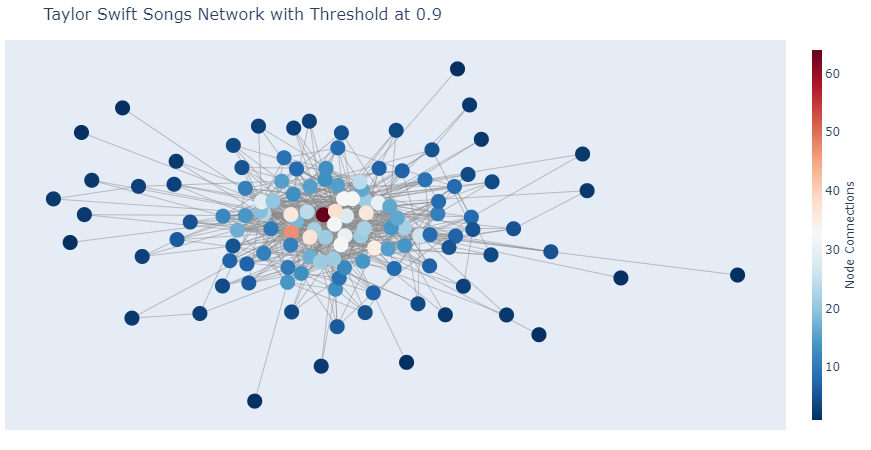

In [246]:
fig = create_graph_lyrics('Songs',0.90)
fig

In [247]:
fig.write_html("ts_song_clean_network_90.html",include_plotlyjs="cdn")

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 107
Number of connections: 355.0


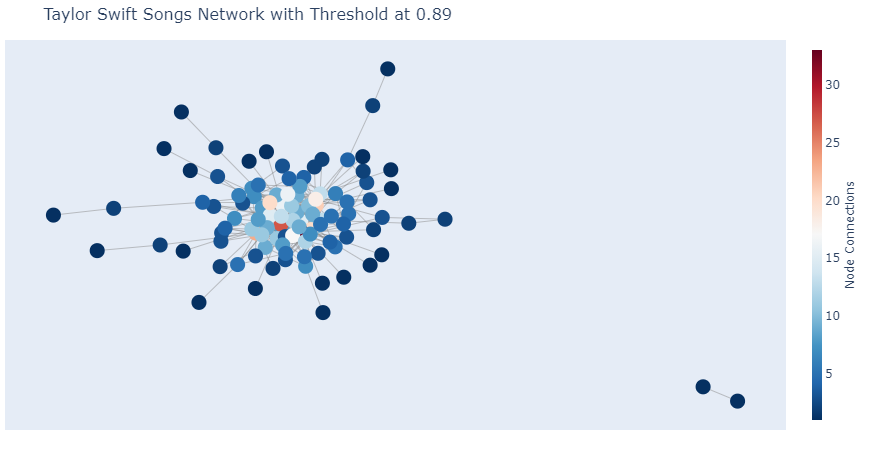

In [248]:
fig = create_graph_lyrics('Songs',0.89)
fig

In [249]:
fig.write_html("ts_song_clean_network_89.html",include_plotlyjs="cdn")

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 81
Number of connections: 169.0


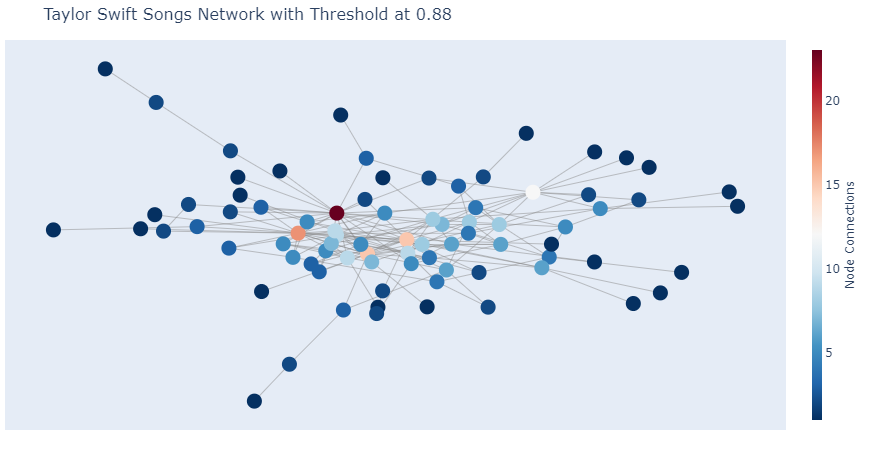

In [250]:
fig = create_graph_lyrics('Songs',0.88)
fig

In [251]:
fig.write_html("ts_song_clean_network_88.html",include_plotlyjs="cdn")

Number of connected songs: 52
Number of connections: 77.0


/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



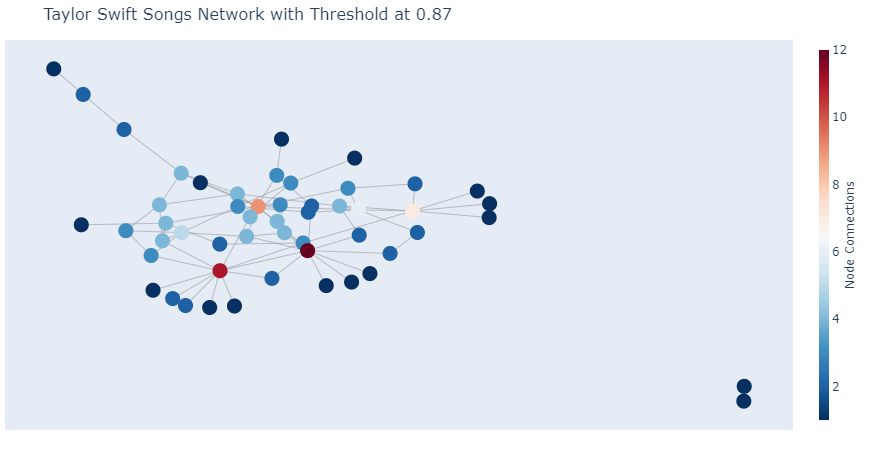

In [252]:
fig = create_graph_lyrics('Songs',0.87)
fig

In [253]:
fig.write_html("ts_song_clean_network_87.html",include_plotlyjs="cdn")

In [254]:
lyric_feature_array = ts_lyrics_song['lyric_set'].values.tolist()
ts_songs_all = ts_lyrics_song['song_album'].values.tolist()

ts_songs_record = mlb.fit_transform(lyric_feature_array)
jac_sim = pairwise_distances(ts_songs_record, metric = "jaccard")
jac_sim = pd.DataFrame(jac_sim, index=ts_songs_all, columns=ts_songs_all)
    
jac_sim_final = jac_sim.stack().reset_index()
jac_sim_final.columns = ['source','sink','value']
jac_sim_final = jac_sim_final[(jac_sim_final['value'] > 0) & (jac_sim_final['value'] <= 0.87)]
jac_sim_final.reset_index(inplace=True,drop=True)
jac_sim_final = jac_sim_final[pd.DataFrame(np.sort(jac_sim_final[['source','sink']].values,1)).duplicated()]
jac_sim_final.reset_index(inplace=True,drop=True)
jac_sim_final.head()

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



,source,sink,value
0,a place in this world - taylor swift,teardrops on my guitar - taylor swift,0.858407
1,invisible - taylor swift,teardrops on my guitar - taylor swift,0.851852
2,hey stephen - fearless,fifteen - fearless,0.847561
3,you belong with me - fearless,fifteen - fearless,0.869318
4,tell me why - fearless,should've said no - taylor swift,0.827273


In [255]:
jac_sim_final.shape

(77, 3)

In [256]:
jac_sim_final.to_csv('ts_lyrics_close_cl_link.csv',index=False)

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 103
Number of connections: 183.0


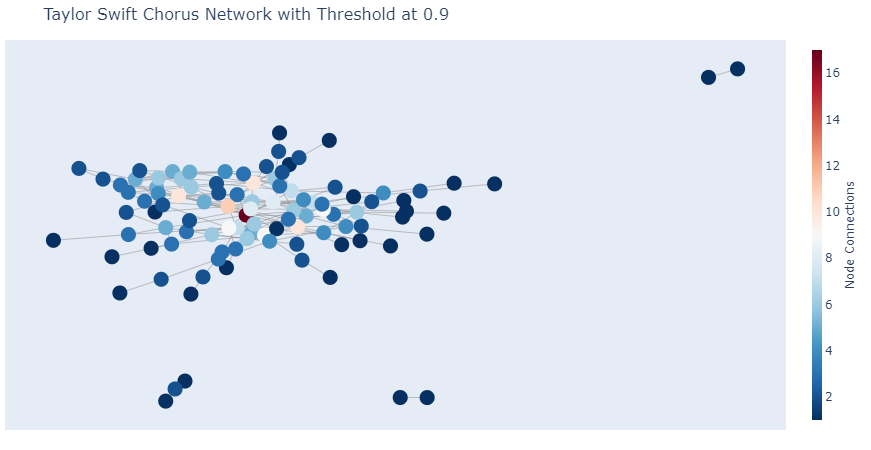

In [257]:
fig = create_graph_lyrics('Chorus',0.90)
fig

In [258]:
fig.write_html("ts_chorus_clean_network_90.html",include_plotlyjs="cdn")

/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



Number of connected songs: 85
Number of connections: 114.0


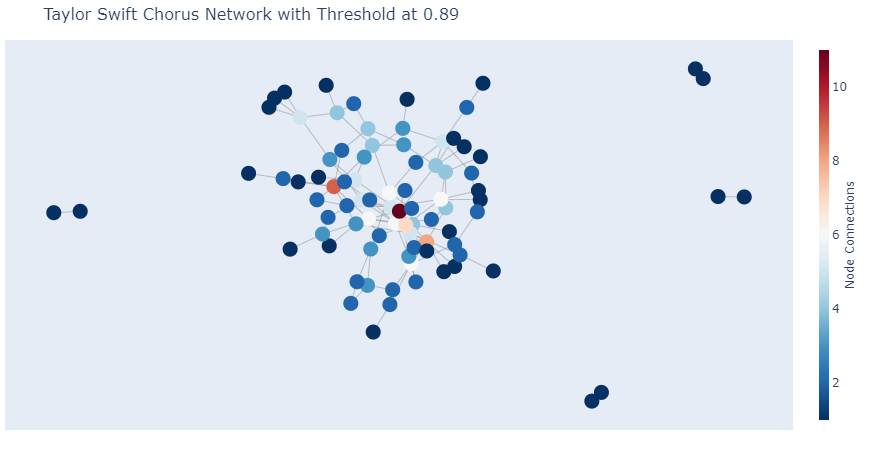

In [259]:
fig = create_graph_lyrics('Chorus',0.89)
fig

In [260]:
fig.write_html("ts_chorus_clean_network_89.html",include_plotlyjs="cdn")

Number of connected songs: 65
Number of connections: 73.0


/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



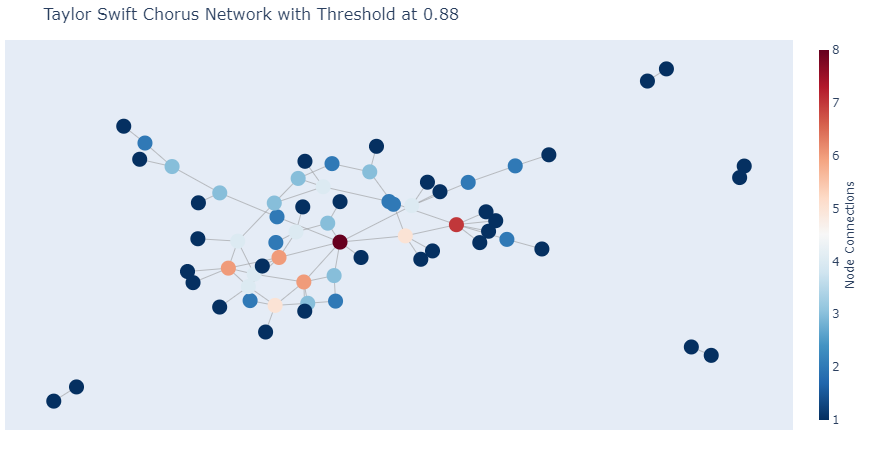

In [261]:
fig = create_graph_lyrics('Chorus',0.88)
fig

In [262]:
fig.write_html("ts_chorus_clean_network_88.html",include_plotlyjs="cdn")

Number of connected songs: 41
Number of connections: 38.0


/opt/conda/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:1765: DataConversionWarning:

Data was converted to boolean for metric jaccard



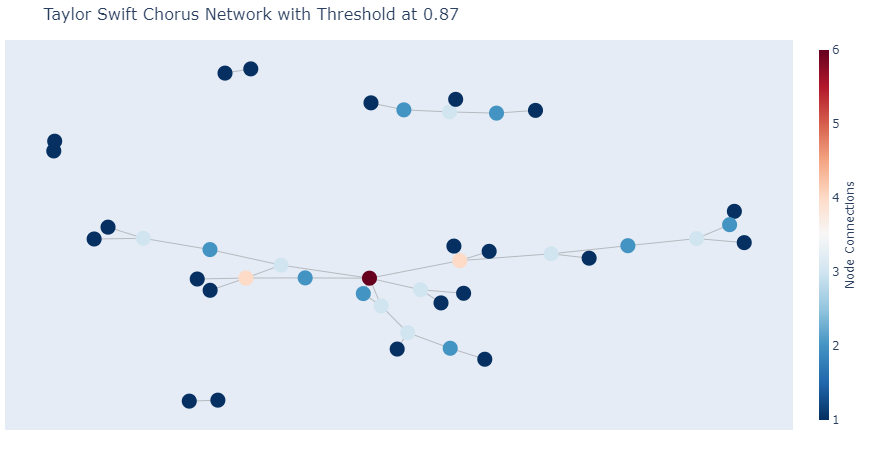

In [263]:
fig = create_graph_lyrics('Chorus',0.87)
fig

In [264]:
fig.write_html("ts_chorus_clean_network_87.html",include_plotlyjs="cdn")

From those networks, we graphed the respective violin plots for `lyric_list`, `lyric_set`, and `uniqueness`.

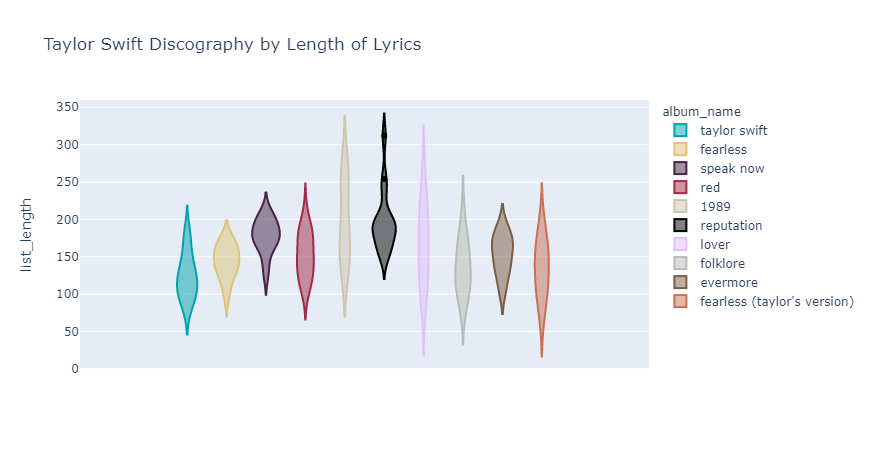

In [265]:
fig = px.violin(ts_lyrics_song, y="list_length", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Discography by Length of Lyrics")
fig.show()

In [266]:
fig.write_html("ts_disco_lyrics_length.html",include_plotlyjs="cdn")

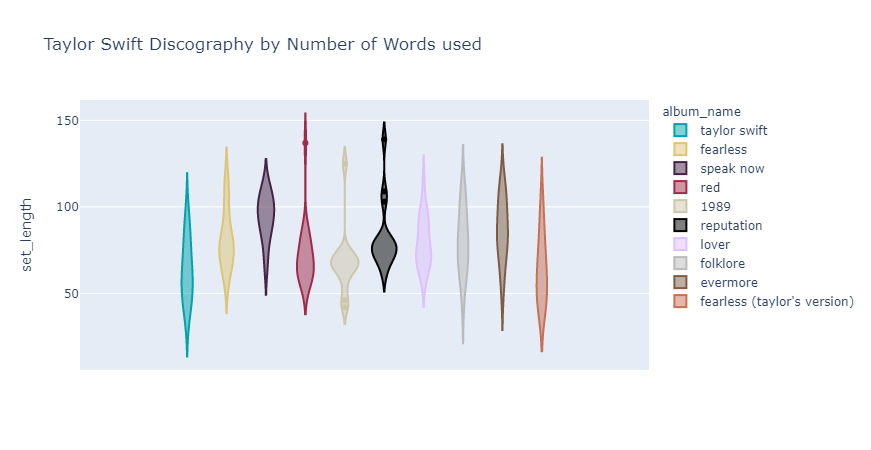

In [267]:
fig = px.violin(ts_lyrics_song, y="set_length", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Discography by Number of Words used")
fig.show()

In [268]:
fig.write_html("ts_disco_set_length.html",include_plotlyjs="cdn")

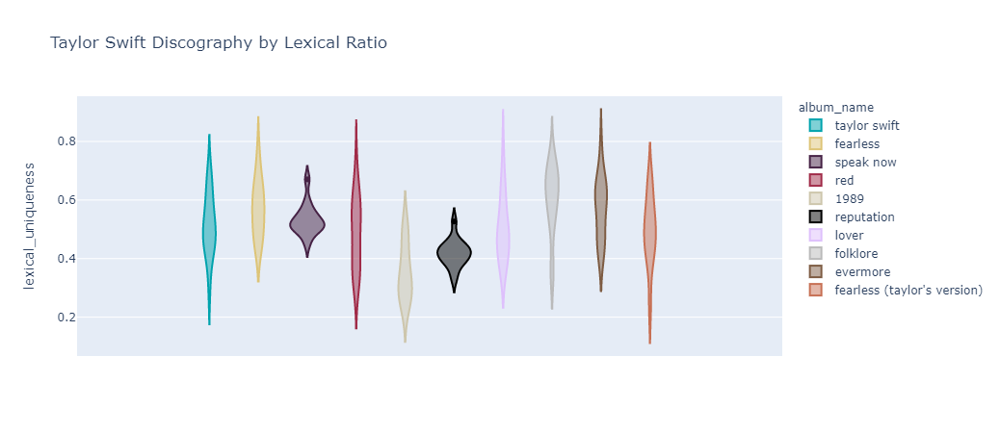

In [269]:
fig = px.violin(ts_lyrics_song, y="lexical_uniqueness", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Discography by Lexical Ratio")
fig.show()

The distribution between songs in `Speak Now` and `reputation` are similar. Furthermore, the verbosities have move upward from `Lover` onwards.

In [270]:
fig.write_html("ts_disco_lyrics_ratio.html",include_plotlyjs="cdn")

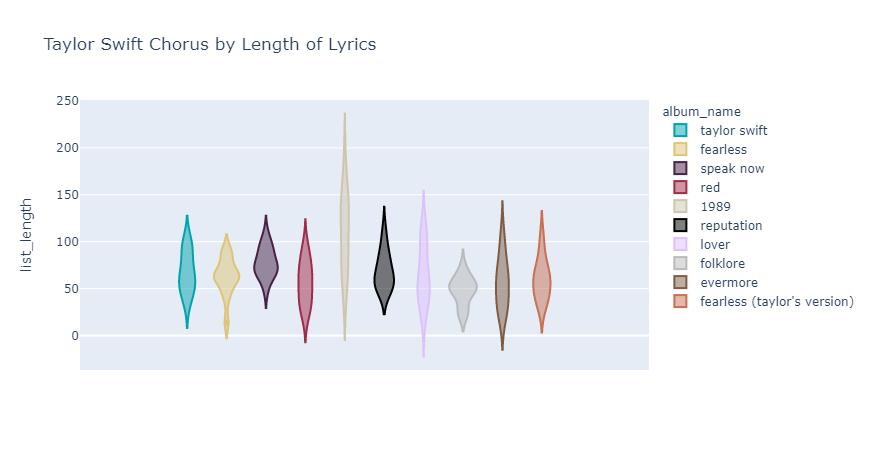

In [271]:
fig = px.violin(ts_lyrics_chorus_song, y="list_length", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Chorus by Length of Lyrics")
fig.show()

In [272]:
fig.write_html("ts_chorus_lyrics_length.html",include_plotlyjs="cdn")

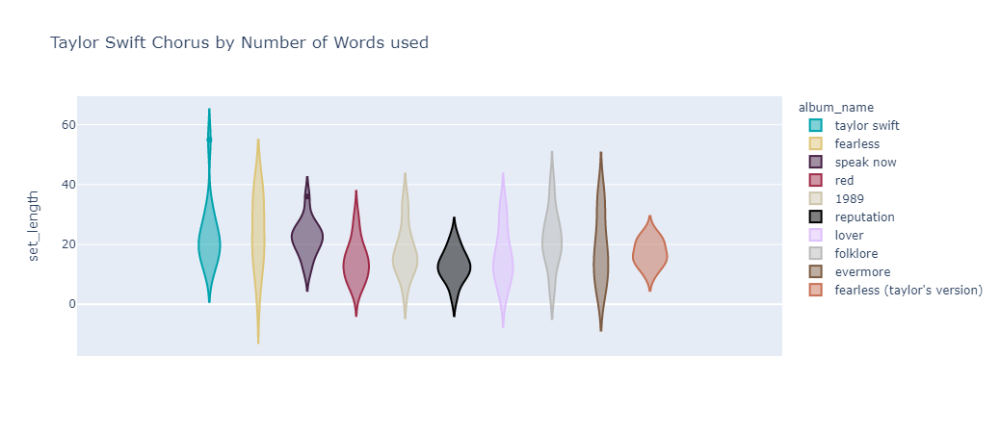

In [273]:
fig = px.violin(ts_lyrics_chorus_song, y="set_length", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Chorus by Number of Words used")
fig.show()

In [274]:
fig.write_html("ts_chorus_set_length.html",include_plotlyjs="cdn")

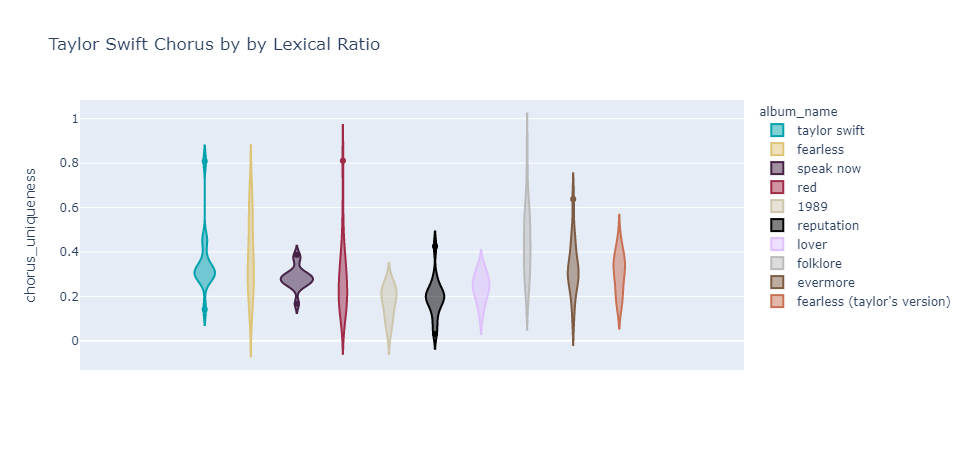

In [275]:
fig = px.violin(ts_lyrics_chorus_song, y="chorus_uniqueness", color="album_name",
                color_discrete_map=album_color_dictionary_all,
                violinmode='group',hover_data=['track_name']
                ,title="Taylor Swift Chorus by by Lexical Ratio")
fig.show()

In terms of chorus verbosities, `1989` and `Lover` have similar shapes. The chorus in the last albums have diverse verbosities. Finally, `All Too Well` from ` Red` and `champagne problems` from `evermore` are the outliers of their respective albums.

In [276]:
fig.write_html("ts_chorus_lyrics_ratio.html",include_plotlyjs="cdn")

In [456]:
ts_lyrics_ratio = pd.merge(ts_lyrics_song[['track_number','track_name','album_name','lexical_uniqueness',"set_length"]],ts_lyrics_chorus_song[['track_number','track_name','album_name','chorus_uniqueness']],on=['track_number','track_name','album_name'],how='inner')
ts_lyrics_ratio.head()

,track_number,track_name,album_name,lexical_uniqueness,set_length,chorus_uniqueness
0,1,tim mcgraw,taylor swift,0.456044,83,0.311828
1,2,picture to burn,taylor swift,0.438710,68,0.278351
2,3,teardrops on my guitar,taylor swift,0.666667,80,0.463415
3,4,a place in this world,taylor swift,0.597561,49,0.314286
4,5,cold as you,taylor swift,0.620000,62,0.444444


In [457]:
ts_lyrics_ratio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149 entries, 0 to 148
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   track_number        149 non-null    int64   
 1   track_name          149 non-null    object  
 2   album_name          149 non-null    category
 3   lexical_uniqueness  149 non-null    float64 
 4   set_length          149 non-null    int64   
 5   chorus_uniqueness   149 non-null    float64 
dtypes: category(1), float64(2), int64(2), object(1)
memory usage: 7.5+ KB


In [458]:
ts_lyrics_ratio[['track_number','track_name','album_name','lexical_uniqueness',"chorus_uniqueness"]].to_csv('ts_disco_all_lyric_ratio.csv',index=False)

Then, we graph their respective ratios across albums.

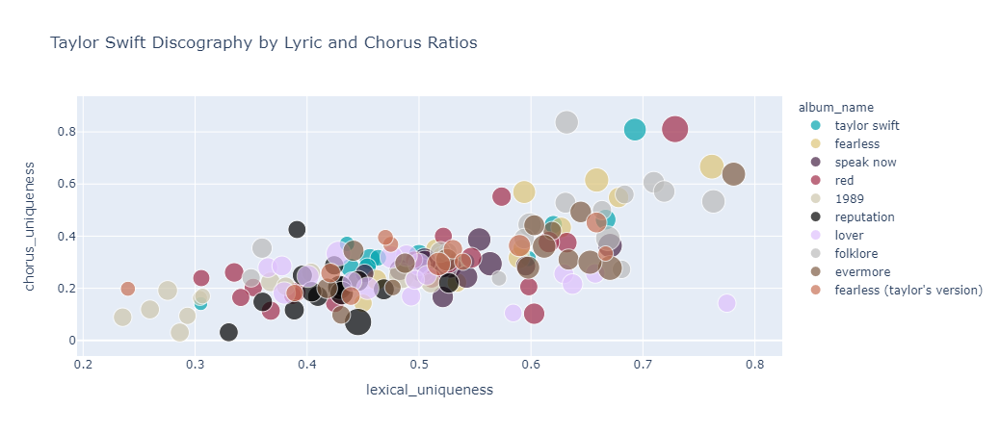

In [460]:
fig = px.scatter(ts_lyrics_ratio, x="lexical_uniqueness", y="chorus_uniqueness", size="set_length",color="album_name",hover_data=ts_lyrics_ratio.columns,color_discrete_map=album_color_dictionary_all,
             title="Taylor Swift Discography by Lyric and Chorus Ratios")
fig.update_traces(marker=dict(opacity=0.7),selector=dict(mode='markers'))
fig.show()

In [461]:
fig.write_html("ts_lyric_ratios_scatter.html",include_plotlyjs="cdn")

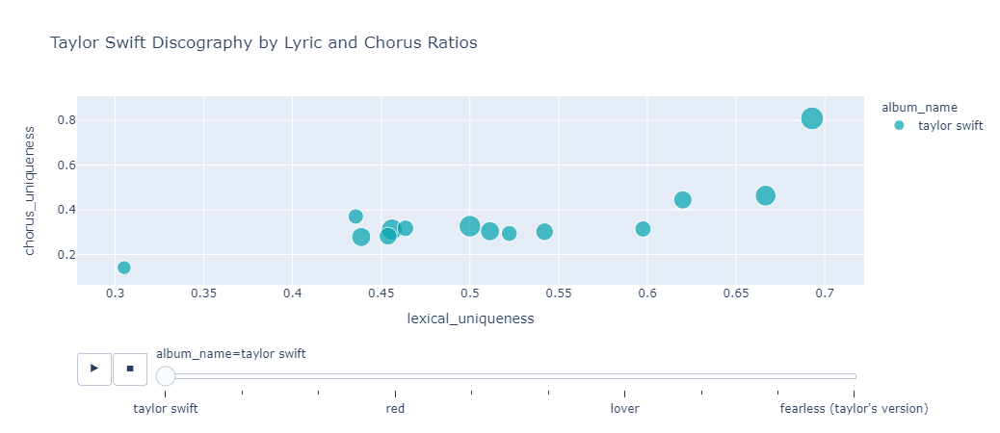

In [462]:
fig = px.scatter(ts_lyrics_ratio, x="lexical_uniqueness", y="chorus_uniqueness", size="set_length",color="album_name",hover_data=ts_lyrics_ratio.columns,color_discrete_map=album_color_dictionary_all,
             animation_group="track_name",animation_frame="album_name",title="Taylor Swift Discography by Lyric and Chorus Ratios")
fig.update_traces(marker=dict(opacity=0.7),selector=dict(mode='markers'))
fig.show()

In [463]:
fig.write_html("ts_lyric_ratios_move.html",include_plotlyjs="cdn")

To get the highest and lowest ratios for each album, `groupby` is used again.

In [284]:
def create_high_lyric(feature):
    ts_lyrics_highest = ts_lyrics_ratio[['album_name','track_name',feature]].loc[ts_lyrics_ratio[['album_name','track_name',feature]].groupby('album_name')[feature].idxmax()].sort_index()
    ts_lyrics_highest = ts_lyrics_highest.rename(columns={"track_name": "track_name_high"+ "_"+feature, feature: "highest_"+feature})
    ts_lyrics_highest.reset_index(inplace=True,drop=True)
    return ts_lyrics_highest[['album_name',"track_name_high"+"_"+feature,"highest_"+feature]]

In [285]:
def create_low_lyric(feature):
    ts_lyrics_lowest = ts_lyrics_ratio[['album_name','track_name',feature]].loc[ts_lyrics_ratio[['album_name','track_name',feature]].groupby('album_name')[feature].idxmin()].sort_index()
    ts_lyrics_lowest = ts_lyrics_lowest.rename(columns={"track_name": "track_name_low"+ "_"+feature, feature: "lowest_"+feature})
    ts_lyrics_lowest.reset_index(inplace=True,drop=True)
    return ts_lyrics_lowest[['album_name',"track_name_low"+"_"+feature,"lowest_"+feature]]

In [286]:
lyrics_ratio_features = ['lexical_uniqueness','chorus_uniqueness']
ts_lyric_range= pd.DataFrame(columns=['album_name'])
for feature in lyrics_ratio_features:
    ts_lyric_range = pd.merge(ts_lyric_range,create_high_lyric(feature),on='album_name',how='outer')
for feature in lyrics_ratio_features:
    ts_lyric_range = pd.merge(ts_lyric_range,create_low_lyric(feature),on='album_name',how='outer')

In [287]:
ts_lyric_range

,album_name,track_name_high_lexical_uniqueness,highest_lexical_uniqueness,track_name_high_chorus_uniqueness,highest_chorus_uniqueness,track_name_low_lexical_uniqueness,lowest_lexical_uniqueness,track_name_low_chorus_uniqueness,lowest_chorus_uniqueness
0,taylor swift,mary's song (oh my my my),0.692857,mary's song (oh my my my),0.808824,a perfectly good heart,0.305085,a perfectly good heart,0.141304
1,fearless,the best day,0.761589,the best day,0.666667,forever & always,0.443114,breathe,0.142857
2,speak now,dear john,0.670659,mine,0.387097,haunted,0.451389,mean,0.166667
3,red,all too well,0.728723,all too well,0.810811,the last time,0.305556,the lucky one,0.102564
4,1989,clean,0.510490,wildest dreams,0.260274,shake it off,0.235294,out of the woods,0.030534
5,reputation,this is why we can't have nice things,0.526667,new year's day,0.425532,look what you made me do,0.330049,look what you made me do,0.031250
6,lover,it's nice to have a friend,0.775000,miss americana & the heartbreak prince,0.333333,i think he knows,0.365000,soon you'll get better,0.105263
7,folklore,invisible string,0.762963,cardigan,0.836735,august,0.350000,epiphany,0.238095
8,evermore,champagne problems,0.781022,champagne problems,0.637931,willow,0.417989,marjorie,0.098039
9,fearless (taylor's version),don't you (from the vault),0.666667,you all over me (from the vault),0.452381,untouchable,0.240000,bye bye baby (from the vault),0.170455


In [288]:
ts_lyric_range.to_csv('ts_lyric_range_ratio.csv',index=False)

In [289]:
ts_lyric_eda = ts_lyrics_ratio.groupby('album_name')[lyrics_ratio_features].var()
ts_lyric_eda.reset_index(inplace=True)
ts_lyric_eda['album_name'] = pd.Categorical(ts_lyric_eda.album_name, categories=album_names_list_all[0:], ordered=True)
ts_lyric_eda = ts_lyric_eda.sort_values(by='album_name',ascending = True)
ts_lyric_eda.reset_index(inplace=True,drop=True)
ts_lyric_eda

,album_name,lexical_uniqueness,chorus_uniqueness
0,taylor swift,0.010733,0.022894
1,fearless,0.009160,0.028343
2,speak now,0.002836,0.002724
3,red,0.014971,0.028702
4,1989,0.008940,0.005005
5,reputation,0.002127,0.008455
6,lover,0.012460,0.003984
7,folklore,0.013983,0.025147
8,evermore,0.010971,0.017017
9,fearless (taylor's version),0.014073,0.007924


Based on the ratios, `reputation` has closest spread of lyric uniqueness while `Speak Now` has the closest spread of chorus uniquess.

In [290]:
ts_lyric_eda.to_csv('ts_lyric_album_var_ratio.csv',index=False)

In [291]:
ts_lyric_eda = ts_lyrics_ratio.groupby('album_name')[lyrics_ratio_features].mean()
ts_lyric_eda.reset_index(inplace=True)
ts_lyric_eda['album_name'] = pd.Categorical(ts_lyric_eda.album_name, categories=album_names_list_all[0:], ordered=True)
ts_lyric_eda = ts_lyric_eda.sort_values(by='album_name',ascending = True)
ts_lyric_eda.reset_index(inplace=True,drop=True)
ts_lyric_eda

,album_name,lexical_uniqueness,chorus_uniqueness
0,taylor swift,0.514686,0.354244
1,fearless,0.571145,0.384581
2,speak now,0.532155,0.283369
3,red,0.487124,0.287734
4,1989,0.354172,0.173283
5,reputation,0.418768,0.194980
6,lover,0.504927,0.239866
7,folklore,0.604381,0.446741
8,evermore,0.572839,0.331509
9,fearless (taylor's version),0.494661,0.305612


`folklore` has the highest mean ratios among all albums while `1989` has the lowest mean ratios.

In [292]:
ts_lyric_eda.to_csv('ts_lyric_album_mean_ratio.csv',index=False)

In [293]:
ts_sound.head()

,track_name,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
0,a perfectly good heart,taylor swift,0.477,0.735,-5.686,0.0346,0.00502,0.0,0.1280,0.326,156.035,e,major
1,tim mcgraw,taylor swift,0.546,0.506,-6.334,0.0269,0.56700,0.0,0.1220,0.390,152.175,c,major
2,tied together with a smile,taylor swift,0.464,0.591,-4.693,0.0286,0.51200,0.0,0.0944,0.207,146.172,d,major
3,teardrops on my guitar,taylor swift,0.617,0.422,-6.794,0.0239,0.30300,0.0,0.1230,0.264,99.966,a#,major
4,stay beautiful,taylor swift,0.590,0.643,-4.725,0.0243,0.09800,0.0,0.1360,0.508,131.646,g#,major


In [294]:
ts_lyrics_ratio.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness
0,1,tim mcgraw,taylor swift,0.456044,0.311828
1,2,picture to burn,taylor swift,0.438710,0.278351
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415
3,4,a place in this world,taylor swift,0.597561,0.314286
4,5,cold as you,taylor swift,0.620000,0.444444


# What makes a Track 5?

In this <font color=orange> notebook </font>, we will show a mini-classification project about the composition of a track 5 album.

## Exploring `lyrics_ratio` and `sound` dataset.

First, we combined both datasets. We saw that there were tracks from `Fearless` that are not included in the final dataset.

In [295]:
ts_lyric_sound_combined = pd.merge(ts_lyrics_ratio,ts_sound,on=['track_name','album_name'],how='inner')
ts_lyric_sound_combined.reset_index(inplace=True,drop=True)
ts_lyric_sound_combined.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,0.0,0.122,0.390,152.175,c,major
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,0.0,0.102,0.829,105.587,g,major
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,0.0,0.123,0.264,99.966,a#,major
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,0.0,0.317,0.386,115.012,a,major
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,0.0,0.112,0.350,175.662,f,major


In [296]:
ts_lyric_sound_combined.to_csv('ts_lyric_sound_dataset.csv',index=False)

In [297]:
ts_lyrics_ratio.shape,ts_sound.shape,ts_lyric_sound_combined.shape

((149, 5), (142, 13), (137, 16))

After that, we create a label when a track is number five or not. The `np.where` function is used.

In [298]:
ts_lyric_sound_combined['track_5'] = np.where(ts_lyric_sound_combined['track_number'] == 5, 1, 0)

We have added the ratios for our features and we will use them as our inputs.

In [299]:
new_features = numeric_features + ['lexical_uniqueness','chorus_uniqueness']
new_features_ex = numeric_features_ex + ['lexical_uniqueness','chorus_uniqueness']

In [300]:
ts_lyric_sound_standard = ts_lyric_sound_combined.copy()
ts_lyric_sound_standard.reset_index(inplace=True,drop=True)
ts_lyric_sound_standard[new_features] = StandardScaler().fit_transform(ts_lyric_sound_standard[new_features])
ts_lyric_sound_standard.reset_index(inplace=True,drop=True)
ts_lyric_sound_standard.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode,track_5
0,1,tim mcgraw,taylor swift,-0.431244,0.084569,-0.402943,-0.448713,0.313229,-0.535332,0.770021,-0.1474,-0.220532,-0.171128,0.889729,c,major,0
1,2,picture to burn,taylor swift,-0.575585,-0.142004,0.655819,1.523200,1.955368,-0.463273,-0.474178,-0.1474,-0.490171,2.106450,-0.642870,g,major,0
2,3,teardrops on my guitar,taylor swift,1.322588,1.110501,0.213222,-0.915307,0.137721,-0.585605,-0.037027,-0.1474,-0.207051,-0.824829,-0.827783,a#,major,0
3,4,a place in this world,taylor swift,0.747153,0.101203,-0.107878,1.078825,1.666163,-0.475004,-0.772236,-0.1474,2.408439,-0.191880,-0.332817,a,major,0
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,-0.1474,-0.355352,-0.378652,1.662377,f,major,1


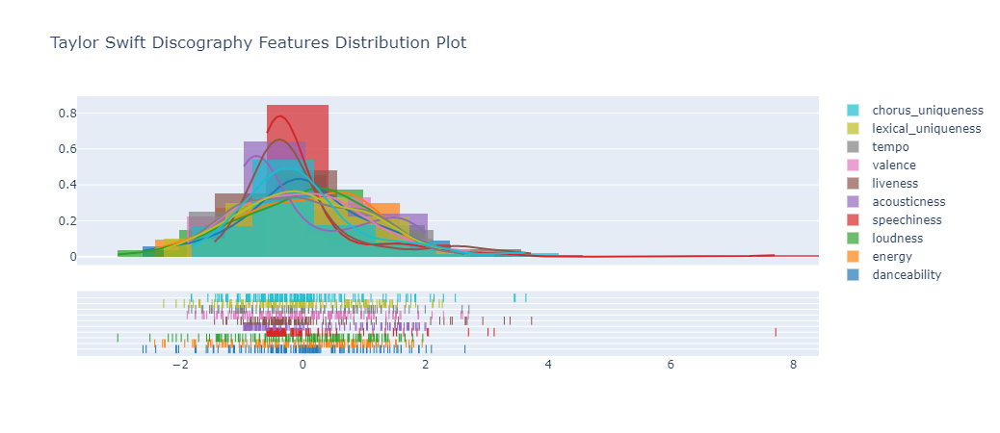

In [301]:
taylor_sonic_few = ts_lyric_sound_standard[new_features_ex]
fig = ff.create_distplot([taylor_sonic_few[c] for c in taylor_sonic_few.columns], taylor_sonic_few.columns)
fig.update_layout(title_text='Taylor Swift Discography Features Distribution Plot')
fig.show()

In [302]:
fig.write_html("ts_combi_distribution.html",include_plotlyjs="cdn")

In [303]:
taylor_sonic_few.kurt()

danceability           0.154814
energy                -0.589202
loudness              -0.187951
speechiness           26.180554
acousticness          -1.085982
liveness               3.368843
valence               -0.188798
tempo                 -0.619277
lexical_uniqueness    -0.543914
chorus_uniqueness      2.282535
dtype: float64

In [304]:
taylor_sonic_few.skew()

danceability         -0.098746
energy               -0.335882
loudness             -0.438231
speechiness           4.287802
acousticness          0.718809
liveness              1.912450
valence               0.413851
tempo                 0.253212
lexical_uniqueness    0.072048
chorus_uniqueness     1.276697
dtype: float64

We see that everything else is `platykurtic` except `speechiness` and `liveness`.

We have created a heatmap for these features. It seems that the lyric ratios are positively associated with `acousticness`.

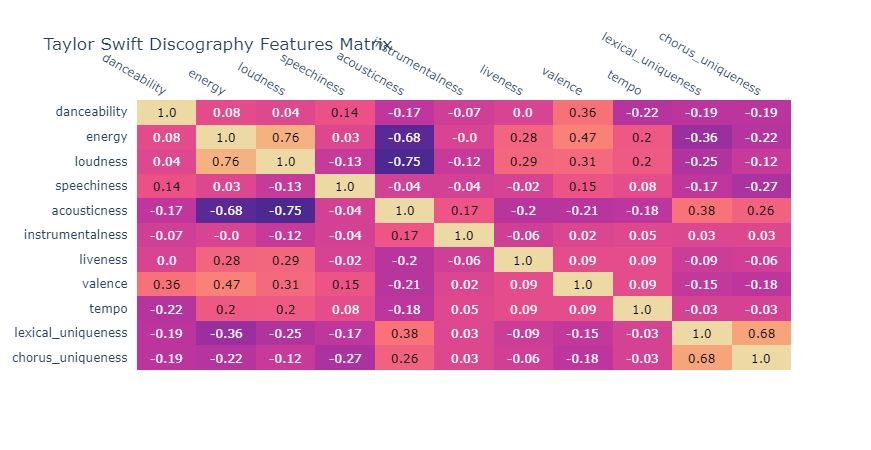

In [305]:
corr = ts_lyric_sound_standard[new_features].corr()
corr_values = np.flipud(corr.to_numpy())
corr_values_text = np.around(corr_values, decimals=2)
x = new_features
y = new_features[::-1]
fig = ff.create_annotated_heatmap(corr_values, x=x, y=y, annotation_text=corr_values_text,colorscale='Agsunset')
fig.update_layout(title_text='Taylor Swift Discography Features Matrix')
fig.show()

In [306]:
fig.write_html("ts_combi_heatmap.html",include_plotlyjs="cdn")

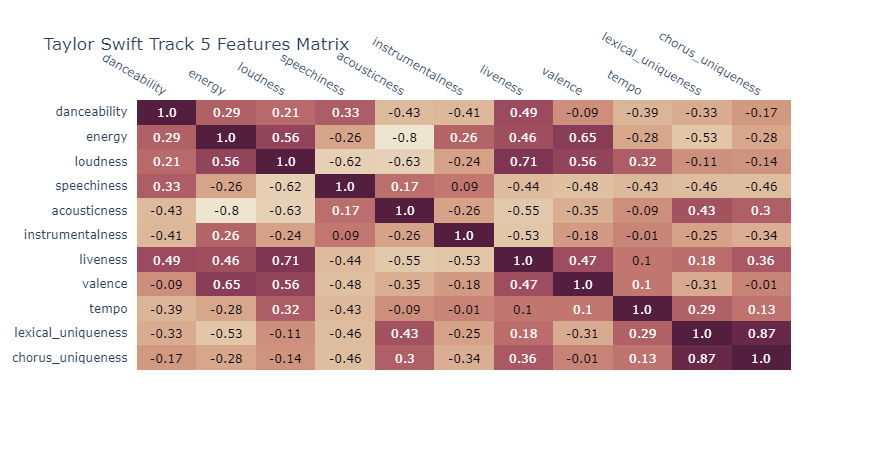

In [307]:
corr = ts_lyric_sound_standard[ts_lyric_sound_standard['track_5'] == 1][new_features].corr()
corr_values = np.flipud(corr.to_numpy())
corr_values_text = np.around(corr_values, decimals=2)
x = new_features
y = new_features[::-1]
fig = ff.create_annotated_heatmap(corr_values, x=x, y=y, annotation_text=corr_values_text,colorscale='Brwnyl')
fig.update_layout(title_text='Taylor Swift Track 5 Features Matrix')
fig.show()

In [308]:
fig.write_html("ts_combi_heatmap_track5.html",include_plotlyjs="cdn")

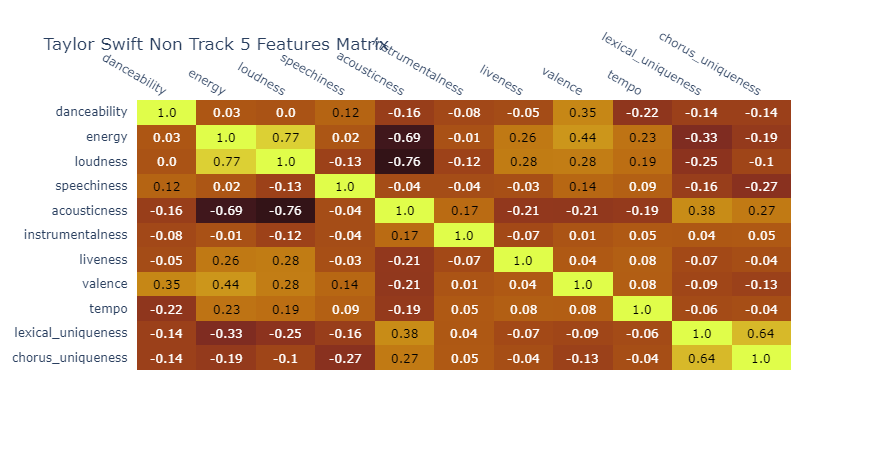

In [309]:
corr = ts_lyric_sound_standard[ts_lyric_sound_standard['track_5'] == 0][new_features].corr()
corr_values = np.flipud(corr.to_numpy())
corr_values_text = np.around(corr_values, decimals=2)
x = new_features
y = new_features[::-1]
fig = ff.create_annotated_heatmap(corr_values, x=x, y=y, annotation_text=corr_values_text,colorscale='solar')
fig.update_layout(title_text='Taylor Swift Non Track 5 Features Matrix')
fig.show()

In [310]:
fig.write_html("ts_combi_heatmap_notrack5.html",include_plotlyjs="cdn")

In [311]:
ts_lyric_sound_standard['track_5'].value_counts()

0    128
1      9
Name: track_5, dtype: int64

For our dataset, we have 9 rows out of 137. Hence, we have an imbalanced dataset. The next function can handle the imbalances in our dataset.

## Importing and using the `h2o` package

[H2o package](https://www.h2o.ai/) is an open source model building and optimization. We will use it to run a classification model and find the most important features.

In [313]:
import h2o
from h2o.estimators import H2ORandomForestEstimator

In [314]:
h2o.init()

/opt/conda/lib/python3.8/site-packages/h2o/backend/connection.py:368: UserWarning:

Proxy is defined in the environment: http_proxy. This may interfere with your H2O Connection.



Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_231"; Java(TM) SE Runtime Environment (build 1.8.0_231-b11); Java HotSpot(TM) 64-Bit Server VM (build 25.231-b11, mixed mode)
  Starting server from /opt/conda/lib/python3.8/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpvpt04dgy
  JVM stdout: /tmp/tmpvpt04dgy/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpvpt04dgy/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.1
H2O_cluster_version_age:,26 days
H2O_cluster_name:,H2O_from_python_unknownUser_8alwou
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,14.22 Gb
H2O_cluster_total_cores:,10
H2O_cluster_allowed_cores:,10
H2O_cluster_status:,"accepting new members, healthy"


In [315]:
new_features_labels = new_features + ['track_5']
ts_lyric_sound_hf = ts_lyric_sound_standard[new_features_labels]
ts_lyric_sound_hf.reset_index(inplace=True,drop=True)
ts_lyric_sound_hf['index'] = ts_lyric_sound_hf.index
ts_lyric_sound_hf.reset_index(inplace=True,drop=True)
ts_lyric_sound_hf.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,chorus_uniqueness,track_5,index
0,-0.402943,-0.448713,0.313229,-0.535332,0.770021,-0.1474,-0.220532,-0.171128,0.889729,-0.431244,0.084569,0,0
1,0.655819,1.523200,1.955368,-0.463273,-0.474178,-0.1474,-0.490171,2.106450,-0.642870,-0.575585,-0.142004,0,1
2,0.213222,-0.915307,0.137721,-0.585605,-0.037027,-0.1474,-0.207051,-0.824829,-0.827783,1.322588,1.110501,0,2
3,-0.107878,1.078825,1.666163,-0.475004,-0.772236,-0.1474,2.408439,-0.191880,-0.332817,0.747153,0.101203,0,3
4,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,-0.1474,-0.355352,-0.378652,1.662377,0.934000,0.982111,1,4


Since our dataset is in `pandas` dataframe form, we will convert it to an `h2oframe` and we have to convert our label into a factor by using `asfactor` function.

In [316]:
ts_lyric_sound_hf = h2o.H2OFrame(ts_lyric_sound_hf)
ts_lyric_sound_hf['track_5'] = ts_lyric_sound_hf['track_5'].asfactor()

Parse progress: |█████████████████████████████████████████████████████████| 100%


To separate the training and testing dataset, we have used the first *97* rows as training and the rest as the testing dataset. Hence, we will test it on albums like `folklore` and `evermore`.

In [317]:
ts_df_train = ts_lyric_sound_hf[ts_lyric_sound_hf['index'] < 97]
ts_df_test = ts_lyric_sound_hf[ts_lyric_sound_hf['index'] >= 97]

In [318]:
ts_df_train

danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,chorus_uniqueness,track_5,index
-0.402943,-0.448713,0.313229,-0.535332,0.770021,-0.1474,-0.220532,-0.171128,0.889729,-0.431244,0.0845693,0,0
0.655819,1.5232,1.95537,-0.463273,-0.474178,-0.1474,-0.490171,2.10645,-0.64287,-0.575585,-0.142004,0,1
0.213222,-0.915307,0.137721,-0.585605,-0.0370273,-0.1474,-0.207051,-0.824829,-0.827783,1.32259,1.1105,0,2
-0.107878,1.07883,1.66616,-0.475004,-0.772236,-0.1474,2.40844,-0.19188,-0.332817,0.747153,0.101203,0,3
-1.54849,-0.543143,0.573819,-0.565496,-0.131794,-0.1474,-0.355352,-0.378652,1.66238,0.934,0.982111,1,4
-0.116556,1.2288,1.20832,-0.525277,-0.951131,-0.1474,1.35685,0.959879,-0.399697,0.119815,-0.0352933,0,5
-1.11457,0.0234351,0.939333,-0.506843,0.601886,-0.1474,-0.592633,-1.12055,0.692249,-0.368023,0.122689,0,6
-0.0210941,0.312279,0.927123,-0.578902,-0.663712,-0.1474,-0.0317858,0.441068,0.214389,0.0286854,0.0339441,0,7
-1.02779,1.03439,1.3327,-0.471652,-0.928754,-0.1474,1.55908,0.228356,1.40947,-0.449545,-0.116958,0,8
-0.845539,0.267841,0.732539,-0.518574,-0.879231,-0.1474,0.588382,-0.0984945,0.844561,1.54067,3.44821,0,9


In [319]:
ts_df_test

danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,chorus_uniqueness,track_5,index
1.03767,0.806646,0.152983,0.0679485,0.42458,-0.1474,2.4354,-0.570612,-1.02171,-0.158787,0.173717,0,97
0.890135,0.684443,0.19686,-0.148227,-0.888096,-0.142423,-0.0722315,0.695286,1.07889,-0.271338,0.139877,0,98
-1.3836,-2.24843,-2.06452,0.0880579,1.8094,-0.1474,-0.207051,-0.0102967,2.70896,0.635551,-1.31345,0,99
1.27198,-1.48188,-1.41438,3.01899,1.28665,-0.140365,-0.368833,-0.373464,-1.48559,-0.562746,-0.49762,0,100
1.54969,0.46781,0.586792,-0.0594106,-0.934899,-0.1474,-1.00653,1.50982,-1.31926,1.07636,-0.562526,0,101
1.41952,-0.76533,-0.607041,-0.409648,-0.565888,-0.1474,-0.328388,-0.124435,-0.464438,-0.00658682,-0.333879,0,102
0.152473,1.35101,1.16368,-0.0292466,-0.862417,-0.1474,-0.27446,1.58245,1.87621,-1.08485,-0.0921668,0,103
1.25463,-2.28731,-1.05191,-0.314129,2.00505,-0.131272,0.440081,0.633028,-1.81331,2.22467,-1.05902,0,104
-0.30748,-0.50426,-0.933637,-0.0426528,1.50676,-0.139121,-0.824522,-0.819641,0.817619,-0.89058,-0.362557,0,105
1.60176,-1.27636,0.0812537,-0.11136,1.35085,-0.147052,-0.409279,-1.30213,0.48536,1.02367,1.54965,0,106


In [320]:
predictor = new_features
response = "track_5"

Finally, we run the model. The `H2ORandomForestEstimator` will be used. For details on the distributed random forest, please check this [link](http://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-science/drf.html). Since the dataset is imbalanced, we turned on the `balance_classes` parameter. It over-samples the dataset to balance the distribution.

In [321]:
ts_model = H2ORandomForestEstimator(ntrees=50, max_depth=20, nfolds=10,balance_classes = True,seed=42)
ts_model.train(x = predictor, y = response, training_frame = ts_df_train)

drf Model Build progress: |███████████████████████████████████████████████| 100%


From training, we test it on our later rows.

In [322]:
performance = ts_model.model_performance(test_data=ts_df_test)

If we look at the over-sampled training dataset, the confusion matrix should be a diagonal one.

In [323]:
ts_model.confusion_matrix()


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9543003867398757: 


,,0,1,Error,Rate
0,0,90.0,0.0,0.0,(0.0/90.0)
1,1,0.0,89.0,0.0,(0.0/89.0)
2,Total,90.0,89.0,0.0,(0.0/179.0)


As for our most important variable, `valence` has the highest percentage of relevance followed by liveness. Well, it does make sense since track 5 is her most emotionally vulnarable track among other tracks.

In [324]:
model_var_importance = ts_model.varimp(use_pandas=True)
model_var_importance

,variable,relative_importance,scaled_importance,percentage
0,valence,296.996582,1.000000,0.186562
1,liveness,229.509781,0.772769,0.144170
2,loudness,184.438065,0.621011,0.115857
3,lexical_uniqueness,181.303238,0.610456,0.113888
4,danceability,157.852570,0.531496,0.099157
5,tempo,141.464050,0.476315,0.088863
6,acousticness,116.092743,0.390889,0.072925
7,energy,97.059280,0.326803,0.060969
8,chorus_uniqueness,88.118973,0.296700,0.055353
9,speechiness,62.637508,0.210903,0.039347


To graph the soring history for our trained dataset, we use `plotly`.

In [325]:
ts_scoring_history_train = ts_model.score_history()
ts_scoring_history_train = ts_scoring_history_train.iloc[1:,:]
ts_scoring_history_train.reset_index(inplace=True,drop=True)
ts_scoring_history_train.head(10)

,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2021-04-21 08:52:42,2.475 sec,1.0,0.303822,3.188195,0.921053,0.818182,1.645557,0.092308
1,,2021-04-21 08:52:42,2.482 sec,2.0,0.259536,2.325453,0.936364,0.875000,1.759831,0.067308
2,,2021-04-21 08:52:42,2.487 sec,3.0,0.124599,0.528769,0.984848,0.970588,1.952082,0.015152
3,,2021-04-21 08:52:42,2.493 sec,4.0,0.116126,0.459187,0.987500,0.972973,1.956878,0.013158
4,,2021-04-21 08:52:42,2.498 sec,5.0,0.109197,0.244185,0.992964,0.985259,1.981218,0.006250
5,,2021-04-21 08:52:42,2.503 sec,6.0,0.130321,0.435241,0.986555,0.973256,1.956878,0.011834
6,,2021-04-21 08:52:42,2.508 sec,7.0,0.101489,0.226462,0.993375,0.986801,1.984419,0.005814
7,,2021-04-21 08:52:42,2.513 sec,8.0,0.054867,0.021775,1.000000,1.000000,2.011236,0.000000
8,,2021-04-21 08:52:42,2.518 sec,9.0,0.048343,0.019330,1.000000,1.000000,2.011236,0.000000
9,,2021-04-21 08:52:42,2.524 sec,10.0,0.046339,0.018719,1.000000,1.000000,2.011236,0.000000


In [326]:
ts_scoring_history_train.tail(10)

,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error
40,,2021-04-21 08:52:42,2.689 sec,41.0,0.020800,0.008501,1.0,1.0,2.011236,0.0
41,,2021-04-21 08:52:42,2.694 sec,42.0,0.020666,0.008459,1.0,1.0,2.011236,0.0
42,,2021-04-21 08:52:42,2.699 sec,43.0,0.020954,0.008539,1.0,1.0,2.011236,0.0
43,,2021-04-21 08:52:42,2.705 sec,44.0,0.020282,0.008398,1.0,1.0,2.011236,0.0
44,,2021-04-21 08:52:42,2.710 sec,45.0,0.020201,0.008316,1.0,1.0,2.011236,0.0
45,,2021-04-21 08:52:42,2.715 sec,46.0,0.019026,0.008044,1.0,1.0,2.011236,0.0
46,,2021-04-21 08:52:42,2.721 sec,47.0,0.018861,0.007981,1.0,1.0,2.011236,0.0
47,,2021-04-21 08:52:42,2.727 sec,48.0,0.018376,0.007984,1.0,1.0,2.011236,0.0
48,,2021-04-21 08:52:42,2.733 sec,49.0,0.018191,0.007993,1.0,1.0,2.011236,0.0
49,,2021-04-21 08:52:42,2.739 sec,50.0,0.018510,0.008043,1.0,1.0,2.011236,0.0


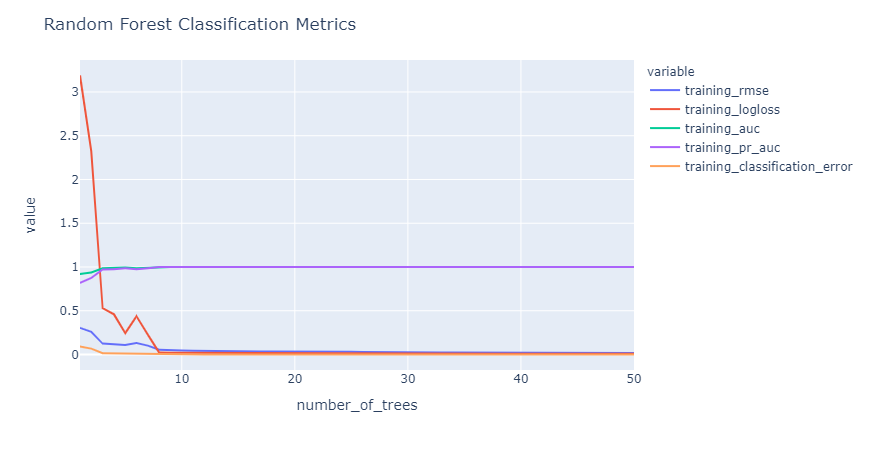

In [327]:
fig = px.line(ts_scoring_history_train, x='number_of_trees', y=['training_rmse', 'training_logloss','training_auc','training_pr_auc','training_classification_error'])
fig.update_layout(title_text='Random Forest Classification Metrics')
fig.show()

In [328]:
fig.write_html("ts_scoring_history.html",include_plotlyjs="cdn")

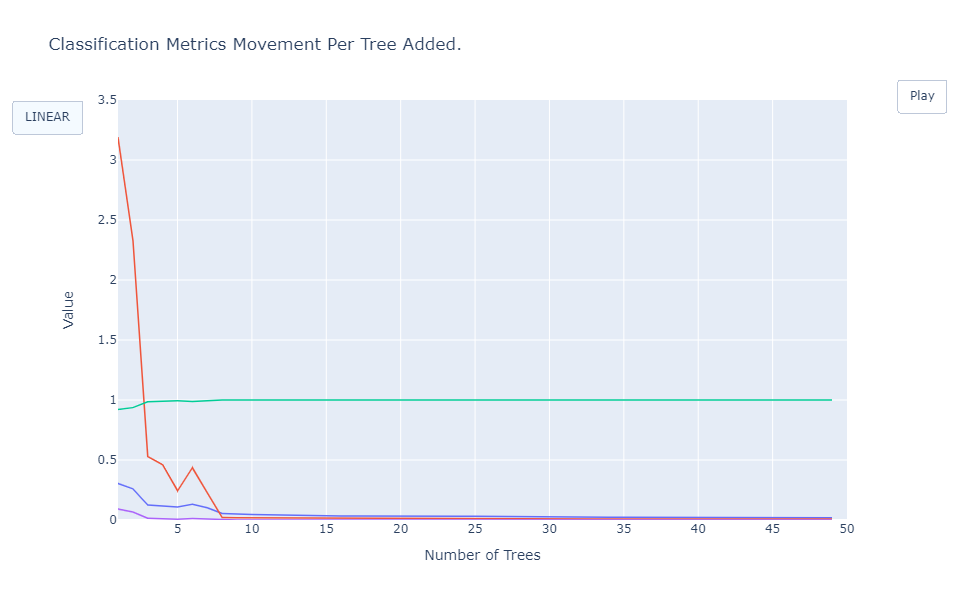

In [329]:
import plotly.graph_objects as go

trace1 = go.Scatter(x=ts_scoring_history_train['number_of_trees'][:2],
                    y=ts_scoring_history_train['training_rmse'][:2],
                    name = "Root Mean Squared Error",
                    mode='lines',
                    line=dict(width=1.5))
trace2 = go.Scatter(x = ts_scoring_history_train['number_of_trees'][:2],
                    y = ts_scoring_history_train['training_logloss'][:2],
                    name = "Log-Loss",
                    mode='lines',
                    line=dict(width=1.5))
trace3 = go.Scatter(x = ts_scoring_history_train['number_of_trees'][:2],
                    y = ts_scoring_history_train['training_auc'][:2],
                    name = "Area Under ROC Curve",
                    mode='lines',
                    line=dict(width=1.5))
trace4 = go.Scatter(x = ts_scoring_history_train['number_of_trees'][:2],
                    y = ts_scoring_history_train['training_classification_error'][:2],
                    name = "Classification Error",
                    mode='lines',
                    line=dict(width=1.5))
frames = [dict(data= [dict(type='scatter',
                           x=ts_scoring_history_train['number_of_trees'][:k+1],
                           y=ts_scoring_history_train['training_rmse']),
                      dict(type='scatter',
                           x=ts_scoring_history_train['number_of_trees'][:k+1],
                           y=ts_scoring_history_train['training_logloss'][:k+1]),
                      dict(type='scatter',
                           x=ts_scoring_history_train['number_of_trees'],
                           y=ts_scoring_history_train['training_auc'][:k+1]),
                      dict(type='scatter',
                           x=ts_scoring_history_train['number_of_trees'],
                           y=ts_scoring_history_train['training_classification_error'][:k+1]),
                     ],
               traces= [0, 1, 2, 3],  
              )for k  in  range(1, len(ts_scoring_history_train)-1)]
layout = go.Layout(width=700,
                   height=600,
                   showlegend=False,
                   hovermode='x unified',
                   updatemenus=[
                        dict(
                            type='buttons', showactive=False,
                            y=1.05,
                            x=1.15,
                            xanchor='right',
                            yanchor='top',
                            pad=dict(t=0, r=10),
                            buttons=[dict(label='Play',
                            method='animate',
                            args=[None, 
                                  dict(frame=dict(duration=3, 
                                                  redraw=False),
                                                  transition=dict(duration=0),
                                                  fromcurrent=True,
                                                  mode='immediate')]
                            )]
                        ),
                        dict(
                            type = "buttons",
                            direction = "left",
                            buttons=list([
                                dict(
                                    args=[{"yaxis.type": "linear"}],
                                    label="LINEAR",
                                    method="relayout"
                                )
                            ]),
                        ),
                    ]              
                  )
layout.update(xaxis =dict(range=[1, 50], autorange=False),
              yaxis =dict(range=[0, 3.5], autorange=False),
             title="Classification Metrics Movement Per Tree Added.",
              xaxis_title="Number of Trees",
              yaxis_title="Value");
fig = go.Figure(data=[trace1, trace2, trace3, trace4], frames=frames, layout=layout)
fig.show()

In [330]:
fig.write_html("ts_scoring_history_move.html",include_plotlyjs="cdn")

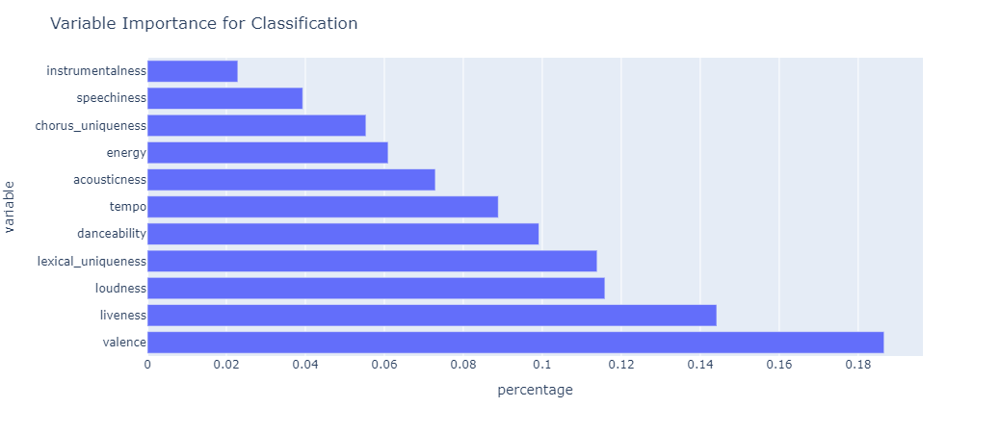

In [331]:
fig = px.bar(model_var_importance, x="percentage", y="variable", orientation='h')
fig.update_layout(title_text='Variable Importance for Classification')
fig.show()

`Valence` is the most important feature in our classification.

In [332]:
fig.write_html("ts_variable_importance.html",include_plotlyjs="cdn")

In [333]:
ts_model

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_model_python_1618995133778_1


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,50.0,9680.0,4.0,12.0,7.02,9.0,13.0,10.7




ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.0003426075333146184
RMSE: 0.018509660540231915
LogLoss: 0.008043476992009442
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9543003867398757: 


,,0,1,Error,Rate
0,0,90.0,0.0,0.0,(0.0/90.0)
1,1,0.0,89.0,0.0,(0.0/89.0)
2,Total,90.0,89.0,0.0,(0.0/179.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.9543,1.000000,9.0
1,max f2,0.9543,1.000000,9.0
2,max f0point5,0.9543,1.000000,9.0
3,max accuracy,0.9543,1.000000,9.0
4,max precision,1.0000,1.000000,0.0
5,max recall,0.9543,1.000000,9.0
6,max specificity,1.0000,1.000000,0.0
7,max absolute_mcc,0.9543,1.000000,9.0
8,max min_per_class_accuracy,0.9543,1.000000,9.0
9,max mean_per_class_accuracy,0.9543,1.000000,9.0



Gains/Lift Table: Avg response rate: 49.72 %, avg score: 50.09 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.430168,1.000000,2.011236,2.011236,1.000000,1.000000,1.000000,1.000000,0.865169,0.865169,101.123596,101.123596,0.865169
1,2,0.502793,0.099190,1.856525,1.988889,0.923077,0.901650,0.988889,0.985794,0.134831,1.000000,85.652550,98.888889,0.988889
2,3,0.597765,0.016825,0.000000,1.672897,0.000000,0.039749,0.831776,0.835488,0.000000,1.000000,-100.000000,67.289720,0.800000
3,4,0.703911,0.005587,0.000000,1.420635,0.000000,0.011085,0.706349,0.711173,0.000000,1.000000,-100.000000,42.063492,0.588889
4,5,1.000000,0.000000,0.000000,1.000000,0.000000,0.000839,0.497207,0.500851,0.000000,1.000000,-100.000000,0.000000,0.000000




ModelMetricsBinomial: drf
** Reported on cross-validation data. **

MSE: 0.07136215614417644
RMSE: 0.2671369613965399
LogLoss: 1.2980436874781924
Mean Per-Class Error: 0.46190476190476193
AUC: 0.423015873015873
AUCPR: 0.06338080145824602
Gini: -0.15396825396825398

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0444791260241904: 


,,0,1,Error,Rate
0,0,84.0,6.0,0.0667,(6.0/90.0)
1,1,6.0,1.0,0.8571,(6.0/7.0)
2,Total,90.0,7.0,0.1237,(12.0/97.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.044479,0.142857,5.0
1,max f2,0.000000,0.280000,45.0
2,max f0point5,0.044479,0.142857,5.0
3,max accuracy,0.084913,0.917526,0.0
4,max precision,0.044479,0.142857,5.0
5,max recall,0.000000,1.000000,45.0
6,max specificity,0.084913,0.988889,0.0
7,max absolute_mcc,0.001548,0.164630,42.0
8,max min_per_class_accuracy,0.001117,0.377778,43.0
9,max mean_per_class_accuracy,0.044479,0.538095,5.0



Gains/Lift Table: Avg response rate:  7.22 %, avg score:  0.97 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010309,0.062391,0.000000,0.000000,0.000000,0.084913,0.000000,0.084913,0.000000,0.000000,-100.000000,-100.000000,-0.011111
1,2,0.020619,0.056725,0.000000,0.000000,0.000000,0.061453,0.000000,0.073183,0.000000,0.000000,-100.000000,-100.000000,-0.022222
2,3,0.030928,0.047552,0.000000,0.000000,0.000000,0.056314,0.000000,0.067560,0.000000,0.000000,-100.000000,-100.000000,-0.033333
3,4,0.041237,0.045904,0.000000,0.000000,0.000000,0.046358,0.000000,0.062259,0.000000,0.000000,-100.000000,-100.000000,-0.044444
4,5,0.051546,0.044747,0.000000,0.000000,0.000000,0.045818,0.000000,0.058971,0.000000,0.000000,-100.000000,-100.000000,-0.055556
5,6,0.103093,0.032412,2.771429,1.385714,0.200000,0.040602,0.100000,0.049786,0.142857,0.142857,177.142857,38.571429,0.042857
6,7,0.154639,0.019991,0.000000,0.923810,0.000000,0.026836,0.066667,0.042136,0.000000,0.142857,-100.000000,-7.619048,-0.012698
7,8,0.206186,0.016194,0.000000,0.692857,0.000000,0.018139,0.050000,0.036137,0.000000,0.142857,-100.000000,-30.714286,-0.068254
8,9,0.298969,0.007735,1.539683,0.955665,0.111111,0.012482,0.068966,0.028796,0.142857,0.285714,53.968254,-4.433498,-0.014286
9,10,0.432990,0.003588,0.000000,0.659864,0.000000,0.005051,0.047619,0.021446,0.000000,0.285714,-100.000000,-34.013605,-0.158730




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid,cv_6_valid,cv_7_valid,cv_8_valid,cv_9_valid,cv_10_valid
0,accuracy,0.23015152,0.3736708,0.8333333,0.65,0.0,0.8181818,0.0,0.0,0.0,0.0,0.0,0.0
1,auc,0.19004011,0.32134572,0.8636364,0.57843137,0.0,0.45833334,0.0,0.0,0.0,0.0,0.0,0.0
2,aucpr,0.29206678,0.1714574,0.22534692,0.16399874,NaN,0.48685464,NaN,NaN,NaN,NaN,NaN,NaN
3,err,0.079314806,0.116418004,0.16666667,0.35,0.0029965471,0.18181819,0.009418472,0.017124297,0.0076649347,0.018976143,0.018578317,0.01990449
4,err_count,3.6666667,2.8867514,2.0,7.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN
5,f0point5,0.13880958,0.24655116,0.3846154,0.2857143,3.146521E-5,0.71428573,2.9054715E-4,5.952885E-4,1.3892783E-4,9.5656846E-4,5.9681846E-4,8.707447E-4
6,f1,0.13636364,0.22268088,0.5,0.36363637,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0
7,f2,-Infinity,NaN,0.71428573,0.5,-Infinity,0.3846154,-Infinity,-Infinity,-Infinity,-Infinity,-Infinity,-Infinity
8,lift_top_group,0.38103735,1.1545095,0.0,0.0,0.0056093857,3.6666667,0.017045444,0.024398535,0.011786765,0.03092844,0.024429867,0.029508384
9,logloss,0.93872994,2.1614008,0.2723496,2.40786,None,6.70709,None,None,None,None,None,None



See the whole table with table.as_data_frame()

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2021-04-21 08:52:42,2.464 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2021-04-21 08:52:42,2.475 sec,1.0,0.303822,3.188195,0.921053,0.818182,1.645557,0.092308
2,,2021-04-21 08:52:42,2.482 sec,2.0,0.259536,2.325453,0.936364,0.875000,1.759831,0.067308
3,,2021-04-21 08:52:42,2.487 sec,3.0,0.124599,0.528769,0.984848,0.970588,1.952082,0.015152
4,,2021-04-21 08:52:42,2.493 sec,4.0,0.116126,0.459187,0.987500,0.972973,1.956878,0.013158
5,,2021-04-21 08:52:42,2.498 sec,5.0,0.109197,0.244185,0.992964,0.985259,1.981218,0.006250
6,,2021-04-21 08:52:42,2.503 sec,6.0,0.130321,0.435241,0.986555,0.973256,1.956878,0.011834
7,,2021-04-21 08:52:42,2.508 sec,7.0,0.101489,0.226462,0.993375,0.986801,1.984419,0.005814
8,,2021-04-21 08:52:42,2.513 sec,8.0,0.054867,0.021775,1.000000,1.000000,2.011236,0.000000
9,,2021-04-21 08:52:42,2.518 sec,9.0,0.048343,0.019330,1.000000,1.000000,2.011236,0.000000



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,valence,296.996582,1.000000,0.186562
1,liveness,229.509781,0.772769,0.144170
2,loudness,184.438065,0.621011,0.115857
3,lexical_uniqueness,181.303238,0.610456,0.113888
4,danceability,157.852570,0.531496,0.099157
5,tempo,141.464050,0.476315,0.088863
6,acousticness,116.092743,0.390889,0.072925
7,energy,97.059280,0.326803,0.060969
8,chorus_uniqueness,88.118973,0.296700,0.055353
9,speechiness,62.637508,0.210903,0.039347


In [334]:
performance


ModelMetricsBinomial: drf
** Reported on test data. **

MSE: 0.04613435474160557
RMSE: 0.21478909362815787
LogLoss: 0.16967032307943591
Mean Per-Class Error: 0.026315789473684292
AUC: 0.9671052631578947
AUCPR: 0.40342640972002736
Gini: 0.9342105263157894

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.04219561336614303: 


,,0,1,Error,Rate
0,0,36.0,2.0,0.0526,(2.0/38.0)
1,1,0.0,2.0,0.0,(0.0/2.0)
2,Total,36.0,4.0,0.05,(2.0/40.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.042196,0.666667,2.0
1,max f2,0.042196,0.833333,2.0
2,max f0point5,0.042196,0.555556,2.0
3,max accuracy,0.042367,0.950000,1.0
4,max precision,0.042367,0.500000,1.0
5,max recall,0.042196,1.000000,2.0
6,max specificity,0.062562,0.973684,0.0
7,max absolute_mcc,0.042196,0.688247,2.0
8,max min_per_class_accuracy,0.042196,0.947368,2.0
9,max mean_per_class_accuracy,0.042196,0.973684,2.0



Gains/Lift Table: Avg response rate:  5.00 %, avg score:  1.35 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.025,0.054686,0.0,0.000000,0.0,0.062562,0.000000,0.062562,0.0,0.0,-100.0,-100.000000,-0.026316
1,2,0.025,0.046810,0.0,0.000000,0.0,0.000000,0.000000,0.062562,0.0,0.0,-100.0,-100.000000,-0.026316
2,3,0.050,0.042338,20.0,10.000000,1.0,0.042367,0.500000,0.052464,0.5,0.5,1900.0,900.000000,0.473684
3,4,0.050,0.042271,0.0,10.000000,0.0,0.000000,0.500000,0.052464,0.0,0.5,-100.0,900.000000,0.473684
4,5,0.050,0.042204,0.0,10.000000,0.0,0.000000,0.500000,0.052464,0.0,0.5,-100.0,900.000000,0.473684
5,6,0.100,0.026031,10.0,10.000000,0.5,0.042196,0.500000,0.047330,0.5,1.0,900.0,900.000000,0.947368
6,7,0.150,0.024128,0.0,6.666667,0.0,0.024235,0.333333,0.039632,0.0,1.0,-100.0,566.666667,0.894737
7,8,0.200,0.017918,0.0,5.000000,0.0,0.022906,0.250000,0.035450,0.0,1.0,-100.0,400.000000,0.842105
8,9,0.375,0.014760,0.0,2.666667,0.0,0.015708,0.133333,0.026237,0.0,1.0,-100.0,166.666667,0.657895
9,10,0.425,0.012642,0.0,2.352941,0.0,0.012642,0.117647,0.024638,0.0,1.0,-100.0,135.294118,0.605263


PartialDependencePlot progress: |█████████████████████████████████████████| 100%


/opt/conda/lib/python3.8/site-packages/h2o/model/model_base.py:1383: MatplotlibDeprecationWarning:

Since 3.2, the parameter *where* must have the same size as [-1.885277971397398 -1.6440583767882269 -1.402838782179056
 -1.161619187569885 -0.9203995929607139 -0.679179998351543
 -0.4379604037423719 -0.19674080913320102 0.04447878547597006
 0.28569838008514115 0.526917974694312 0.7681375693034829
 1.0093571639126542 1.250576758521825 1.491796353130996 1.7330159477401672
 1.974235542349338 2.2154551369585094 2.4566747315676802 2.697894326176851] in fill_betweenx(). This will become an error two minor releases later.



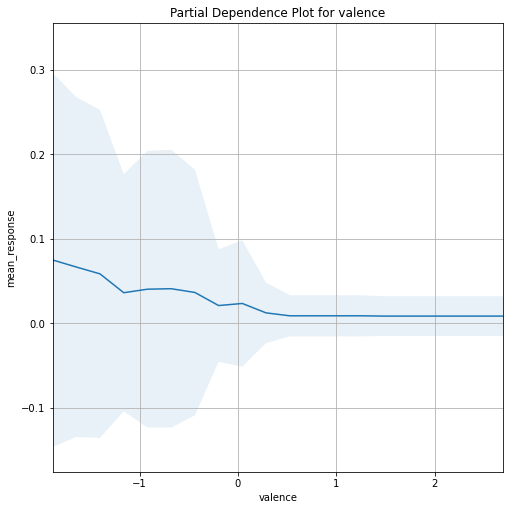

In [335]:
pdp_valence = ts_model.partial_plot(data = ts_df_train, cols = ["valence"], server=False, plot = True,save_to_file = "pdp_valence",figsize=(7,7))

In [336]:
ts_valence = pdp_valence[0].as_data_frame()

PartialDependencePlot progress: |█████████████████████████████████████████| 100%


/opt/conda/lib/python3.8/site-packages/h2o/model/model_base.py:1383: MatplotlibDeprecationWarning:

Since 3.2, the parameter *where* must have the same size as [-2.26940402058 -2.0387511958698017 -1.8080983711596035
 -1.5774455464494053 -1.3467927217392068 -1.1161398970290084
 -0.8854870723188102 -0.654834247608612 -0.42418142289841354
 -0.1935285981882151 0.03712422652198333 0.2677770512321813
 0.49842987594237975 0.7290827006525782 0.9597355253627762
 1.1903883500729746 1.421041174783173 1.6516939994933715 1.88234682420357
 2.112999648913768] in fill_betweenx(). This will become an error two minor releases later.



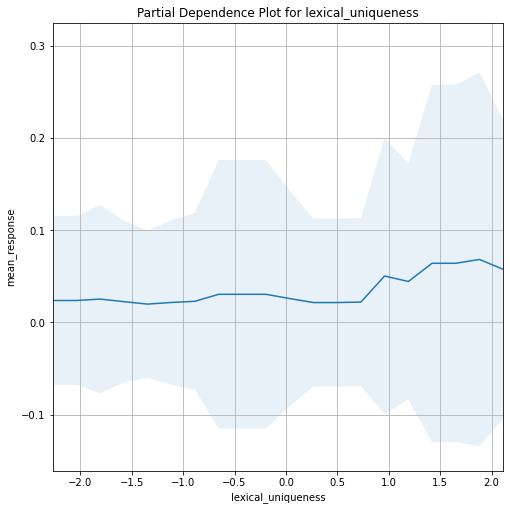

In [337]:
pdp_lexical = ts_model.partial_plot(data = ts_df_train, cols = ["lexical_uniqueness"], server=False, plot = True,save_to_file = "pdp_lexical",figsize=(7,7))

In [338]:
ts_lexical = pdp_lexical[0].as_data_frame()

PartialDependencePlot progress: |█████████████████████████████████████████| 100%


/opt/conda/lib/python3.8/site-packages/h2o/model/model_base.py:1383: MatplotlibDeprecationWarning:

Since 3.2, the parameter *where* must have the same size as [-1.440644795701442 -1.1685232023778425 -0.8964016090542428
 -0.6242800157306432 -0.35215842240704354 -0.0800368290834439
 0.19208476424015575 0.4642063575637554 0.736327950887355
 1.0084495442109545 1.2805711375345543 1.5526927308581542
 1.8248143241817536 2.096935917505353 2.369057510828953 2.6411791041525525
 2.913300697476152 3.1854222907997514 3.457543884123351 3.729665477446951] in fill_betweenx(). This will become an error two minor releases later.



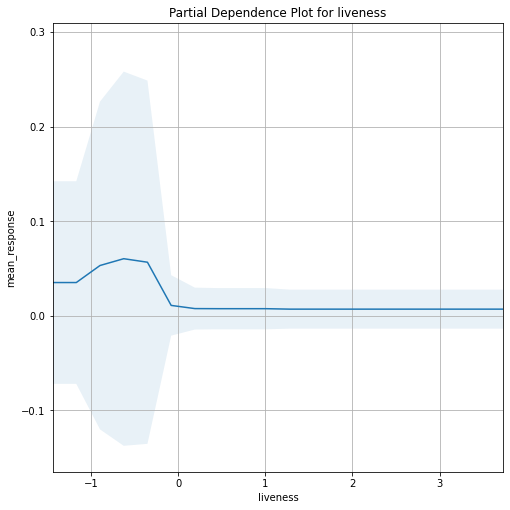

In [339]:
pdp_liveness = ts_model.partial_plot(data = ts_df_train, cols = ["liveness"], server=False, plot = True,save_to_file = "pdp_liveness",figsize=(7,7))

In [340]:
ts_liveness = pdp_liveness[0].as_data_frame()

PartialDependencePlot progress: |█████████████████████████████████████████| 100%


/opt/conda/lib/python3.8/site-packages/h2o/model/model_base.py:1383: MatplotlibDeprecationWarning:

Since 3.2, the parameter *where* must have the same size as [-2.125943718312367 -1.9111378184956973 -1.6963319186790278
 -1.4815260188623585 -1.2667201190456887 -1.0519142192290194
 -0.8371083194123499 -0.6223024195956803 -0.4074965197790108
 -0.19269061996234127 0.02211527985432804 0.2369211796709978
 0.4517270794876671 0.6665329793043369 0.8813388791210062
 1.096144778937676 1.3109506787543452 1.5257565785710145
 1.7405624783876843 1.9553683782043536] in fill_betweenx(). This will become an error two minor releases later.



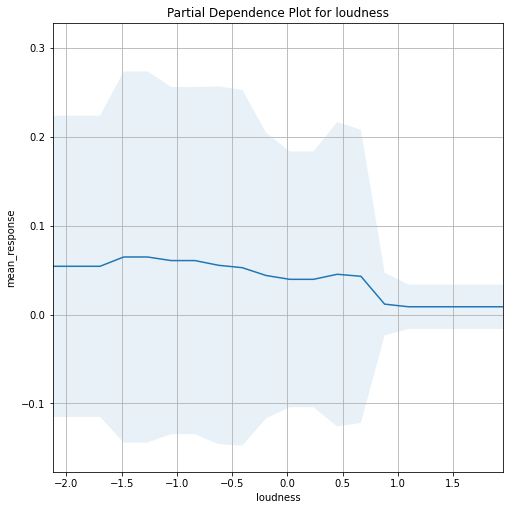

In [341]:
pdp_loudness = ts_model.partial_plot(data = ts_df_train, cols = ["loudness"], server=False, plot = True,save_to_file = "pdp_loudness",figsize=(7,7))

In [342]:
ts_loudness = pdp_loudness[0].as_data_frame()

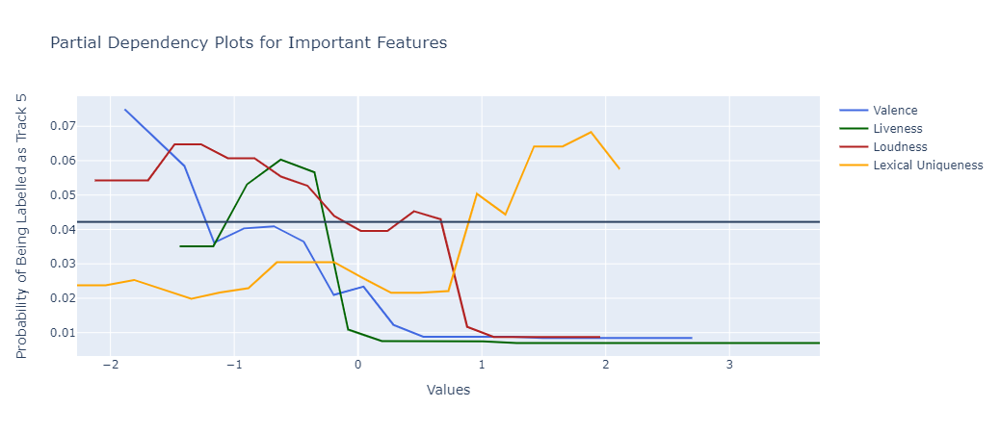

In [343]:
fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x=ts_valence['valence'], y=ts_valence['mean_response'], name='Valence',
                         line=dict(color='royalblue', width=2)))
fig.add_trace(go.Scatter(x=ts_liveness['liveness'], y=ts_liveness['mean_response'], name='Liveness',
                         line=dict(color='darkgreen', width=2)))
fig.add_trace(go.Scatter(x=ts_loudness['loudness'], y=ts_loudness['mean_response'], name='Loudness',
                         line=dict(color='firebrick', width=2)))
fig.add_trace(go.Scatter(x=ts_lexical['lexical_uniqueness'], y=ts_lexical['mean_response'], name='Lexical Uniqueness',
                         line=dict(color='orange', width=2)))

fig.add_hline(y=performance.F1()[0][0])

# Edit the layout
fig.update_layout(title='Partial Dependency Plots for Important Features',
                   xaxis_title='Values',
                   yaxis_title='Probability of Being Labelled as Track 5')


fig.show()

In [344]:
fig.write_html("ts_pdp_track5.html",include_plotlyjs="cdn")

In [345]:
performance.confusion_matrix()


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.04219561336614303: 


,,0,1,Error,Rate
0,0,36.0,2.0,0.0526,(2.0/38.0)
1,1,0.0,2.0,0.0,(0.0/2.0)
2,Total,36.0,4.0,0.05,(2.0/40.0)


The metric used are defined as follows:

1. `Gini Coefficient` - a measurement of how well quantified the inequality is shown. The closer to 1, the more useful the classifier.
2. `Precision` - The fraction of true positives over all predicted positive labels.
$$ precision = \frac{True Positive}{True Positive + False Positive} = \frac{2}{2+2} = \frac{1}{2}$$
3. `Recall` - The fraction of True Positive over all actual positive labels.
$$ recall = \frac{True Positive}{True Positive + False Negative} = \frac{2}{2+0} = 1$$
4. `F1` - Assuming both measures are equally weighted, it is the harmonic mean of the `precision` and `recall`
$$ F_1 = \frac{2*precision * recall}{precision + recall} = \frac{2*0.5*1}{0.5+1} = \frac{2}{3}$$
5. `F2` - It gives more weight to recall than precision. It is the harmonic mean of the `precision` and `recall`
$$ F_2 = \frac{5*precision * recall}{4*precision + recall} = \frac{5*0.5*1}{4*0.5+1} = \frac{5}{6}$$
5. `F0.5` - It gives more weight to precision than recall. It is the harmonic mean of the `precision` and `recall`
$$ F_5 = \frac{1.25*precision * recall}{0.25*precision + recall} = \frac{1.25*0.5*1}{0.25*0.5+1} = \frac{0.625}{1.125} = \frac{5}{9}$$

In [346]:
performance.precision(),performance.recall(),performance.F1(),performance.F2(),performance.F0point5()

([[0.04236718224613315, 0.5]],
 [[0.04219561336614303, 1.0]],
 [[0.04219561336614303, 0.6666666666666666]],
 [[0.04219561336614303, 0.8333333333333334]],
 [[0.04219561336614303, 0.5555555555555556]])

In our case, we have retrieved all true track number fives.

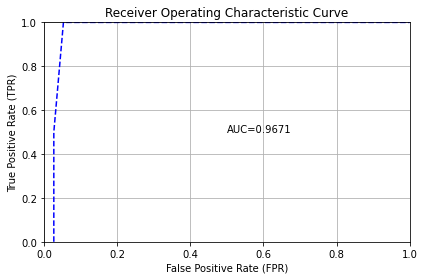

In [347]:
performance.plot(type = "roc")

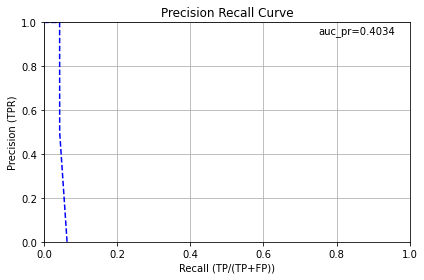

In [348]:
performance.plot(type = "pr")

In [349]:
predict = ts_model.predict(ts_df_test)
predict_tr = ts_model.predict(ts_df_train)

drf prediction progress: |████████████████████████████████████████████████| 100%
drf prediction progress: |████████████████████████████████████████████████| 100%


To retrieve the actual prediction probabilities of the following, we used the `predict` function. Then, we convert them into our pandas dataframe and append it to our dataset.

In [350]:
predict_df = h2o.as_list(predict)
predict_tr_df = h2o.as_list(predict_tr)

In [351]:
threshold = performance.F1()[0][0]
threshold

0.04219561336614303

In [352]:
pd_pred_prob = pd.concat([predict_tr_df,predict_df])
pd_pred_prob.reset_index(inplace=True,drop=True)
pd_pred_prob.head()

,predict,p0,p1
0,0,1.000000,0.000000
1,0,1.000000,0.000000
2,0,0.983028,0.016972
3,0,1.000000,0.000000
4,1,0.012264,0.987736


In [353]:
pd_pred_prob['pred_labels'] = np.where(pd_pred_prob['p1'] >= threshold,1,0)

In [354]:
final_ts_df = pd.concat([ts_lyric_sound_standard,pd_pred_prob],axis=1)
final_ts_df

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,liveness,valence,tempo,key,mode,track_5,predict,p0,p1,pred_labels
0,1,tim mcgraw,taylor swift,-0.431244,0.084569,-0.402943,-0.448713,0.313229,-0.535332,0.770021,...,-0.220532,-0.171128,0.889729,c,major,0,0,1.000000,0.000000,0
1,2,picture to burn,taylor swift,-0.575585,-0.142004,0.655819,1.523200,1.955368,-0.463273,-0.474178,...,-0.490171,2.106450,-0.642870,g,major,0,0,1.000000,0.000000,0
2,3,teardrops on my guitar,taylor swift,1.322588,1.110501,0.213222,-0.915307,0.137721,-0.585605,-0.037027,...,-0.207051,-0.824829,-0.827783,a#,major,0,0,0.983028,0.016972,0
3,4,a place in this world,taylor swift,0.747153,0.101203,-0.107878,1.078825,1.666163,-0.475004,-0.772236,...,2.408439,-0.191880,-0.332817,a,major,0,0,1.000000,0.000000,0
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,-0.355352,-0.378652,1.662377,f,major,1,1,0.012264,0.987736,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,11,cowboy like me,evermore,-0.169313,-0.020548,0.100403,-0.387612,-0.709293,-0.404621,1.384478,...,-0.207051,0.456633,0.093362,c,major,0,0,1.000000,0.000000,0
133,12,long story short,evermore,0.865426,0.415033,-0.402943,0.795536,-0.209478,-0.287316,1.054322,...,-0.554884,0.778295,1.077899,c,major,0,0,0.993207,0.006793,0
134,13,marjorie,evermore,-0.644249,-1.362343,-0.498405,-0.143205,-1.699384,-0.175039,1.714634,...,-0.314906,-0.705503,-0.954864,f,major,0,0,0.987358,0.012642,0
135,14,closure,evermore,-0.259780,-0.651127,0.838065,0.651115,-1.395680,3.119540,1.589297,...,-0.058750,2.578568,0.880156,a,major,0,0,0.998397,0.001603,0


In [355]:
pd.crosstab(final_ts_df['track_5'],final_ts_df['pred_labels'])

pred_labels,0,1
track_5,,
0,127,1
1,1,8


In [356]:
final_ts_df[final_ts_df['pred_labels'] == 1]

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,liveness,valence,tempo,key,mode,track_5,predict,p0,p1,pred_labels
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,-0.355352,-0.378652,1.662377,f,major,1,1,0.012264,0.987736,1
18,5,white horse,fearless,1.419132,1.685590,-2.060512,-1.320799,-0.280063,-0.441488,-0.101224,...,-0.517134,-0.902651,1.995096,c,major,1,1,0.012264,0.987736,1
31,5,dear john,speak now,1.355829,0.435206,-0.047129,-0.626463,0.747801,-0.543710,-0.452779,...,-0.395797,-1.639362,-0.187347,e,major,1,1,0.000000,1.000000,1
45,5,all too well,red,1.839328,3.461661,0.074368,0.290060,-0.240383,-0.558792,-0.848661,...,-0.126159,-0.695127,-1.054574,c,major,1,1,0.000000,1.000000,1
64,5,all you had to do was stay,1989,-1.694401,-0.924108,0.083046,0.823310,0.525364,-0.421379,-0.957307,...,-0.449725,0.254297,-0.926375,f,major,1,1,0.000000,1.000000,1
77,5,delicate,reputation,-0.638636,-0.615877,1.324053,-0.981963,-1.166376,0.319315,-0.266302,...,-0.643864,-1.885278,-0.990425,a,minor,1,1,0.000000,1.000000,1
92,5,the archer,lover,-0.096067,-0.451925,-2.607249,-0.070995,-0.847028,-0.314129,-0.596458,...,-0.971475,-1.333264,-0.025824,c,major,1,1,0.012264,0.987736,1
110,5,my tears ricochet,folklore,1.680734,2.079284,-1.183996,-1.798502,-1.325859,-0.429758,1.500644,...,-0.855530,-1.618609,0.155635,c,major,1,0,0.957633,0.042367,1
118,13,epiphany,folklore,0.529551,-0.414450,-2.069190,-1.776283,-2.493365,-0.515222,1.271369,...,-0.708577,-1.608233,-1.016841,c#,major,0,0,0.937438,0.062562,1


In [357]:
final_ts_df[final_ts_df['track_number'] == 5]

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,liveness,valence,tempo,key,mode,track_5,predict,p0,p1,pred_labels
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,-0.355352,-0.378652,1.662377,f,major,1,1,0.012264,0.987736,1
18,5,white horse,fearless,1.419132,1.685590,-2.060512,-1.320799,-0.280063,-0.441488,-0.101224,...,-0.517134,-0.902651,1.995096,c,major,1,1,0.012264,0.987736,1
31,5,dear john,speak now,1.355829,0.435206,-0.047129,-0.626463,0.747801,-0.543710,-0.452779,...,-0.395797,-1.639362,-0.187347,e,major,1,1,0.000000,1.000000,1
45,5,all too well,red,1.839328,3.461661,0.074368,0.290060,-0.240383,-0.558792,-0.848661,...,-0.126159,-0.695127,-1.054574,c,major,1,1,0.000000,1.000000,1
64,5,all you had to do was stay,1989,-1.694401,-0.924108,0.083046,0.823310,0.525364,-0.421379,-0.957307,...,-0.449725,0.254297,-0.926375,f,major,1,1,0.000000,1.000000,1
77,5,delicate,reputation,-0.638636,-0.615877,1.324053,-0.981963,-1.166376,0.319315,-0.266302,...,-0.643864,-1.885278,-0.990425,a,minor,1,1,0.000000,1.000000,1
92,5,the archer,lover,-0.096067,-0.451925,-2.607249,-0.070995,-0.847028,-0.314129,-0.596458,...,-0.971475,-1.333264,-0.025824,c,major,1,1,0.012264,0.987736,1
110,5,my tears ricochet,folklore,1.680734,2.079284,-1.183996,-1.798502,-1.325859,-0.429758,1.500644,...,-0.855530,-1.618609,0.155635,c,major,1,0,0.957633,0.042367,1
126,5,tolerate it,evermore,1.137546,1.310447,-2.398968,-1.254143,-1.230856,-0.168336,1.720748,...,-0.790817,-1.047918,-1.650665,a,major,1,0,0.957804,0.042196,0


In [358]:
final_ts_df.to_csv('final_features_model_label.csv',index=False)

Based on our data, the additional track fives are `epiphany` from folklore and `evermore` from evermore. After all, `epiphany` have similar progression and mellowness to `The Archer` from `Lover`.

## Can a machine re-arrange Taylor Swift Albums?

For our next project, we want to rearrange the songs from Taylor Swift into our discography. We will compare how `H2OGradientBoostingEstimator` and `H2ORandomForestEstimator` compare against each other. We will use the previous dataset and the `credits` dataset for our project.

### Exploring both datasets

In [359]:
ts_lyric_sound_combined.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode,track_5
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,0.0,0.122,0.390,152.175,c,major,0
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,0.0,0.102,0.829,105.587,g,major,0
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,0.0,0.123,0.264,99.966,a#,major,0
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,0.0,0.317,0.386,115.012,a,major,0
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,0.0,0.112,0.350,175.662,f,major,1


In [360]:
ts_credits.head()

,track_number,album_name,track_name,solely_written,producers,co_writer,featuring,more_prod,more_write
0,1,taylor swift,tim mcgraw,No,[Nathan Chapman],[Liz Rose],NaN,No,No
1,2,taylor swift,picture to burn,No,[Nathan Chapman],[Liz Rose],NaN,No,No
2,3,taylor swift,teardrops on my guitar,No,[Nathan Chapman],[Liz Rose],NaN,No,No
3,4,taylor swift,a place in this world,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]",NaN,No,Yes
4,5,taylor swift,cold as you,No,[Nathan Chapman],[Liz Rose],NaN,No,No


In [361]:
ts_final_form = pd.merge(ts_lyric_sound_combined,ts_credits[['track_number','album_name','track_name','solely_written','producers','co_writer']],on=['track_number','album_name','track_name'],how='inner')
ts_final_form.reset_index(inplace=True,drop=True)
ts_final_form.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode,track_5,solely_written,producers,co_writer
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,0.0,0.122,0.390,152.175,c,major,0,No,[Nathan Chapman],[Liz Rose]
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,0.0,0.102,0.829,105.587,g,major,0,No,[Nathan Chapman],[Liz Rose]
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,0.0,0.123,0.264,99.966,a#,major,0,No,[Nathan Chapman],[Liz Rose]
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,0.0,0.317,0.386,115.012,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]"
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,0.0,0.112,0.350,175.662,f,major,1,No,[Nathan Chapman],[Liz Rose]


In [362]:
ts_final_form['album_name'] = pd.Categorical(ts_final_form.album_name, categories=album_names_list[0:], ordered=True)
ts_final_form = ts_final_form.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_final_form.reset_index(inplace=True,drop=True)
ts_final_form.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,key,mode,track_5,solely_written,producers,co_writer
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,0.0,0.122,0.390,152.175,c,major,0,No,[Nathan Chapman],[Liz Rose]
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,0.0,0.102,0.829,105.587,g,major,0,No,[Nathan Chapman],[Liz Rose]
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,0.0,0.123,0.264,99.966,a#,major,0,No,[Nathan Chapman],[Liz Rose]
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,0.0,0.317,0.386,115.012,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]"
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,0.0,0.112,0.350,175.662,f,major,1,No,[Nathan Chapman],[Liz Rose]


In [363]:
ts_final_form.to_csv('ts_all_discography.csv',index=False)

In [364]:
def add_name(indicator,write_list):
    ts_name= ['Taylor Swift']
    if indicator == 'Yes':
        return ts_name
    else:
        return write_list + ts_name

In [365]:
ts_final_form['writers'] = ts_final_form.apply(lambda x: add_name(x['solely_written'], x['co_writer']), axis=1)

In [366]:
ts_final_form.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,liveness,valence,tempo,key,mode,track_5,solely_written,producers,co_writer,writers
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,...,0.122,0.390,152.175,c,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]"
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,...,0.102,0.829,105.587,g,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]"
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,...,0.123,0.264,99.966,a#,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]"
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,...,0.317,0.386,115.012,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia, Taylor Swift]"
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,...,0.112,0.350,175.662,f,major,1,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]"


In [367]:
mlb = MultiLabelBinarizer()
ts_writers = pd.DataFrame(mlb.fit_transform(ts_final_form['writers'].values.tolist()),columns=mlb.classes_)
ts_writers.reset_index(inplace=True,drop=True)
ts_writers.columns = ts_writers.columns.str.replace(' ', '')
ts_writers.columns = [f'writer_{write}' for write in ts_writers]
ts_writers.head()

,writer_AaronDessner,writer_AdamKingFeeney,writer_AliPayami,writer_AnegloPetraglia,writer_AnnieClark,writer_BrendonUrie,writer_BrettJames,writer_BrianMaher,writer_BryceDessner,writer_CautiousClay,...,writer_OscarGorres,writer_OscarHolter,writer_RichardFairbrass,writer_RobManzoli,writer_RobertOrrall,writer_RyanTedder,writer_Shellback,writer_TaylorSwift,writer_TroyVerges,writer_WilliamBowery
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [368]:
write_col_list = ts_writers.columns.tolist()

In [369]:
ts_producers = pd.DataFrame(mlb.fit_transform(ts_final_form['producers'].values.tolist()),columns=mlb.classes_)
ts_producers.reset_index(inplace=True,drop=True)
ts_producers.columns = ts_producers.columns.str.replace(' ', '')
ts_producers.columns = [f'producer_{produce}' for produce in ts_producers]
ts_producers.head()

,producer_AaronDessner,producer_AliPayami,producer_AnegloPetraglia,producer_BJBurton,producer_BrettJames,producer_BryceDessner,producer_ButchWalker,producer_DanWilson,producer_DannHuff,producer_FrankDukes,...,producer_NathanChapman,producer_NoelZancanella,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [370]:
produce_col_list = ts_producers.columns.tolist()

In [371]:
#labels = venn.get_labels([set(ts_lyrics_song['lyric_set'][66]),set(ts_lyrics_song['lyric_set'][48]),set(ts_lyrics_song['lyric_set'][20]),set(ts_lyrics_song['lyric_set'][21])])
#fig, ax = venn.venn4(labels, names=['I Wish You Would', 'We Are Never Ever Getting Back Together','Breathe','Tell Me Why'])
#fig.show()

In [372]:
#lyric_sets = [set(ts_lyrics_song['lyric_set'][66]),set(ts_lyrics_song['lyric_set'][48]),set(ts_lyrics_song['lyric_set'][20]),set(ts_lyrics_song['lyric_set'][21])]
#set.intersection(*lyric_sets)                                                                                                                   

In [373]:
ts_albums_number = {'taylor swift':0,'fearless':1,'speak now':2,'red':3,'1989':4,'reputation':5,'lover':6,'folklore':7,'evermore':8}

In [374]:
ts_final_form['album_number'] = ts_final_form['album_name'].apply(lambda x: ts_albums_number[x])

In [375]:
ts_final_form.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,valence,tempo,key,mode,track_5,solely_written,producers,co_writer,writers,album_number
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,...,0.390,152.175,c,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,...,0.829,105.587,g,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,...,0.264,99.966,a#,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,...,0.386,115.012,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia, Taylor Swift]",0
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,...,0.350,175.662,f,major,1,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0


In [376]:
ts_final_form_standard = ts_final_form.copy()
ts_final_form_standard.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,valence,tempo,key,mode,track_5,solely_written,producers,co_writer,writers,album_number
0,1,tim mcgraw,taylor swift,0.456044,0.311828,0.546,0.506,-6.334,0.0269,0.5670,...,0.390,152.175,c,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
1,2,picture to burn,taylor swift,0.438710,0.278351,0.668,0.861,-2.030,0.0312,0.1600,...,0.829,105.587,g,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
2,3,teardrops on my guitar,taylor swift,0.666667,0.463415,0.617,0.422,-6.794,0.0239,0.3030,...,0.264,99.966,a#,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
3,4,a place in this world,taylor swift,0.597561,0.314286,0.580,0.781,-2.788,0.0305,0.0625,...,0.386,115.012,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia, Taylor Swift]",0
4,5,cold as you,taylor swift,0.620000,0.444444,0.414,0.489,-5.651,0.0251,0.2720,...,0.350,175.662,f,major,1,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0


In [377]:
ts_final_form_standard[new_features] = StandardScaler().fit_transform(ts_final_form_standard[new_features])
ts_final_form_standard.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,valence,tempo,key,mode,track_5,solely_written,producers,co_writer,writers,album_number
0,1,tim mcgraw,taylor swift,-0.431244,0.084569,-0.402943,-0.448713,0.313229,-0.535332,0.770021,...,-0.171128,0.889729,c,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
1,2,picture to burn,taylor swift,-0.575585,-0.142004,0.655819,1.523200,1.955368,-0.463273,-0.474178,...,2.106450,-0.642870,g,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
2,3,teardrops on my guitar,taylor swift,1.322588,1.110501,0.213222,-0.915307,0.137721,-0.585605,-0.037027,...,-0.824829,-0.827783,a#,major,0,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0
3,4,a place in this world,taylor swift,0.747153,0.101203,-0.107878,1.078825,1.666163,-0.475004,-0.772236,...,-0.191880,-0.332817,a,major,0,No,[Nathan Chapman],"[Robert Orrall, Aneglo Petraglia]","[Robert Orrall, Aneglo Petraglia, Taylor Swift]",0
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,-0.378652,1.662377,f,major,1,No,[Nathan Chapman],[Liz Rose],"[Liz Rose, Taylor Swift]",0


In [378]:
all_features = new_features + write_col_list + produce_col_list
all_features_label = all_features + ['album_number']

In [379]:
ts_final_form_all = pd.concat([ts_final_form_standard,ts_writers,ts_producers],axis=1)
ts_final_form_all.reset_index(drop=True,inplace=True)
ts_final_form_all.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,producer_NathanChapman,producer_NoelZancanella,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges
0,1,tim mcgraw,taylor swift,-0.431244,0.084569,-0.402943,-0.448713,0.313229,-0.535332,0.770021,...,1,0,0,0,0,0,0,0,0,0
1,2,picture to burn,taylor swift,-0.575585,-0.142004,0.655819,1.523200,1.955368,-0.463273,-0.474178,...,1,0,0,0,0,0,0,0,0,0
2,3,teardrops on my guitar,taylor swift,1.322588,1.110501,0.213222,-0.915307,0.137721,-0.585605,-0.037027,...,1,0,0,0,0,0,0,0,0,0
3,4,a place in this world,taylor swift,0.747153,0.101203,-0.107878,1.078825,1.666163,-0.475004,-0.772236,...,1,0,0,0,0,0,0,0,0,0
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,1,0,0,0,0,0,0,0,0,0


In [380]:
ts_final_form_train = ts_final_form_all[ts_final_form_all['track_number'] > 5]
ts_final_form_test = ts_final_form_all[ts_final_form_all['track_number'] <= 5]
ts_final_form_train.reset_index(inplace=True,drop=True)
ts_final_form_test.reset_index(inplace=True,drop=True)

In [381]:
ts_final_form_all['album_number'].value_counts()

3    19
6    18
7    16
5    15
8    15
0    14
2    14
1    13
4    13
Name: album_number, dtype: int64

In [382]:
all_features_sep = all_features_label + ['track_number']
ts_final_form_hf = ts_final_form_all[all_features_sep]
ts_final_form_hf.reset_index(inplace=True,drop=True)
ts_final_form_hf.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,...,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges,album_number,track_number
0,-0.402943,-0.448713,0.313229,-0.535332,0.770021,-0.1474,-0.220532,-0.171128,0.889729,-0.431244,...,0,0,0,0,0,0,0,0,0,1
1,0.655819,1.523200,1.955368,-0.463273,-0.474178,-0.1474,-0.490171,2.106450,-0.642870,-0.575585,...,0,0,0,0,0,0,0,0,0,2
2,0.213222,-0.915307,0.137721,-0.585605,-0.037027,-0.1474,-0.207051,-0.824829,-0.827783,1.322588,...,0,0,0,0,0,0,0,0,0,3
3,-0.107878,1.078825,1.666163,-0.475004,-0.772236,-0.1474,2.408439,-0.191880,-0.332817,0.747153,...,0,0,0,0,0,0,0,0,0,4
4,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,-0.1474,-0.355352,-0.378652,1.662377,0.934000,...,0,0,0,0,0,0,0,0,0,5


In [383]:
ts_final_form_hf = h2o.H2OFrame(ts_final_form_hf)
ts_final_form_hf['album_number'] = ts_final_form_hf['album_number'].asfactor()
ts_df_train_standard = ts_final_form_hf[ts_final_form_hf['track_number'] > 5]
ts_df_test_standard = ts_final_form_hf[ts_final_form_hf['track_number'] <= 5]

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [384]:
ts_df_train_standard

danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,chorus_uniqueness,writer_AaronDessner,writer_AdamKingFeeney,writer_AliPayami,writer_AnegloPetraglia,writer_AnnieClark,writer_BrendonUrie,writer_BrettJames,writer_BrianMaher,writer_BryceDessner,writer_CautiousClay,writer_ColbieCaillat,writer_DanWilson,writer_EdSheeran,writer_FredFairbrass,writer_GaryLightbody,writer_HillaryLindsey,writer_ImogenHeap,writer_JackAntonoff,writer_JacknifeLee,writer_JoelLittle,writer_JohnRich,writer_JustinVernon,writer_LizRose,writer_LouisBell,writer_MarkAnthonySpears,writer_MaxMartin,writer_NayvadiusWilburn,writer_OscarGorres,writer_OscarHolter,writer_RichardFairbrass,writer_RobManzoli,writer_RobertOrrall,writer_RyanTedder,writer_Shellback,writer_TaylorSwift,writer_TroyVerges,writer_WilliamBowery,producer_AaronDessner,producer_AliPayami,producer_AnegloPetraglia,producer_BJBurton,producer_BrettJames,producer_BryceDessner,producer_ButchWalker,producer_DanWilson,producer_DannHuff,producer_FrankDukes,producer_GregKurstin,producer_ImogenHeap,producer_JackAntonoff,producer_JacknifeLee,producer_JamesMcalister,producer_JeffBhasker,producer_JoelLittle,producer_LouisBell,producer_Mattman&Robin,producer_MaxMartin,producer_NathanChapman,producer_NoelZancanella,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges,album_number,track_number
-0.116556,1.2288,1.20832,-0.525277,-0.951131,-0.1474,1.35685,0.959879,-0.399697,0.119815,-0.0352933,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,6
-1.11457,0.0234351,0.939333,-0.506843,0.601886,-0.1474,-0.592633,-1.12055,0.692249,-0.368023,0.122689,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,7
-0.0210941,0.312279,0.927123,-0.578902,-0.663712,-0.1474,-0.0317858,0.441068,0.214389,0.0286854,0.0339441,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8
-1.02779,1.03439,1.3327,-0.471652,-0.928754,-0.1474,1.55908,0.228356,1.40947,-0.449545,-0.116958,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,9
-0.845539,0.267841,0.732539,-0.518574,-0.879231,-0.1474,0.588382,-0.0984945,0.844561,1.54067,3.44821,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10
-0.428978,0.55113,0.917203,-0.387863,-0.6148,-0.1474,2.65111,0.684909,1.73514,-0.0652269,0.185444,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,11
-0.420299,1.80649,1.35178,0.250608,-0.946699,-0.113182,-0.549491,1.06883,0.620237,0.284969,0.0172879,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,12
0.2219,-1.03751,0.637155,-0.562144,0.953441,-0.1474,-0.593981,-1.21394,-0.956542,-0.601116,0.480782,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,13
-1.00175,0.82331,0.560465,-0.406297,-0.947952,-0.1474,-0.139641,-0.503167,1.01671,-1.68827,-1.06953,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,14
0.759959,1.06772,1.07325,-0.332562,-0.281587,-0.146017,-0.436243,0.570771,0.159813,0.67923,0.120069,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,6


In [385]:
ts_df_test_standard

danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,lexical_uniqueness,chorus_uniqueness,writer_AaronDessner,writer_AdamKingFeeney,writer_AliPayami,writer_AnegloPetraglia,writer_AnnieClark,writer_BrendonUrie,writer_BrettJames,writer_BrianMaher,writer_BryceDessner,writer_CautiousClay,writer_ColbieCaillat,writer_DanWilson,writer_EdSheeran,writer_FredFairbrass,writer_GaryLightbody,writer_HillaryLindsey,writer_ImogenHeap,writer_JackAntonoff,writer_JacknifeLee,writer_JoelLittle,writer_JohnRich,writer_JustinVernon,writer_LizRose,writer_LouisBell,writer_MarkAnthonySpears,writer_MaxMartin,writer_NayvadiusWilburn,writer_OscarGorres,writer_OscarHolter,writer_RichardFairbrass,writer_RobManzoli,writer_RobertOrrall,writer_RyanTedder,writer_Shellback,writer_TaylorSwift,writer_TroyVerges,writer_WilliamBowery,producer_AaronDessner,producer_AliPayami,producer_AnegloPetraglia,producer_BJBurton,producer_BrettJames,producer_BryceDessner,producer_ButchWalker,producer_DanWilson,producer_DannHuff,producer_FrankDukes,producer_GregKurstin,producer_ImogenHeap,producer_JackAntonoff,producer_JacknifeLee,producer_JamesMcalister,producer_JeffBhasker,producer_JoelLittle,producer_LouisBell,producer_Mattman&Robin,producer_MaxMartin,producer_NathanChapman,producer_NoelZancanella,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges,album_number,track_number
-0.402943,-0.448713,0.313229,-0.535332,0.770021,-0.1474,-0.220532,-0.171128,0.889729,-0.431244,0.0845693,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
0.655819,1.5232,1.95537,-0.463273,-0.474178,-0.1474,-0.490171,2.10645,-0.64287,-0.575585,-0.142004,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
0.213222,-0.915307,0.137721,-0.585605,-0.0370273,-0.1474,-0.207051,-0.824829,-0.827783,1.32259,1.1105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3
-0.107878,1.07883,1.66616,-0.475004,-0.772236,-0.1474,2.40844,-0.19188,-0.332817,0.747153,0.101203,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4
-1.54849,-0.543143,0.573819,-0.565496,-0.131794,-0.1474,-0.355352,-0.378652,1.66238,0.934,0.982111,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5
-0.0384509,0.595568,1.08012,-0.516898,-0.830624,-0.1474,2.08487,0.451445,-0.825711,0.21651,-0.521878,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1
-0.342194,0.378935,1.10988,-0.552089,-0.706816,-0.1474,0.0625875,-1.09461,-0.97776,1.25611,2.13903,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,2
0.161152,0.839974,1.23502,-0.471652,-0.480292,-0.1474,-0.633079,-0.54986,-0.201493,0.716996,1.82666,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,3
2.09643,-0.265409,-0.0473246,-0.473328,-0.471121,-0.1474,-0.422761,1.87817,-0.301236,-0.381746,-0.449769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,4
-2.06051,-1.3208,-0.280063,-0.441488,-0.101224,-0.1474,-0.517134,-0.902651,1.9951,1.41913,1.68559,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,5


In [386]:
ts_df_train_standard.shape,ts_df_test_standard.shape

((92, 80), (45, 80))

In [387]:
predictor = all_features
response = "album_number"
distribution = "multinomial"

In [388]:
from h2o.estimators import H2OGradientBoostingEstimator
ts_model_gbm = H2OGradientBoostingEstimator(nfolds = 5, distribution = distribution,balance_classes=True,seed=42)
ts_model_gbm.train(x=predictor, y=response, training_frame=ts_df_train_standard)

/opt/conda/lib/python3.8/site-packages/h2o/estimators/estimator_base.py:200: RuntimeWarning:

Dropping bad and constant columns: [writer_NayvadiusWilburn, writer_HillaryLindsey, writer_TaylorSwift, producer_AliPayami, producer_Mattman&Robin, writer_AnnieClark, writer_AliPayami]



gbm Model Build progress: |███████████████████████████████████████████████| 100%


In [389]:
performance_gbm = ts_model_gbm.model_performance(test_data=ts_df_test_standard)

In [390]:
ts_model_gbm

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_model_python_1618995133778_1074


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,450.0,74092.0,2.0,5.0,4.908889,3.0,12.0,8.482223




ModelMetricsMultinomial: gbm
** Reported on train data. **

MSE: 0.000213271672066065
RMSE: 0.014603823885067396
LogLoss: 0.012158884684863834
Mean Per-Class Error: 0.0
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0 / 16
1,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0 / 12
2,0.0,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0 / 12
3,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0 / 14
4,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0 / 14
5,0.0,0.0,0.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0 / 16
6,0.0,0.0,0.0,0.0,0.0,0.0,16.0,0.0,0.0,0.0,0 / 16
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0 / 14
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0 / 15
9,16.0,12.0,12.0,14.0,14.0,16.0,16.0,14.0,15.0,0.0,0 / 129



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,1.0
1,2,1.0
2,3,1.0
3,4,1.0
4,5,1.0
5,6,1.0
6,7,1.0
7,8,1.0
8,9,1.0



ModelMetricsMultinomial: gbm
** Reported on cross-validation data. **

MSE: 0.5030560076399304
RMSE: 0.7092644130646415
LogLoss: 1.8730598567880408
Mean Per-Class Error: 0.5674782008115341
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,6.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.333333,3 / 9
1,0.0,3.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,0.625000,5 / 8
2,0.0,0.0,7.0,1.0,0.0,0.0,1.0,0.0,0.0,0.222222,2 / 9
3,0.0,2.0,2.0,7.0,0.0,1.0,1.0,1.0,0.0,0.500000,7 / 14
4,1.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,0.0,0.875000,7 / 8
5,0.0,0.0,0.0,2.0,2.0,3.0,2.0,1.0,0.0,0.700000,7 / 10
6,0.0,0.0,0.0,5.0,1.0,1.0,5.0,1.0,0.0,0.615385,8 / 13
7,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,6.0,0.636364,7 / 11
8,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,4.0,0.600000,6 / 10
9,7.0,6.0,13.0,20.0,6.0,6.0,11.0,13.0,10.0,0.565217,52 / 92



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,0.434783
1,2,0.717391
2,3,0.815217
3,4,0.902174
4,5,0.913043
5,6,0.923913
6,7,0.934782
7,8,0.945652
8,9,1.000000



Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.42366078,0.15523463,0.47058824,0.44827586,0.2857143,0.64705884,0.26666668
1,auc,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,aucpr,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,err,0.57633924,0.15523463,0.5294118,0.55172414,0.71428573,0.3529412,0.73333335
4,err_count,10.4,3.6469164,9.0,16.0,10.0,6.0,11.0
5,logloss,1.913484,0.24179521,2.0082076,1.6692264,1.9519869,1.6883049,2.249694
6,max_per_class_error,0.9,0.2236068,1.0,1.0,1.0,0.5,1.0
7,mean_per_class_accuracy,0.5774074,0.14582907,0.6296296,0.4462963,0.5222222,0.8074074,0.4814815
8,mean_per_class_error,0.42259258,0.14582907,0.37037036,0.5537037,0.47777778,0.19259259,0.5185185
9,mse,0.51193976,0.075735405,0.5039412,0.47571987,0.60349494,0.4106028,0.56593996



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_classification_error,training_auc,training_pr_auc
0,,2021-04-21 09:00:57,2.569 sec,0.0,0.889500,2.216546,0.891473,NaN,NaN
1,,2021-04-21 09:00:57,2.597 sec,1.0,0.827403,1.775677,0.286822,NaN,NaN
2,,2021-04-21 09:00:57,2.652 sec,2.0,0.776110,1.524333,0.178295,NaN,NaN
3,,2021-04-21 09:00:57,2.706 sec,3.0,0.730551,1.342406,0.155039,NaN,NaN
4,,2021-04-21 09:00:57,2.747 sec,4.0,0.682860,1.179053,0.162791,NaN,NaN
5,,2021-04-21 09:00:57,2.756 sec,5.0,0.641755,1.054694,0.139535,NaN,NaN
6,,2021-04-21 09:00:57,2.784 sec,6.0,0.600549,0.939756,0.116279,NaN,NaN
7,,2021-04-21 09:00:57,2.793 sec,7.0,0.561721,0.841624,0.108527,NaN,NaN
8,,2021-04-21 09:00:57,2.803 sec,8.0,0.526000,0.758139,0.085271,NaN,NaN
9,,2021-04-21 09:00:57,2.812 sec,9.0,0.490879,0.680362,0.069767,NaN,NaN



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,loudness,70.913956,1.000000,0.184433
1,chorus_uniqueness,51.464241,0.725728,0.133848
2,speechiness,45.867233,0.646801,0.119291
3,producer_TaylorSwift,40.133533,0.565947,0.104379
4,producer_AaronDessner,36.953934,0.521109,0.096110
5,danceability,29.710640,0.418967,0.077271
6,lexical_uniqueness,28.215120,0.397878,0.073382
7,valence,22.418379,0.316135,0.058306
8,liveness,11.025973,0.155484,0.028676
9,producer_NathanChapman,8.759745,0.123526,0.022782



See the whole table with table.as_data_frame()


In [391]:
performance_gbm


ModelMetricsMultinomial: gbm
** Reported on test data. **

MSE: 0.4237225365687721
RMSE: 0.6509397334383361
LogLoss: 1.750806428006418
Mean Per-Class Error: 0.4666666666666667
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.400000,2 / 5
1,0.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.400000,2 / 5
2,0.0,2.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.400000,2 / 5
3,0.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,0.0,0.600000,3 / 5
4,2.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.400000,2 / 5
5,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.200000,1 / 5
6,0.0,0.0,0.0,0.0,0.0,3.0,1.0,1.0,0.0,0.800000,4 / 5
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.800000,4 / 5
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.200000,1 / 5
9,5.0,7.0,4.0,5.0,4.0,7.0,2.0,3.0,8.0,0.466667,21 / 45



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,0.533333
1,2,0.733333
2,3,0.822222
3,4,0.911111
4,5,0.933333
5,6,0.933333
6,7,0.955556
7,8,0.977778
8,9,1.000000


In [392]:
ts_model_drf = H2ORandomForestEstimator(ntrees=50, max_depth=20, nfolds=15,balance_classes = True,seed=42)
ts_model_drf.train(x = predictor, y = response, training_frame = ts_df_train_standard)

/opt/conda/lib/python3.8/site-packages/h2o/estimators/estimator_base.py:200: RuntimeWarning:

Dropping bad and constant columns: [writer_NayvadiusWilburn, writer_HillaryLindsey, writer_TaylorSwift, producer_AliPayami, producer_Mattman&Robin, writer_AnnieClark, writer_AliPayami]



drf Model Build progress: |███████████████████████████████████████████████| 100%


In [393]:
performance_drf = ts_model_drf.model_performance(test_data=ts_df_test_standard)

In [394]:
ts_model_drf

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  DRF_model_python_1618995133778_1075


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,450.0,84807.0,1.0,11.0,6.513333,2.0,21.0,10.317778




ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.24320250484145023
RMSE: 0.49315565984935245
LogLoss: 0.7467327887663063
Mean Per-Class Error: 0.18346560846560844
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0 / 16
1,0.0,9.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.250000,3 / 12
2,1.0,0.0,9.0,1.0,0.0,0.0,0.0,0.0,1.0,0.250000,3 / 12
3,0.0,0.0,1.0,10.0,1.0,1.0,0.0,1.0,0.0,0.285714,4 / 14
4,0.0,0.0,1.0,1.0,12.0,0.0,0.0,0.0,0.0,0.142857,2 / 14
5,0.0,0.0,0.0,0.0,1.0,12.0,3.0,0.0,0.0,0.250000,4 / 16
6,0.0,0.0,0.0,0.0,0.0,0.0,14.0,2.0,0.0,0.125000,2 / 16
7,0.0,0.0,0.0,0.0,0.0,0.0,1.0,11.0,2.0,0.214286,3 / 14
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,13.0,0.133333,2 / 15
9,17.0,9.0,12.0,14.0,14.0,13.0,18.0,16.0,16.0,0.178295,23 / 129



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,0.821705
1,2,0.899225
2,3,0.930233
3,4,0.968992
4,5,0.976744
5,6,0.992248
6,7,0.992248
7,8,1.000000
8,9,1.000000



ModelMetricsMultinomial: drf
** Reported on cross-validation data. **

MSE: 0.527024556753812
RMSE: 0.7259645699025621
LogLoss: 1.5170078279947246
Mean Per-Class Error: 0.5488986322319656
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,5.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.444444,4 / 9
1,0.0,3.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.625000,5 / 8
2,0.0,0.0,5.0,2.0,0.0,0.0,2.0,0.0,0.0,0.444444,4 / 9
3,0.0,1.0,2.0,9.0,1.0,1.0,0.0,0.0,0.0,0.357143,5 / 14
4,0.0,0.0,1.0,1.0,3.0,2.0,1.0,0.0,0.0,0.625000,5 / 8
5,0.0,0.0,0.0,0.0,3.0,2.0,5.0,0.0,0.0,0.800000,8 / 10
6,0.0,0.0,1.0,1.0,0.0,1.0,9.0,1.0,0.0,0.307692,4 / 13
7,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,5.0,0.636364,7 / 11
8,0.0,0.0,0.0,1.0,0.0,0.0,0.0,6.0,3.0,0.700000,7 / 10
9,5.0,4.0,12.0,19.0,7.0,6.0,18.0,13.0,8.0,0.532609,49 / 92



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,0.467391
1,2,0.717391
2,3,0.804348
3,4,0.880435
4,5,0.956522
5,6,0.956522
6,7,0.989130
7,8,1.000000
8,9,1.000000



Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid,cv_6_valid,cv_7_valid,cv_8_valid,cv_9_valid,cv_10_valid,cv_11_valid,cv_12_valid,cv_13_valid,cv_14_valid,cv_15_valid
0,accuracy,0.47643468,0.252361,0.5,0.3846154,0.2857143,0.42857143,0.2857143,0.0,0.6666667,0.33333334,0.71428573,0.6666667,0.14285715,0.5714286,0.5,0.6666667,1.0
1,auc,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,aucpr,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,err,0.52356535,0.252361,0.5,0.61538464,0.71428573,0.5714286,0.71428573,1.0,0.33333334,0.6666667,0.2857143,0.33333334,0.85714287,0.42857143,0.5,0.33333334,0.0
4,err_count,3.2666667,2.086236,4.0,8.0,5.0,4.0,5.0,2.0,3.0,2.0,2.0,2.0,6.0,3.0,2.0,1.0,0.0
5,logloss,1.5162898,0.6071248,1.2663519,1.7115709,1.2672799,1.5574807,2.5534248,3.1850424,1.4816548,1.2600672,1.3414048,1.3872782,1.6413695,1.1669028,0.9271055,0.97634894,1.021065
6,max_per_class_error,0.87777776,0.28498584,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.6666667,1.0,1.0,1.0,1.0,0.5,0.0
7,mean_per_class_accuracy,0.7691358,0.1205974,0.7222222,0.6111111,0.6666667,0.7407407,0.7037037,0.7777778,0.7222222,0.8333333,0.9259259,0.7777778,0.5555556,0.7777778,0.7777778,0.9444444,1.0
8,mean_per_class_error,0.2308642,0.1205974,0.2777778,0.3888889,0.33333334,0.25925925,0.2962963,0.22222222,0.2777778,0.16666667,0.074074075,0.22222222,0.44444445,0.22222222,0.22222222,0.055555556,0.0
9,mse,0.5267551,0.13665208,0.47093925,0.5586821,0.49764776,0.54122007,0.69116735,0.91157454,0.50925255,0.50236374,0.5110705,0.5157011,0.605289,0.4544118,0.34788215,0.38273573,0.40138867



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_classification_error,training_auc,training_pr_auc
0,,2021-04-21 09:01:21,3.606 sec,0.0,NaN,NaN,NaN,NaN,NaN
1,,2021-04-21 09:01:21,3.624 sec,1.0,0.748851,17.081260,0.577778,NaN,NaN
2,,2021-04-21 09:01:21,3.633 sec,2.0,0.692986,14.160993,0.454545,NaN,NaN
3,,2021-04-21 09:01:21,3.643 sec,3.0,0.624997,10.210115,0.438776,NaN,NaN
4,,2021-04-21 09:01:21,3.650 sec,4.0,0.626956,9.925676,0.446429,NaN,NaN
5,,2021-04-21 09:01:21,3.659 sec,5.0,0.596960,8.479369,0.394958,NaN,NaN
6,,2021-04-21 09:01:21,3.666 sec,6.0,0.589659,7.898291,0.403226,NaN,NaN
7,,2021-04-21 09:01:21,3.673 sec,7.0,0.565852,6.516888,0.376000,NaN,NaN
8,,2021-04-21 09:01:21,3.680 sec,8.0,0.551192,5.171131,0.341270,NaN,NaN
9,,2021-04-21 09:01:21,3.688 sec,9.0,0.550290,5.102634,0.328125,NaN,NaN



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,loudness,385.411102,1.000000,0.106941
1,lexical_uniqueness,275.897919,0.715854,0.076554
2,danceability,262.537964,0.681189,0.072847
3,speechiness,261.335632,0.678070,0.072514
4,chorus_uniqueness,245.115097,0.635983,0.068013
5,liveness,201.550629,0.522950,0.055925
6,valence,187.934113,0.487620,0.052147
7,energy,183.433121,0.475941,0.050898
8,tempo,178.500732,0.463144,0.049529
9,acousticness,164.487915,0.426786,0.045641



See the whole table with table.as_data_frame()


In [395]:
performance_drf


ModelMetricsMultinomial: drf
** Reported on test data. **

MSE: 0.42565801822165256
RMSE: 0.6524247222643027
LogLoss: 1.1060596125793745
Mean Per-Class Error: 0.4444444444444444
AUC: NaN
AUCPR: NaN
Multinomial auc values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).
Multinomial auc_pr values: Table is not computed because it is disabled (model parameter 'auc_type' is set to AUTO or NONE) or due to domain size (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,0,1,2,3,4,5,6,7,8,Error,Rate
0,2.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.600000,3 / 5
1,0.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.400000,2 / 5
2,0.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.600000,3 / 5
3,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.200000,1 / 5
4,0.0,0.0,0.0,1.0,3.0,1.0,0.0,0.0,0.0,0.400000,2 / 5
5,0.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0,0.0,0.400000,2 / 5
6,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,0.0,0.600000,3 / 5
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,0.400000,2 / 5
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,0.400000,2 / 5
9,2.0,6.0,2.0,13.0,3.0,5.0,2.0,7.0,5.0,0.444444,20 / 45



Top-9 Hit Ratios: 


,k,hit_ratio
0,1,0.555556
1,2,0.866667
2,3,0.933333
3,4,1.000000
4,5,1.000000
5,6,1.000000
6,7,1.000000
7,8,1.000000
8,9,1.000000


In [396]:
predict_gbm_test = ts_model_gbm.predict(ts_df_test_standard)
predict_gbm_train = ts_model_gbm.predict(ts_df_train_standard)

gbm prediction progress: |████████████████████████████████████████████████| 100%
gbm prediction progress: |████████████████████████████████████████████████| 100%


In [397]:
predict_gbm_test

predict,p0,p1,p2,p3,p4,p5,p6,p7,p8
1,0.000623754,0.824725,0.00390958,0.162601,0.000585622,0.00100677,0.00208784,0.00361204,0.000848545
0,0.749639,0.0215709,0.126231,0.0379194,0.00211494,0.00359748,0.0547617,0.00238959,0.00177554
3,0.000256255,0.466864,0.0014768,0.523738,0.000266976,0.00286139,0.00160631,0.00122447,0.00170578
0,0.885787,0.111814,0.000589719,0.00110622,0.000106427,0.000101245,0.00032118,0.000100617,7.42591e-05
0,0.646793,0.315774,0.00138054,0.0319493,0.000330434,0.000422457,0.00106187,0.00102037,0.00126766
1,0.0220512,0.394204,0.0960484,0.214952,0.226318,0.0137115,0.0110362,0.0124741,0.00920426
1,0.0103203,0.895458,0.00617818,0.0310962,0.0220114,0.00393305,0.0102426,0.00863228,0.0121283
1,0.0109443,0.870738,0.0458181,0.0401283,0.00202326,0.00713912,0.0105073,0.0107531,0.00194885
3,0.00043999,0.245974,0.00358567,0.612888,0.0992465,0.000415909,0.0361983,0.000713953,0.000538229
3,0.0376736,0.31056,0.0682654,0.42086,0.0126999,0.0153541,0.0318483,0.0494312,0.0533072


In [398]:
predict_drf_test = ts_model_drf.predict(ts_df_test_standard)
predict_drf_train = ts_model_drf.predict(ts_df_train_standard)

drf prediction progress: |████████████████████████████████████████████████| 100%
drf prediction progress: |████████████████████████████████████████████████| 100%


In [399]:
predict_drf_train

predict,p0,p1,p2,p3,p4,p5,p6,p7,p8
0,0.816333,0.0684819,0.0452948,0.0646237,0.000671415,0.000272904,0.00128065,0.00244917,0.000592878
0,0.764624,0.0837349,0.0920801,0.0532618,0.00154943,0,0.00140732,0.00269142,0.00065152
0,0.824199,0.100208,0.0363733,0.0337231,0.00070074,0.000284824,0.00133659,0.00255614,0.000618773
0,0.792916,0.0667658,0.114701,0.00821511,0.000682815,0.0123227,0.0013024,0.00249075,0.000602944
0,0.808213,0.0721237,0.0611671,0,0.000666938,0.000271084,0.00127211,0.0444638,0.0118227
0,0.882686,0.0233469,0.0856501,0,0.00070152,0.000285141,0.00133807,0.00255898,0.00343285
0,0.752816,0.0449029,0.105952,0.066917,0.00129778,0.00025119,0.0241645,0.00315306,0.000545704
0,0.95561,0,0.00217604,0.0383202,0.00167215,0,0.00151879,0,0.000703123
0,0.879535,0.0337305,0.000999585,0.0373179,0.0434244,0,0.00147906,0.00282861,0.000684731
1,0.0330371,0.941273,0.0155482,0,0.00263919,0.000280911,0.00131823,0.00252103,0.00338193


In [400]:
%%time
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
X_kfold = ts_final_form_all[all_features].to_numpy()
y_kfold = ts_final_form_all[['album_name']].to_numpy()
clf_2 = RandomForestClassifier(max_depth=20, random_state=42,class_weight='balanced')
cross_val_2 = cross_validate(clf_2,X_kfold, y_kfold,cv=13)

/opt/conda/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/opt/conda/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/opt/conda/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/opt/conda/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/opt/conda/lib/python3.8/site-packages/s

CPU times: user 2.42 s, sys: 32.1 ms, total: 2.45 s
Wall time: 2.44 s


In [401]:
cross_val_2

{'fit_time': array([0.17480063, 0.17364693, 0.17308092, 0.16995144, 0.17034888,
        0.16989446, 0.16874337, 0.17900944, 0.16983938, 0.17287421,
        0.16887498, 0.16744566, 0.16754818]),
 'score_time': array([0.0139513 , 0.01344204, 0.0133245 , 0.01338983, 0.01330209,
        0.01302195, 0.01302052, 0.01336408, 0.01320672, 0.01321697,
        0.01303506, 0.01305199, 0.01298356]),
 'test_score': array([0.81818182, 0.63636364, 0.72727273, 0.63636364, 0.54545455,
        0.81818182, 0.63636364, 0.8       , 0.5       , 0.4       ,
        0.4       , 0.7       , 0.6       ])}

In [402]:
cross_val_2['test_score'].mean()

0.6321678321678323

In [403]:
x_train = ts_final_form_train[all_features].to_numpy()
y_train = ts_final_form_train[['album_name']].to_numpy()
x_test = ts_final_form_test[all_features].to_numpy()
y_test = ts_final_form_test[['album_name']].to_numpy()

In [404]:
hello_there = clf_2.fit(x_train, y_train).predict(x_test)

<ipython-input-404-c7bb0d0cc8c1>:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [405]:
hello_here = clf_2.fit(x_train, y_train).predict(x_train)

<ipython-input-405-0ab7020d8e05>:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [406]:
ts_final_form_test_copy = ts_final_form_test.copy()
ts_final_form_train_copy = ts_final_form_train.copy()

In [407]:
ts_final_form_test_copy['predicted_album'] = hello_there
ts_final_form_test_copy['predicted_album'] = pd.Categorical(ts_final_form_test_copy.predicted_album, categories=album_names_list[0:], ordered=True)
ts_final_form_test_copy = ts_final_form_test_copy.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_final_form_test_copy.reset_index(inplace=True,drop=True)
pd.crosstab(ts_final_form_test_copy['album_name'],ts_final_form_test_copy['predicted_album'])

predicted_album,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
album_name,,,,,,,,,
taylor swift,5,0,0,0,0,0,0,0,0
fearless,1,3,0,1,0,0,0,0,0
speak now,0,2,3,0,0,0,0,0,0
red,0,1,0,4,0,0,0,0,0
1989,0,0,0,3,1,1,0,0,0
reputation,0,0,0,1,0,4,0,0,0
lover,0,0,0,0,0,1,4,0,0
folklore,0,0,0,0,0,0,0,2,3
evermore,0,0,0,0,0,0,1,1,3


In [408]:
ts_final_form_train_copy['predicted_album'] = hello_here
ts_final_form_train_copy['predicted_album'] = pd.Categorical(ts_final_form_train_copy.predicted_album, categories=album_names_list[0:], ordered=True)
ts_final_form_train_copy = ts_final_form_train_copy.sort_values(by=['album_name','track_number'],ascending = [True,True])
ts_final_form_train_copy.reset_index(inplace=True,drop=True)
pd.crosstab(ts_final_form_train_copy['album_name'],ts_final_form_train_copy['predicted_album'])

predicted_album,taylor swift,fearless,speak now,red,1989,reputation,lover,folklore,evermore
album_name,,,,,,,,,
taylor swift,9,0,0,0,0,0,0,0,0
fearless,0,8,0,0,0,0,0,0,0
speak now,0,0,9,0,0,0,0,0,0
red,0,0,0,14,0,0,0,0,0
1989,0,0,0,0,8,0,0,0,0
reputation,0,0,0,0,0,10,0,0,0
lover,0,0,0,0,0,0,13,0,0
folklore,0,0,0,0,0,0,0,11,0
evermore,0,0,0,0,0,0,0,0,10


In [409]:
ts_final_form_test_copy.head()

,track_number,track_name,album_name,lexical_uniqueness,chorus_uniqueness,danceability,energy,loudness,speechiness,acousticness,...,producer_NoelZancanella,producer_OscarGorres,producer_OscarHolter,producer_RobertOrrall,producer_RyanTedder,producer_Shellback,producer_Sounwave,producer_TaylorSwift,producer_TroyVerges,predicted_album
0,1,tim mcgraw,taylor swift,-0.431244,0.084569,-0.402943,-0.448713,0.313229,-0.535332,0.770021,...,0,0,0,0,0,0,0,0,0,taylor swift
1,2,picture to burn,taylor swift,-0.575585,-0.142004,0.655819,1.523200,1.955368,-0.463273,-0.474178,...,0,0,0,0,0,0,0,0,0,taylor swift
2,3,teardrops on my guitar,taylor swift,1.322588,1.110501,0.213222,-0.915307,0.137721,-0.585605,-0.037027,...,0,0,0,0,0,0,0,0,0,taylor swift
3,4,a place in this world,taylor swift,0.747153,0.101203,-0.107878,1.078825,1.666163,-0.475004,-0.772236,...,0,0,0,0,0,0,0,0,0,taylor swift
4,5,cold as you,taylor swift,0.934000,0.982111,-1.548488,-0.543143,0.573819,-0.565496,-0.131794,...,0,0,0,0,0,0,0,0,0,taylor swift


In [410]:
predicted_list = []
for album in album_names_list:
    predicted_list.append(ts_final_form_test_copy[ts_final_form_test_copy['predicted_album'] == album]['track_name'].values.tolist())

In [411]:
predicted_list

[['tim mcgraw',
  'picture to burn',
  'teardrops on my guitar',
  'a place in this world',
  'cold as you',
  'fearless'],
 ['fifteen', 'love story', 'white horse', 'mine', 'dear john', 'red'],
 ['sparks fly', 'back to december', 'speak now'],
 ['hey stephen',
  'state of grace',
  'treacherous',
  'i knew you were trouble',
  'all too well',
  'welcome to new york',
  'style',
  'all you had to do was stay',
  'end game'],
 ['out of the woods'],
 ['blank space',
  '...ready for it?',
  'i did something bad',
  "don't blame me",
  'delicate',
  'cruel summer'],
 ['i forgot that you existed', 'lover', 'the man', 'the archer', 'gold rush'],
 ['the 1', 'my tears ricochet', 'tolerate it'],
 ['cardigan',
  'the last great american dynasty',
  'exile',
  'willow',
  'champagne problems',
  'tis the damn season']]

In [412]:
model_test_results = clf_2.predict_proba(x_test)

In [413]:
model_test_results

array([[0.03, 0.03, 0.12, 0.01, 0.  , 0.19, 0.  , 0.08, 0.54],
       [0.02, 0.02, 0.19, 0.01, 0.03, 0.14, 0.  , 0.11, 0.48],
       [0.03, 0.01, 0.2 , 0.07, 0.01, 0.3 , 0.  , 0.01, 0.37],
       [0.  , 0.01, 0.21, 0.  , 0.  , 0.14, 0.  , 0.12, 0.52],
       [0.01, 0.03, 0.21, 0.03, 0.  , 0.16, 0.02, 0.1 , 0.44],
       [0.04, 0.01, 0.25, 0.  , 0.05, 0.16, 0.03, 0.2 , 0.26],
       [0.  , 0.  , 0.44, 0.04, 0.  , 0.19, 0.01, 0.17, 0.15],
       [0.01, 0.04, 0.44, 0.02, 0.01, 0.21, 0.01, 0.15, 0.11],
       [0.03, 0.  , 0.15, 0.  , 0.12, 0.49, 0.05, 0.15, 0.01],
       [0.06, 0.02, 0.29, 0.04, 0.01, 0.17, 0.01, 0.22, 0.18],
       [0.  , 0.02, 0.4 , 0.  , 0.04, 0.18, 0.  , 0.2 , 0.16],
       [0.  , 0.01, 0.27, 0.  , 0.05, 0.14, 0.02, 0.29, 0.22],
       [0.03, 0.  , 0.13, 0.  , 0.03, 0.09, 0.01, 0.5 , 0.21],
       [0.01, 0.02, 0.28, 0.  , 0.06, 0.2 , 0.  , 0.32, 0.11],
       [0.04, 0.03, 0.37, 0.02, 0.02, 0.23, 0.  , 0.24, 0.05],
       [0.03, 0.02, 0.3 , 0.01, 0.05, 0.37, 0.01, 0.17,

In [437]:
def final_ind_top(ind_list,number):
    return ind_list[0:number]

In [438]:
df_model_test_results = pd.DataFrame(model_test_results,columns = sorted(album_names_list))  
a = df_model_test_results.values
b = pd.DataFrame(a[np.arange(len(a))[:, None], np.argsort(a, axis=1)])
b = b.iloc[:,-3:]
b['value_list'] = b.values.tolist()
b['threshold_count'] = b['value_list'].apply(lambda x:len([elem for elem in x if elem > 0]))
b.columns = ['Top3_Probability','Top2_Probability','Top1_Probability','Value_List','Threshold']

In [439]:
df_model_test_results.head()

,1989,evermore,fearless,folklore,lover,red,reputation,speak now,taylor swift
0,0.03,0.03,0.12,0.01,0.00,0.19,0.00,0.08,0.54
1,0.02,0.02,0.19,0.01,0.03,0.14,0.00,0.11,0.48
2,0.03,0.01,0.20,0.07,0.01,0.30,0.00,0.01,0.37
3,0.00,0.01,0.21,0.00,0.00,0.14,0.00,0.12,0.52
4,0.01,0.03,0.21,0.03,0.00,0.16,0.02,0.10,0.44


In [440]:
model_rank_test_frame = pd.DataFrame(df_model_test_results.apply(lambda x:list(df_model_test_results.columns[np.array(x).argsort()[::-1][:3]]), axis=1).to_list(),  columns=['Top_1', 'Top_2', 'Top_3'])
model_rank_test_frame['Predicted_ALBUM']= model_rank_test_frame.values.tolist()
model_rank_test_frame.reset_index(inplace=True,drop=True)
model_rank_test_frame = pd.concat([model_rank_test_frame,b[['Threshold']]],axis=1)
model_rank_test_frame['Predicted_ALBUM'] = model_rank_test_frame.apply(lambda x: final_ind_top(x['Predicted_ALBUM'], x['Threshold']), axis=1)
model_rank_test_frame.reset_index(inplace=True,drop=True)
model_rank_test_frame = model_rank_test_frame.rename(columns={0:'Top_1',1:'Top_2',2:'Top_3',3:'Top_4',4:'Top_5'})
df_test_results = pd.concat([ts_final_form_test_copy[['track_number','track_name','album_name']],model_rank_test_frame[['Top_1','Top_2','Top_3','Predicted_ALBUM']],b[['Top1_Probability','Top2_Probability','Top3_Probability']]],axis=1)
df_test_results['Predicted_ALBUM_1'] = df_test_results['Predicted_ALBUM'].apply(lambda x: [x[0]])
df_test_results['Predicted_ALBUM_3'] = df_test_results['Predicted_ALBUM'].apply(lambda x: x[0:3])

In [441]:
df_test_results.head()

,track_number,track_name,album_name,Top_1,Top_2,Top_3,Predicted_ALBUM,Top1_Probability,Top2_Probability,Top3_Probability,Predicted_ALBUM_1,Predicted_ALBUM_3
0,1,tim mcgraw,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.54,0.19,0.12,[taylor swift],"[taylor swift, red, fearless]"
1,2,picture to burn,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.48,0.19,0.14,[taylor swift],"[taylor swift, fearless, red]"
2,3,teardrops on my guitar,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.37,0.30,0.20,[taylor swift],"[taylor swift, red, fearless]"
3,4,a place in this world,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.52,0.21,0.14,[taylor swift],"[taylor swift, fearless, red]"
4,5,cold as you,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.44,0.21,0.16,[taylor swift],"[taylor swift, fearless, red]"


In [442]:
def is_in_there(name,group):
    if isinstance(group,str):
        answer = name==group
        return answer
    else:
        answer = name in group
        return answer

In [443]:
df_test_results['Album_Capture_First'] = df_test_results.apply(lambda x: is_in_there(x['album_name'], x['Top_1']), axis=1)
df_test_results['Album_Capture_Third'] = df_test_results.apply(lambda x: is_in_there(x['album_name'], x['Predicted_ALBUM_3']), axis=1)

In [444]:
df_test_results.head()

,track_number,track_name,album_name,Top_1,Top_2,Top_3,Predicted_ALBUM,Top1_Probability,Top2_Probability,Top3_Probability,Predicted_ALBUM_1,Predicted_ALBUM_3,Album_Capture_First,Album_Capture_Third
0,1,tim mcgraw,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.54,0.19,0.12,[taylor swift],"[taylor swift, red, fearless]",True,True
1,2,picture to burn,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.48,0.19,0.14,[taylor swift],"[taylor swift, fearless, red]",True,True
2,3,teardrops on my guitar,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.37,0.30,0.20,[taylor swift],"[taylor swift, red, fearless]",True,True
3,4,a place in this world,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.52,0.21,0.14,[taylor swift],"[taylor swift, fearless, red]",True,True
4,5,cold as you,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.44,0.21,0.16,[taylor swift],"[taylor swift, fearless, red]",True,True


In [445]:
pd.crosstab(df_test_results['album_name'],[df_test_results['Album_Capture_First'],df_test_results['Album_Capture_Third']])

Album_Capture_First False       True 
Album_Capture_Third False True  True 
album_name                           
taylor swift            0     0     5
fearless                0     2     3
speak now               0     2     3
red                     0     1     4
1989                    0     4     1
reputation              0     0     5
lover                   0     1     4
folklore                0     3     2
evermore                1     1     3

In [446]:
df_test_results[df_test_results['Album_Capture_Third'] == False]

,track_number,track_name,album_name,Top_1,Top_2,Top_3,Predicted_ALBUM,Top1_Probability,Top2_Probability,Top3_Probability,Predicted_ALBUM_1,Predicted_ALBUM_3,Album_Capture_First,Album_Capture_Third
42,3,gold rush,evermore,lover,folklore,reputation,"[lover, folklore, reputation]",0.4,0.34,0.14,[lover],"[lover, folklore, reputation]",False,False


In [447]:
df_test_results[df_test_results['Album_Capture_First'] == False]

,track_number,track_name,album_name,Top_1,Top_2,Top_3,Predicted_ALBUM,Top1_Probability,Top2_Probability,Top3_Probability,Predicted_ALBUM_1,Predicted_ALBUM_3,Album_Capture_First,Album_Capture_Third
5,1,fearless,fearless,taylor swift,fearless,speak now,"[taylor swift, fearless, speak now]",0.26,0.25,0.20,[taylor swift],"[taylor swift, fearless, speak now]",False,True
8,4,hey stephen,fearless,red,speak now,fearless,"[red, speak now, fearless]",0.49,0.15,0.15,[red],"[red, speak now, fearless]",False,True
10,1,mine,speak now,fearless,speak now,red,"[fearless, speak now, red]",0.40,0.20,0.18,[fearless],"[fearless, speak now, red]",False,True
14,5,dear john,speak now,fearless,speak now,red,"[fearless, speak now, red]",0.37,0.24,0.23,[fearless],"[fearless, speak now, red]",False,True
16,2,red,red,fearless,speak now,red,"[fearless, speak now, red]",0.29,0.28,0.24,[fearless],"[fearless, speak now, red]",False,True
20,1,welcome to new york,1989,red,lover,1989,"[red, lover, 1989]",0.26,0.22,0.22,[red],"[red, lover, 1989]",False,True
21,2,blank space,1989,reputation,1989,red,"[reputation, 1989, red]",0.26,0.25,0.15,[reputation],"[reputation, 1989, red]",False,True
22,3,style,1989,red,reputation,1989,"[red, reputation, 1989]",0.44,0.20,0.18,[red],"[red, reputation, 1989]",False,True
24,5,all you had to do was stay,1989,red,1989,reputation,"[red, 1989, reputation]",0.39,0.26,0.19,[red],"[red, 1989, reputation]",False,True
31,2,cruel summer,lover,reputation,lover,folklore,"[reputation, lover, folklore]",0.36,0.20,0.12,[reputation],"[reputation, lover, folklore]",False,True


In [448]:
df_test_results[df_test_results['Album_Capture_First'] == True]

,track_number,track_name,album_name,Top_1,Top_2,Top_3,Predicted_ALBUM,Top1_Probability,Top2_Probability,Top3_Probability,Predicted_ALBUM_1,Predicted_ALBUM_3,Album_Capture_First,Album_Capture_Third
0,1,tim mcgraw,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.54,0.19,0.12,[taylor swift],"[taylor swift, red, fearless]",True,True
1,2,picture to burn,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.48,0.19,0.14,[taylor swift],"[taylor swift, fearless, red]",True,True
2,3,teardrops on my guitar,taylor swift,taylor swift,red,fearless,"[taylor swift, red, fearless]",0.37,0.30,0.20,[taylor swift],"[taylor swift, red, fearless]",True,True
3,4,a place in this world,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.52,0.21,0.14,[taylor swift],"[taylor swift, fearless, red]",True,True
4,5,cold as you,taylor swift,taylor swift,fearless,red,"[taylor swift, fearless, red]",0.44,0.21,0.16,[taylor swift],"[taylor swift, fearless, red]",True,True
6,2,fifteen,fearless,fearless,red,speak now,"[fearless, red, speak now]",0.44,0.19,0.17,[fearless],"[fearless, red, speak now]",True,True
7,3,love story,fearless,fearless,red,speak now,"[fearless, red, speak now]",0.44,0.21,0.15,[fearless],"[fearless, red, speak now]",True,True
9,5,white horse,fearless,fearless,speak now,taylor swift,"[fearless, speak now, taylor swift]",0.29,0.22,0.18,[fearless],"[fearless, speak now, taylor swift]",True,True
11,2,sparks fly,speak now,speak now,fearless,taylor swift,"[speak now, fearless, taylor swift]",0.29,0.27,0.22,[speak now],"[speak now, fearless, taylor swift]",True,True
12,3,back to december,speak now,speak now,taylor swift,fearless,"[speak now, taylor swift, fearless]",0.50,0.21,0.13,[speak now],"[speak now, taylor swift, fearless]",True,True


In [449]:
feature_importances = pd.DataFrame(clf_2.feature_importances_,columns=['importance']).sort_values('importance',  ascending=False)
feature_importances = feature_importances[0:20]
feature_importances.reset_index(inplace=True)

In [450]:
feature_importances

,index,importance
0,2,0.087883
1,3,0.072249
2,10,0.071160
3,0,0.070833
4,9,0.066755
5,8,0.065555
6,4,0.062296
7,6,0.059444
8,7,0.051204
9,1,0.050873


In [451]:
feature_importances['columns'] = feature_importances['index'].apply(lambda x: all_features[x])
feature_importances

,index,importance,columns
0,2,0.087883,loudness
1,3,0.072249,speechiness
2,10,0.071160,chorus_uniqueness
3,0,0.070833,danceability
4,9,0.066755,lexical_uniqueness
5,8,0.065555,tempo
6,4,0.062296,acousticness
7,6,0.059444,liveness
8,7,0.051204,valence
9,1,0.050873,energy


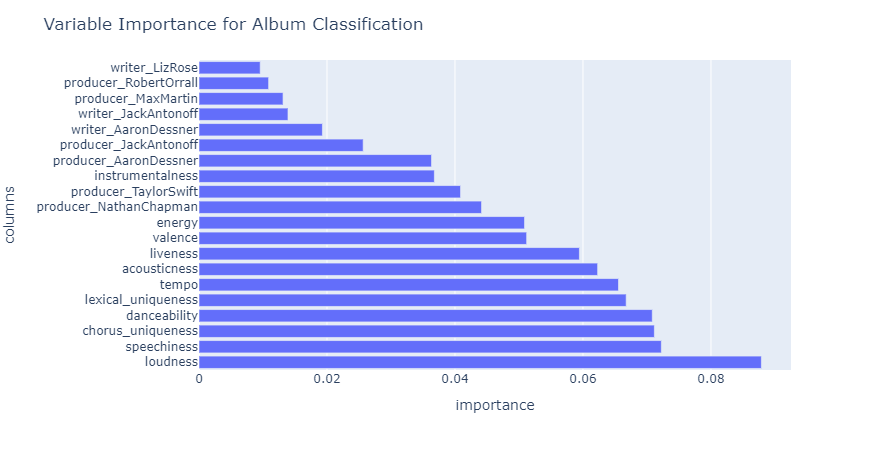

In [452]:
fig = px.bar(feature_importances, x="importance", y="columns", orientation='h')
fig.update_layout(title_text='Variable Importance for Album Classification')
fig.show()

In [453]:
fig.write_html("ts_variable_importance_album.html",include_plotlyjs="cdn")

In [454]:
feature_importances[['columns','importance']].to_csv('ts_feature_importance_multi.csv',index=False)

In [455]:
df_test_results.to_csv('final_classify_ts_album.csv',index=False)